# Different Modelling Iterations

## KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, stratify = y, random_state = 0)

In [ ]:
num_cols = ['age', 'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
            'number_diagnoses', 'preceding_year_visits', 'number_changes']

In [ ]:
X_train.loc[:, num_cols].skew()

age                     -0.621101
time_in_hospital         1.145219
num_lab_procedures      -0.242766
num_procedures           1.316956
num_medications          1.336549
number_diagnoses        -0.890263
preceding_year_visits    5.562799
number_changes           1.428450
dtype: float64

In [ ]:
X_train.loc[:, num_cols].isna().sum()

age                      0
time_in_hospital         0
num_lab_procedures       0
num_procedures           0
num_medications          0
number_diagnoses         0
preceding_year_visits    0
number_changes           0
dtype: int64

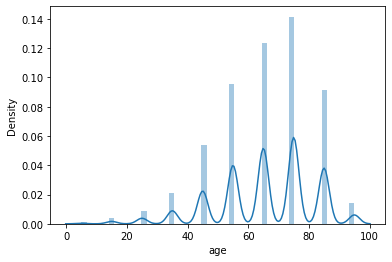

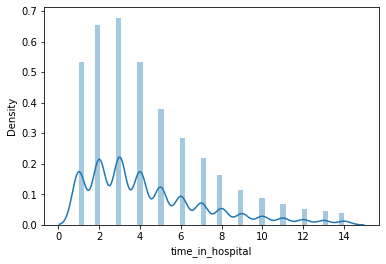

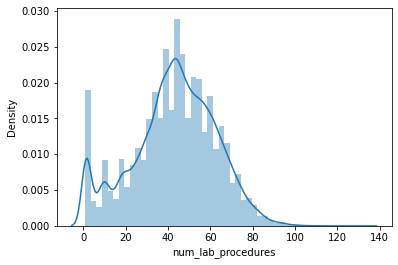

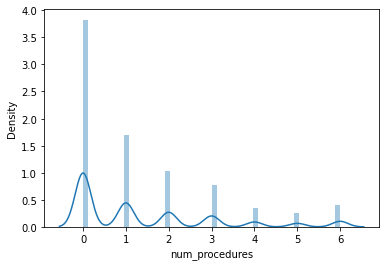

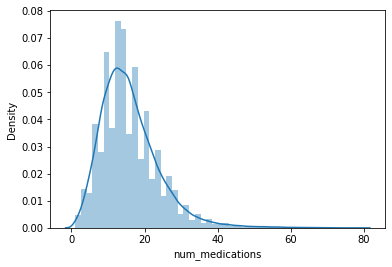

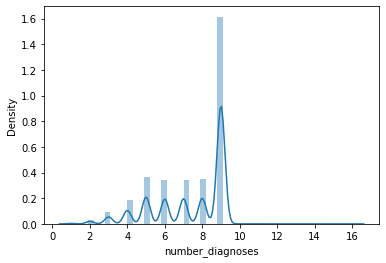

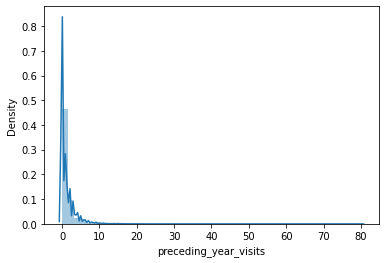

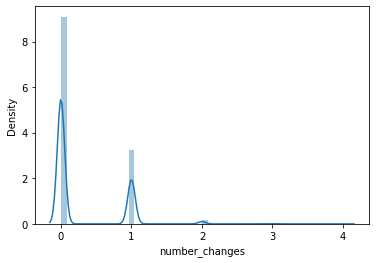

In [ ]:
for i in num_cols:
    sns.distplot(X_train[i])
    plt.show()

In [ ]:
num_cols = ['time_in_hospital', 'num_procedures', 'num_medications', 'preceding_year_visits', 'number_changes']

In [ ]:
X_train[num_cols] = np.sqrt(X_train[num_cols])

In [ ]:
X_train.loc[:, num_cols].isna().sum()

time_in_hospital         0
num_procedures           0
num_medications          0
preceding_year_visits    0
number_changes           0
dtype: int64

In [ ]:
X_train.loc[:, num_cols].skew()

time_in_hospital         0.479532
num_procedures           0.405080
num_medications          0.348020
preceding_year_visits    1.153480
number_changes           1.075283
dtype: float64

In [ ]:
X_test[num_cols] = np.sqrt(X_test[num_cols])

In [ ]:
X_test.loc[:, num_cols].isna().sum()

time_in_hospital         0
num_procedures           0
num_medications          0
preceding_year_visits    0
number_changes           0
dtype: int64

In [ ]:
X_test.loc[:, num_cols].skew()

time_in_hospital         0.470813
num_procedures           0.408212
num_medications          0.346887
preceding_year_visits    1.188993
number_changes           1.081575
dtype: float64

In [ ]:
mm = MinMaxScaler()
X_train = pd.DataFrame(mm.fit_transform(X_train), columns = X_train.columns)
X_test = pd.DataFrame(mm.transform(X_test), columns = X_test.columns)
X_train.head()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
0,0.0,0.444444,0.528691,0.396947,0.408248,0.555915,0.466667,0.333333,0.0,0.666667,0.000000,0.0,0.0,0.0,0.333333,1.0,0.158114,0.707107,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.888889,0.151081,0.320611,0.000000,0.494280,0.400000,0.000000,0.0,0.000000,0.666667,0.0,0.0,0.0,0.666667,1.0,0.193649,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,1.0,0.666667,0.000000,0.000000,0.408248,0.395921,0.133333,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.111803,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,1.0,0.888889,0.450847,0.312977,0.000000,0.440169,0.533333,0.000000,0.0,0.000000,1.000000,0.0,0.0,0.0,0.666667,1.0,0.000000,0.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

### Default KNN with Uniform Weights, p = 2

In [ ]:
model = KNeighborsClassifier(n_jobs = -1)
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 4.2816197872161865
Prediction Time: 362.8500118255615
Train Accuracy Score: 0.8900646072789886
Train Confusion Matrix:
 [[59730   435]
 [ 7035   749]] 

Train F1 Score: 0.1670383586083854
Train Precision Score: 0.6326013513513513
Train Recall Score: 0.09622302158273381
Train ROC_AUC Score: 0.8615979382323824

Test Accuracy Score: 0.8767556059201264
Test Confusion Matrix:
 [[25423   362]
 [ 3227   109]] 

Test F1 Score: 0.0572629366955608
Test Precision Score: 0.23142250530785563
Test Recall Score: 0.03267386091127098
Test ROC_AUC Score: 0.5464884869300604


### KNN with Distance Weights, p = 2

In [ ]:
model = KNeighborsClassifier(n_jobs = -1, weights = 'distance')
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 4.324774742126465
Prediction Time: 350.73760414123535
Train Accuracy Score: 0.999985283079957
Train Confusion Matrix:
 [[60165     0]
 [    1  7783]] 

Train F1 Score: 0.9999357615468619
Train Precision Score: 1.0
Train Recall Score: 0.9998715313463515
Train ROC_AUC Score: 0.9999999989323639

Test Accuracy Score: 0.8740084475121047
Test Confusion Matrix:
 [[25328   457]
 [ 3212   124]] 

Test F1 Score: 0.06331376053101863
Test Precision Score: 0.2134251290877797
Test Recall Score: 0.03717026378896882
Test ROC_AUC Score: 0.5466651983823064


## Balanced Bagging Classifier

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from imblearn.ensemble import BalancedBaggingClassifier
from sklearn.metrics import roc_curve, precision_recall_curve, classification_report, confusion_matrix
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, roc_auc_score
import time
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, stratify = y, random_state = 0)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((67949, 95), (29121, 95), (67949,), (29121,))

### Default model

In [ ]:
model = BalancedBaggingClassifier(random_state = 0, n_jobs = -1)
model.fit(X_train, y_train)

BalancedBaggingClassifier(base_estimator=None, bootstrap=True,
                          bootstrap_features=False, max_features=1.0,
                          max_samples=1.0, n_estimators=10, n_jobs=-1,
                          oob_score=False, random_state=0, ratio=None,
                          replacement=False, sampling_strategy='auto',
                          verbose=0, warm_start=False)

In [ ]:
model = BalancedBaggingClassifier(random_state = 0, n_jobs = -1)
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 3.782930612564087
Prediction Time: 0.3159489631652832
Train Accuracy Score: 0.882132187375826
Train Confusion Matrix:
 [[52506  7659]
 [  350  7434]] 

Train F1 Score: 0.6499103903483848
Train Precision Score: 0.49254621347644606
Train Recall Score: 0.9550359712230215
Train ROC_AUC Score: 0.9698641076453934

Test Accuracy Score: 0.7484633082655129
Test Confusion Matrix:
 [[20765  5020]
 [ 2305  1031]] 

Test F1 Score: 0.21966549483328007
Test Precision Score: 0.17038506032060816
Test Recall Score: 0.309052757793765
Test ROC_AUC Score: 0.606858666644346


## AdaBoost

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.ensemble import AdaBoostClassifier
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.over_sampling import SMOTE, SMOTENC, RandomOverSampler
from imblearn.combine import SMOTETomek
from scipy.stats import uniform, randint

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,glyburide-metformin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,-2,0,-2,-2,-2,0,-2,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 30)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, random_state = 0, stratify = y)

In [ ]:
model = AdaBoostClassifier(random_state = 0)
model.fit(X_train, y_train)
sorted(zip(model.feature_importances_, X_train.columns), reverse = True)

[(0.16, 'preceding_year_visits'),
 (0.08, 'time_in_hospital'),
 (0.08, 'age'),
 (0.06, 'num_medications'),
 (0.02, 'number_diagnoses'),
 (0.02, 'num_procedures'),
 (0.02, 'num_lab_procedures'),
 (0.02, 'metformin'),
 (0.02, 'insulin_treatment_insulin_only'),
 (0.02, 'insulin'),
 (0.02, 'gender'),
 (0.02, 'discharge_disposition_id_Transferred to another medical facility'),
 (0.02, 'discharge_disposition_id_Still patient/referred to this institution'),
 (0.02, 'discharge_disposition_id_Not Available'),
 (0.02, 'discharge_disposition_id_Left AMA'),
 (0.02,
  'discharge_disposition_id_Discharged to home with home health service'),
 (0.02, 'diag_3_Pregnancy, Childbirth'),
 (0.02, 'diag_3_Neoplasms'),
 (0.02, 'diag_3_External causes of injury'),
 (0.02, 'diag_3_Endocrine, Nutritional, Metabolic, Immunity'),
 (0.02, 'diag_3_Circulatory'),
 (0.02, 'diag_2_Pregnancy, Childbirth'),
 (0.02, 'diag_2_Neoplasms'),
 (0.02, 'diag_2_Diabetes'),
 (0.02, 'diag_1_Sense Organs'),
 (0.02, 'diag_1_Respirator

In [ ]:
fi_df = pd.DataFrame({'Features' : X_train.columns, 'Importances' : model.feature_importances_})
fi_df

,Features,Importances
0,gender,0.02
1,age,0.08
2,time_in_hospital,0.08
3,num_lab_procedures,0.02
4,num_procedures,0.02
5,num_medications,0.06
6,number_diagnoses,0.02
7,metformin,0.02
8,repaglinide,0.00
9,nateglinide,0.00


In [ ]:
imp = fi_df[fi_df['Importances'] >= 0]['Features']
print("Number of features:", len(imp))
model = AdaBoostClassifier(random_state = 0)
model.fit(X_train[imp], y_train)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

Number of features: 97
[[25783     2]
 [ 3334     2]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.50      0.00      0.00      3336

    accuracy                           0.89     29121
   macro avg       0.69      0.50      0.47     29121
weighted avg       0.84      0.89      0.83     29121

ROC_AUC: 0.6560870849568164


In [ ]:
imp = fi_df[fi_df['Importances'] > 0]['Features']
print("Number of features:", len(imp))
model = AdaBoostClassifier(random_state = 0)
model.fit(X_train[imp], y_train)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

Number of features: 35
[[25783     2]
 [ 3334     2]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.50      0.00      0.00      3336

    accuracy                           0.89     29121
   macro avg       0.69      0.50      0.47     29121
weighted avg       0.84      0.89      0.83     29121

ROC_AUC: 0.6560870849568164


### Sampling Techniques

#### Under Sampling

In [ ]:
rus = RandomUnderSampler(random_state = 0)
X_rus, y_rus = rus.fit_resample(X_train[imp], y_train)
model = AdaBoostClassifier(random_state = 0)
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[16566  9219]
 [ 1406  1930]]
              precision    recall  f1-score   support

           0       0.92      0.64      0.76     25785
           1       0.17      0.58      0.27      3336

    accuracy                           0.64     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.84      0.64      0.70     29121

ROC_AUC: 0.6531558406561545


#### Over Sampling

In [ ]:
ros = RandomOverSampler(random_state = 0)
X_ros, y_ros = ros.fit_resample(X_train[imp], y_train)
model = AdaBoostClassifier(random_state = 0)
model.fit(X_ros, y_ros)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[16488  9297]
 [ 1390  1946]]
              precision    recall  f1-score   support

           0       0.92      0.64      0.76     25785
           1       0.17      0.58      0.27      3336

    accuracy                           0.63     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.84      0.63      0.70     29121

ROC_AUC: 0.6563384022276071


#### SMOTE

In [ ]:
sm = SMOTE(random_state = 0, n_jobs = -1)
X_sm, y_sm = sm.fit_resample(X_train[imp], y_train)
model = AdaBoostClassifier(random_state = 0)
model.fit(X_sm, y_sm)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[19730  6055]
 [ 2506   830]]
              precision    recall  f1-score   support

           0       0.89      0.77      0.82     25785
           1       0.12      0.25      0.16      3336

    accuracy                           0.71     29121
   macro avg       0.50      0.51      0.49     29121
weighted avg       0.80      0.71      0.75     29121

ROC_AUC: 0.5220423893578564


#### SmoteTomek

In [ ]:
smtmk = SMOTETomek(random_state = 0)
X_smtmk, y_smtmk = sm.fit_resample(X_train[imp], y_train)
model = AdaBoostClassifier(random_state = 0)
model.fit(X_smtmk, y_smtmk)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[19730  6055]
 [ 2506   830]]
              precision    recall  f1-score   support

           0       0.89      0.77      0.82     25785
           1       0.12      0.25      0.16      3336

    accuracy                           0.71     29121
   macro avg       0.50      0.51      0.49     29121
weighted avg       0.80      0.71      0.75     29121

ROC_AUC: 0.5220423893578564


### Hyper-Parameter Tuning

In [ ]:
X_rus.shape, X_ros.shape

((15568, 35), (120330, 35))

In [ ]:
np.logspace(-1, 1, 100)

array([ 0.1       ,  0.10476158,  0.10974988,  0.1149757 ,  0.12045035,
        0.12618569,  0.13219411,  0.13848864,  0.14508288,  0.15199111,
        0.15922828,  0.16681005,  0.17475284,  0.18307383,  0.19179103,
        0.2009233 ,  0.21049041,  0.22051307,  0.23101297,  0.24201283,
        0.25353645,  0.26560878,  0.27825594,  0.29150531,  0.30538555,
        0.31992671,  0.33516027,  0.35111917,  0.36783798,  0.38535286,
        0.40370173,  0.42292429,  0.44306215,  0.46415888,  0.48626016,
        0.5094138 ,  0.53366992,  0.55908102,  0.58570208,  0.61359073,
        0.64280731,  0.67341507,  0.70548023,  0.7390722 ,  0.77426368,
        0.81113083,  0.84975344,  0.89021509,  0.93260335,  0.97700996,
        1.02353102,  1.07226722,  1.12332403,  1.17681195,  1.23284674,
        1.29154967,  1.35304777,  1.41747416,  1.48496826,  1.55567614,
        1.62975083,  1.70735265,  1.78864953,  1.87381742,  1.96304065,
        2.05651231,  2.15443469,  2.25701972,  2.36448941,  2.47

In [ ]:
model = AdaBoostClassifier(random_state = 0)
params = {'n_estimators' : np.arange(100, 1000),
          'learning_rate' : np.logspace(-1, 1, 100)}
rsearch = RandomizedSearchCV(model, params, n_iter = 50, scoring = 'recall', n_jobs = -1,
                             cv = 5, verbose = 1, random_state = 0)
rsearch.fit(X_ros, y_ros)
rsearch.best_score_, rsearch.best_params_

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 31.0min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed: 122.8min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 163.3min finished


In [ ]:
model = AdaBoostClassifier(random_state = 0)
params = {'n_estimators' : np.arange(100, 1000),
          'learning_rate' : np.logspace(-1, 1, 100)}
rsearch = RandomizedSearchCV(model, params, n_iter = 50, scoring = 'recall', n_jobs = -1,
                             cv = 5, verbose = 1, random_state = 0)
rsearch.fit(X_rus, y_rus)
rsearch.best_score_, rsearch.best_params_

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed: 14.5min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 18.9min finished


(1.0, {'learning_rate': 6.280291441834256, 'n_estimators': 471})

In [ ]:
rsearch.best_score_

1.0

In [ ]:
model = rsearch.best_estimator_
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

[[    0 25785]
 [    0  3336]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00     25785
           1       0.11      1.00      0.21      3336

    accuracy                           0.11     29121
   macro avg       0.06      0.50      0.10     29121
weighted avg       0.01      0.11      0.02     29121

ROC_AUC: 0.5819535471099561


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Gradient Boost

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.ensemble import GradientBoostingClassifier
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.over_sampling import SMOTE, SMOTENC, RandomOverSampler
from imblearn.combine import SMOTETomek
from scipy.stats import uniform, randint

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,glyburide-metformin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,-2,0,-2,-2,-2,0,-2,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 30)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, random_state = 0, stratify = y)

In [ ]:
model = GradientBoostingClassifier(random_state = 0)
model.fit(X_train, y_train)
sorted(zip(model.feature_importances_, X_train.columns), reverse = True)

[(0.4399437961887246, 'preceding_year_visits'),
 (0.14916716517337786,
  'discharge_disposition_id_Transferred to another medical facility'),
 (0.03675321674542318, 'age'),
 (0.03235826126558023, 'number_diagnoses'),
 (0.028345531759157275, 'num_medications'),
 (0.024792976799512024, 'time_in_hospital'),
 (0.02413955481848056, 'insulin_treatment_insulin_only'),
 (0.022673720381530982, 'diag_1_External causes of injury'),
 (0.01781331252490117, 'num_lab_procedures'),
 (0.017286799536575477,
  'discharge_disposition_id_Still patient/referred to this institution'),
 (0.012095674943428605, 'diag_2_Neoplasms'),
 (0.011103871875848827, 'diag_3_Neoplasms'),
 (0.010302500664576027, 'diag_2_Diabetes'),
 (0.007182684718835615, 'diag_1_Respiratory'),
 (0.007082551679241033, 'diag_1_Diabetes'),
 (0.006951132874845997, 'diag_1_Musculoskeletal System and Connective Tissue'),
 (0.006440853440397732, 'diag_1_Circulatory'),
 (0.00626544984663948,
  'discharge_disposition_id_Discharged to home with home

In [ ]:
fi_df = pd.DataFrame({'Features' : X_train.columns, 'Importances' : model.feature_importances_})
fi_df

,Features,Importances
0,gender,0.000668
1,age,0.036753
2,time_in_hospital,0.024793
3,num_lab_procedures,0.017813
4,num_procedures,0.004263
5,num_medications,0.028346
6,number_diagnoses,0.032358
7,metformin,0.005385
8,repaglinide,0.004177
9,nateglinide,0.000000


In [ ]:
imp = fi_df[fi_df['Importances'] >= 0]['Features']
print("Number of features:", len(imp))
model = GradientBoostingClassifier(random_state = 0)
model.fit(X_train[imp], y_train)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

Number of features: 97
[[25775    10]
 [ 3317    19]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.66      0.01      0.01      3336

    accuracy                           0.89     29121
   macro avg       0.77      0.50      0.48     29121
weighted avg       0.86      0.89      0.83     29121

ROC_AUC: 0.6631890357405757


In [ ]:
imp = fi_df[fi_df['Importances'] >= 0.01]['Features']
print("Number of features:", len(imp))
model = GradientBoostingClassifier(random_state = 0)
model.fit(X_train[imp], y_train)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

Number of features: 13
[[25775    10]
 [ 3318    18]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.64      0.01      0.01      3336

    accuracy                           0.89     29121
   macro avg       0.76      0.50      0.48     29121
weighted avg       0.86      0.89      0.83     29121

ROC_AUC: 0.6562559144075083


### Sampling Techniques

#### Under Sampling

In [ ]:
rus = RandomUnderSampler(random_state = 0)
X_rus, y_rus = rus.fit_resample(X_train[imp], y_train)
model = GradientBoostingClassifier(random_state = 0)
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[15700 10085]
 [ 1277  2059]]
              precision    recall  f1-score   support

           0       0.92      0.61      0.73     25785
           1       0.17      0.62      0.27      3336

    accuracy                           0.61     29121
   macro avg       0.55      0.61      0.50     29121
weighted avg       0.84      0.61      0.68     29121

ROC_AUC: 0.6539001085344638


#### Over Sampling

In [ ]:
ros = RandomOverSampler(random_state = 0)
X_ros, y_ros = ros.fit_resample(X_train[imp], y_train)
model = GradientBoostingClassifier(random_state = 0)
model.fit(X_ros, y_ros)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[15816  9969]
 [ 1303  2033]]
              precision    recall  f1-score   support

           0       0.92      0.61      0.74     25785
           1       0.17      0.61      0.27      3336

    accuracy                           0.61     29121
   macro avg       0.55      0.61      0.50     29121
weighted avg       0.84      0.61      0.68     29121

ROC_AUC: 0.6547157038766892


#### SMOTE

In [ ]:
sm = SMOTE(random_state = 0, n_jobs = -1)
X_sm, y_sm = sm.fit_resample(X_train[imp], y_train)
model = GradientBoostingClassifier(random_state = 0)
model.fit(X_sm, y_sm)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[13928 11857]
 [ 1754  1582]]
              precision    recall  f1-score   support

           0       0.89      0.54      0.67     25785
           1       0.12      0.47      0.19      3336

    accuracy                           0.53     29121
   macro avg       0.50      0.51      0.43     29121
weighted avg       0.80      0.53      0.62     29121

ROC_AUC: 0.5256856701956643


#### SmoteTomek

In [ ]:
smtmk = SMOTETomek(random_state = 0)
X_smtmk, y_smtmk = sm.fit_resample(X_train[imp], y_train)
model = GradientBoostingClassifier(random_state = 0)
model.fit(X_smtmk, y_smtmk)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[13928 11857]
 [ 1754  1582]]
              precision    recall  f1-score   support

           0       0.89      0.54      0.67     25785
           1       0.12      0.47      0.19      3336

    accuracy                           0.53     29121
   macro avg       0.50      0.51      0.43     29121
weighted avg       0.80      0.53      0.62     29121

ROC_AUC: 0.5256856701956643


### Hyper-Parameter Tuning

In [ ]:
X_rus.shape, X_ros.shape

((15568, 13), (120330, 13))

In [ ]:
np.logspace(-2, 0, 100)

array([0.01      , 0.01047616, 0.01097499, 0.01149757, 0.01204504,
       0.01261857, 0.01321941, 0.01384886, 0.01450829, 0.01519911,
       0.01592283, 0.01668101, 0.01747528, 0.01830738, 0.0191791 ,
       0.02009233, 0.02104904, 0.02205131, 0.0231013 , 0.02420128,
       0.02535364, 0.02656088, 0.02782559, 0.02915053, 0.03053856,
       0.03199267, 0.03351603, 0.03511192, 0.0367838 , 0.03853529,
       0.04037017, 0.04229243, 0.04430621, 0.04641589, 0.04862602,
       0.05094138, 0.05336699, 0.0559081 , 0.05857021, 0.06135907,
       0.06428073, 0.06734151, 0.07054802, 0.07390722, 0.07742637,
       0.08111308, 0.08497534, 0.08902151, 0.09326033, 0.097701  ,
       0.1023531 , 0.10722672, 0.1123324 , 0.1176812 , 0.12328467,
       0.12915497, 0.13530478, 0.14174742, 0.14849683, 0.15556761,
       0.16297508, 0.17073526, 0.17886495, 0.18738174, 0.19630407,
       0.20565123, 0.21544347, 0.22570197, 0.23644894, 0.24770764,
       0.25950242, 0.27185882, 0.28480359, 0.29836472, 0.31257

In [ ]:
model = GradientBoostingClassifier(random_state = 0)

params = {'n_estimators' : np.arange(100, 500),
          'learning_rate' : np.logspace(-2, 0, 100),
          'min_samples_split' : np.arange(2, 50),
          'min_samples_leaf' : np.arange(1, 50),
          'max_depth' : np.arange(3, 30),
          'max_features' : np.arange(1, 13),}

rsearch = RandomizedSearchCV(model, params, n_iter = 10, scoring = 'recall', n_jobs = -1,
                             cv = 5, verbose = 1, random_state = 0)
rsearch.fit(X_rus, y_rus)
rsearch.best_score_, rsearch.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  7.5min finished


(0.5874881330354829,
 {'learning_rate': 0.011497569953977356,
  'max_depth': 25,
  'max_features': 9,
  'min_samples_leaf': 37,
  'min_samples_split': 10,
  'n_estimators': 368})

In [ ]:
model = GradientBoostingClassifier(random_state = 0)

params = {'n_estimators' : np.arange(300, 500),
          'learning_rate' : np.logspace(-3, -1, 100),
          'min_samples_split' : np.arange(5, 15),
          'min_samples_leaf' : np.arange(30, 60),
          'max_depth' : np.arange(20, 40),
          'max_features' : np.arange(1, 13),}

rsearch = RandomizedSearchCV(model, params, n_iter = 10, scoring = 'recall', n_jobs = -1,
                             cv = 5, verbose = 1, random_state = 0)
rsearch.fit(X_ros, y_ros)
rsearch.best_score_, rsearch.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 103.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 110.4min finished


(0.9988199119089172,
 {'learning_rate': 0.05994842503189412,
  'max_depth': 34,
  'max_features': 11,
  'min_samples_leaf': 40,
  'min_samples_split': 11,
  'n_estimators': 499})

In [ ]:
model = rsearch.best_estimator_
model.fit(X_ros, y_ros)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

[[24168  1617]
 [ 2995   341]]
              precision    recall  f1-score   support

           0       0.89      0.94      0.91     25785
           1       0.17      0.10      0.13      3336

    accuracy                           0.84     29121
   macro avg       0.53      0.52      0.52     29121
weighted avg       0.81      0.84      0.82     29121

ROC_AUC: 0.5750269185466054


## CatBoost

In [ ]:
pip install catboost

     |████████████████████████████████| 66.1MB 56kB/s 


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from catboost import CatBoostClassifier
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.over_sampling import SMOTE, SMOTENC, RandomOverSampler
from imblearn.combine import SMOTETomek
from scipy.stats import randint, uniform
import matplotlib.pyplot as plt
import seaborn as sns

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0, stratify = y)

In [ ]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((67949, 27), (29121, 27), (67949,), (29121,))

In [ ]:
df.columns

Index(['race', 'gender', 'age', 'discharge_disposition_id',
       'admission_source_id', 'time_in_hospital', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'diag_1', 'diag_2', 'diag_3',
       'number_diagnoses', 'max_glu_serum', 'A1Cresult', 'metformin',
       'repaglinide', 'glimepiride', 'glipizide', 'glyburide', 'pioglitazone',
       'rosiglitazone', 'insulin', 'diabetesMed', 'readmitted',
       'preceding_year_visits', 'number_changes', 'insulin_treatment'],
      dtype='object')

In [ ]:
cat_cols = ['race', 'gender','discharge_disposition_id',
       'admission_source_id','diag_1', 'diag_2', 'diag_3','max_glu_serum', 'A1Cresult', 'metformin',
       'repaglinide', 'glimepiride', 'glipizide', 'glyburide', 'pioglitazone',
       'rosiglitazone', 'insulin', 'diabetesMed','insulin_treatment']

In [ ]:
model = CatBoostClassifier(iterations=1000,
                           learning_rate=1,
                           depth=2,
                           custom_metric=['Logloss',
                                          'AUC:hints=skip_train~false'],
                           eval_metric='AUC')
model.fit(X_train, y_train, cat_cols)

0:	learn: 0.5519594	total: 86.9ms	remaining: 1m 26s
1:	learn: 0.6269531	total: 173ms	remaining: 1m 26s
2:	learn: 0.6305182	total: 229ms	remaining: 1m 16s
3:	learn: 0.6354729	total: 310ms	remaining: 1m 17s
4:	learn: 0.6382814	total: 398ms	remaining: 1m 19s
5:	learn: 0.6382302	total: 474ms	remaining: 1m 18s
6:	learn: 0.6381445	total: 558ms	remaining: 1m 19s
7:	learn: 0.6392684	total: 641ms	remaining: 1m 19s
8:	learn: 0.6412110	total: 721ms	remaining: 1m 19s
9:	learn: 0.6426964	total: 802ms	remaining: 1m 19s
10:	learn: 0.6433517	total: 876ms	remaining: 1m 18s
11:	learn: 0.6440355	total: 989ms	remaining: 1m 21s
12:	learn: 0.6445652	total: 1.08s	remaining: 1m 22s
13:	learn: 0.6448205	total: 1.16s	remaining: 1m 21s
14:	learn: 0.6455258	total: 1.24s	remaining: 1m 21s
15:	learn: 0.6457408	total: 1.33s	remaining: 1m 21s
16:	learn: 0.6458730	total: 1.42s	remaining: 1m 21s
17:	learn: 0.6472017	total: 1.49s	remaining: 1m 21s
18:	learn: 0.6471497	total: 1.55s	remaining: 1m 20s
19:	learn: 0.6476795	

In [ ]:
sorted(zip(model.feature_importances_, X_train.columns), reverse = True)

[(21.16344710410936, 'preceding_year_visits'),
 (13.120540082162375, 'discharge_disposition_id'),
 (9.63231079639619, 'num_lab_procedures'),
 (8.339343928504254, 'num_medications'),
 (5.657398489477756, 'diag_1'),
 (4.831571152869214, 'diag_2'),
 (4.387945267158941, 'diag_3'),
 (3.986187390143605, 'age'),
 (3.8801958337036533, 'number_diagnoses'),
 (3.2052071099826067, 'time_in_hospital'),
 (2.7127920776883676, 'num_procedures'),
 (2.042876529430825, 'glipizide'),
 (1.9583275258321498, 'admission_source_id'),
 (1.645728366666784, 'metformin'),
 (1.4223188603723393, 'glyburide'),
 (1.3996241044601034, 'race'),
 (1.3858759282315225, 'insulin'),
 (1.3349398018568215, 'pioglitazone'),
 (1.2876939137319086, 'A1Cresult'),
 (1.2370173317808641, 'rosiglitazone'),
 (1.1720197461307336, 'insulin_treatment'),
 (1.1604526458889748, 'max_glu_serum'),
 (1.0367151338632496, 'diabetesMed'),
 (1.0074862881463442, 'glimepiride'),
 (0.6624401809271757, 'repaglinide'),
 (0.16755517316739674, 'number_chang

In [ ]:
# Get predicted classes
preds_class = model.predict(X_test)
# Get predicted probabilities for each class
preds_proba = model.predict_proba(X_test)[:, 1]
print(model.get_best_score())
print(model.get_best_iteration())

{'learn': {'Logloss': 0.322644913214853, 'AUC': 0.7113091832336034}}
None


In [ ]:
print(confusion_matrix(y_test, preds_class))
print(classification_report(y_test, preds_class))
print("ROC_AUC:", roc_auc_score(y_test, preds_proba))

[[25709    76]
 [ 3289    47]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.38      0.01      0.03      3336

    accuracy                           0.88     29121
   macro avg       0.63      0.51      0.48     29121
weighted avg       0.83      0.88      0.83     29121

ROC_AUC: 0.6414908038665054


In [ ]:
model1 = CatBoostClassifier(iterations=1000,
                           learning_rate=1,
                           depth=2,
                           custom_metric=['Logloss',
                                          'AUC:hints=skip_train~false'],
                           eval_metric='AUC',
                            scale_pos_weight = 8)
model1.fit(X_train, y_train, cat_cols)

0:	learn: 0.6074605	total: 95.4ms	remaining: 1m 35s
1:	learn: 0.6281511	total: 190ms	remaining: 1m 34s
2:	learn: 0.6317146	total: 284ms	remaining: 1m 34s
3:	learn: 0.6333784	total: 371ms	remaining: 1m 32s
4:	learn: 0.6349182	total: 455ms	remaining: 1m 30s
5:	learn: 0.6364296	total: 523ms	remaining: 1m 26s
6:	learn: 0.6372732	total: 607ms	remaining: 1m 26s
7:	learn: 0.6390364	total: 704ms	remaining: 1m 27s
8:	learn: 0.6410865	total: 790ms	remaining: 1m 26s
9:	learn: 0.6417283	total: 881ms	remaining: 1m 27s
10:	learn: 0.6423683	total: 962ms	remaining: 1m 26s
11:	learn: 0.6430617	total: 1.04s	remaining: 1m 25s
12:	learn: 0.6435979	total: 1.12s	remaining: 1m 24s
13:	learn: 0.6441744	total: 1.21s	remaining: 1m 25s
14:	learn: 0.6448855	total: 1.3s	remaining: 1m 25s
15:	learn: 0.6469689	total: 1.39s	remaining: 1m 25s
16:	learn: 0.6479843	total: 1.47s	remaining: 1m 25s
17:	learn: 0.6487874	total: 1.55s	remaining: 1m 24s
18:	learn: 0.6491512	total: 1.65s	remaining: 1m 25s
19:	learn: 0.6500667	t

In [ ]:
sorted(zip(model1.feature_importances_, X_train.columns), reverse = True)

[(15.166917164284383, 'preceding_year_visits'),
 (11.634620348585829, 'num_lab_procedures'),
 (9.951043583456459, 'num_medications'),
 (9.248532138787539, 'discharge_disposition_id'),
 (5.457221315413508, 'diag_1'),
 (5.316054875284089, 'age'),
 (5.063047366540265, 'number_diagnoses'),
 (4.78155130431987, 'diag_3'),
 (4.133306850024179, 'diag_2'),
 (3.5433706832753797, 'time_in_hospital'),
 (2.7850625295435134, 'pioglitazone'),
 (2.4367855172398376, 'num_procedures'),
 (2.309231219829073, 'race'),
 (1.9695266423622269, 'metformin'),
 (1.8777701095951975, 'admission_source_id'),
 (1.8728896779839384, 'insulin_treatment'),
 (1.7491823631235612, 'A1Cresult'),
 (1.6164272710742995, 'glipizide'),
 (1.5895177066865496, 'glyburide'),
 (1.5458092498350562, 'insulin'),
 (1.153249929436165, 'max_glu_serum'),
 (1.107582655926806, 'rosiglitazone'),
 (0.9909216469094304, 'glimepiride'),
 (0.9570782900025966, 'number_changes'),
 (0.9126838184894702, 'repaglinide'),
 (0.6271380422556807, 'gender'),
 

In [ ]:
# Get predicted classes
preds_class = model1.predict(X_test)
# Get predicted probabilities for each class
preds_proba = model1.predict_proba(X_test)[:, 1]
print(model1.get_best_score())
print(model1.get_best_iteration())

{'learn': {'Logloss:use_weights=false': 0.6231434069500671, 'Logloss:use_weights=true': 0.6070360448689232, 'Logloss': 0.6070360448689232, 'AUC': 0.7246344349886049}}
None


In [ ]:
print(confusion_matrix(y_test, preds_class))
print(classification_report(y_test, preds_class))
print("ROC_AUC:", roc_auc_score(y_test, preds_proba))

[[16382  9403]
 [ 1451  1885]]
              precision    recall  f1-score   support

           0       0.92      0.64      0.75     25785
           1       0.17      0.57      0.26      3336

    accuracy                           0.63     29121
   macro avg       0.54      0.60      0.50     29121
weighted avg       0.83      0.63      0.69     29121

ROC_AUC: 0.6420678059065256


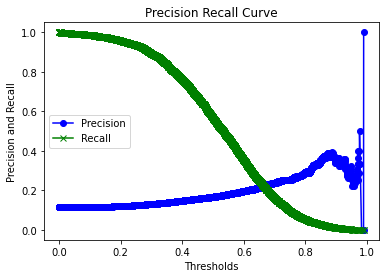

In [ ]:
prec, rec, thresh = precision_recall_curve(y_test, preds_proba)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'best')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Curve')
plt.show()

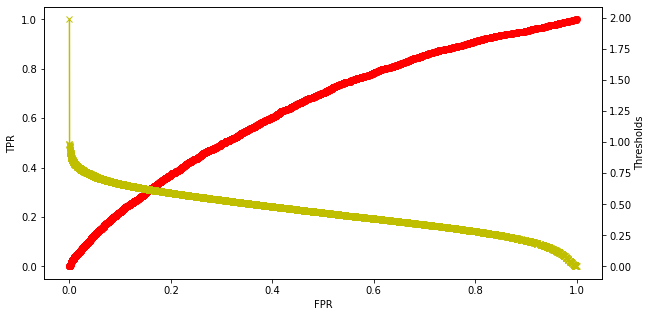

In [ ]:
fpr, tpr, thresh = roc_curve(y_test, preds_proba)
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(fpr, tpr, marker = 'o', c = 'r')
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax1 = ax.twinx()
ax1.plot(fpr, thresh, marker = 'x', c = 'y')
ax1.set_ylabel('Thresholds')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (preds_proba >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.139281,0.207832,0.116163,0.985612
1,0.15,0.158683,0.209881,0.117592,0.975420
2,0.20,0.190962,0.213356,0.120050,0.957734
3,0.25,0.239861,0.220014,0.124661,0.935851
4,0.30,0.305484,0.227375,0.130292,0.892086
5,0.35,0.385014,0.237493,0.138405,0.836031
6,0.40,0.470039,0.247648,0.147872,0.761391
7,0.45,0.552316,0.255667,0.157910,0.671163
8,0.50,0.627279,0.257795,0.166991,0.565048
9,0.55,0.698122,0.261074,0.181404,0.465528


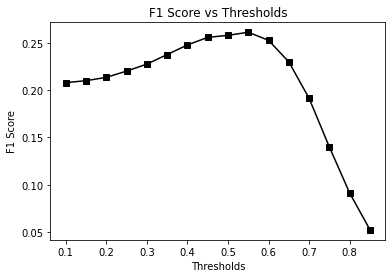

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'k')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Thresholds')
plt.show()

## Logistic Regression

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import PowerTransformer, MinMaxScaler, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, precision_recall_curve, classification_report, confusion_matrix
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, roc_auc_score

In [ ]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv('Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,glyburide-metformin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,-2,0,-2,-2,-2,0,-2,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 30)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, stratify = y, random_state = 0)

In [ ]:
num_cols = ['age', 'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
            'number_diagnoses', 'preceding_year_visits', 'number_changes']

In [ ]:
X_train.loc[:, num_cols].skew()

age                     -0.621101
time_in_hospital         1.145219
num_lab_procedures      -0.242766
num_procedures           1.316956
num_medications          1.336549
number_diagnoses        -0.890263
preceding_year_visits    5.562799
number_changes           1.428450
dtype: float64

In [ ]:
X_train.loc[:, num_cols].isna().sum()

age                      0
time_in_hospital         0
num_lab_procedures       0
num_procedures           0
num_medications          0
number_diagnoses         0
preceding_year_visits    0
number_changes           0
dtype: int64

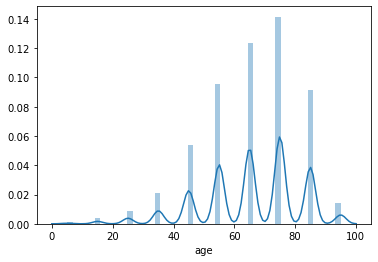

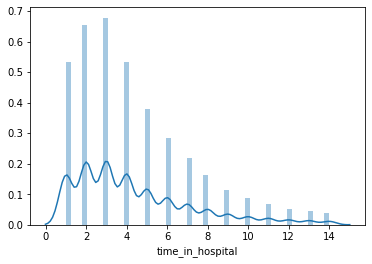

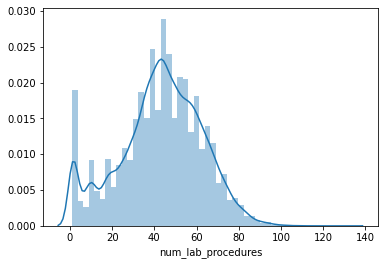

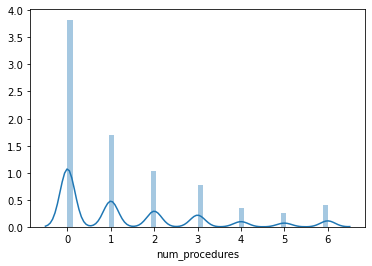

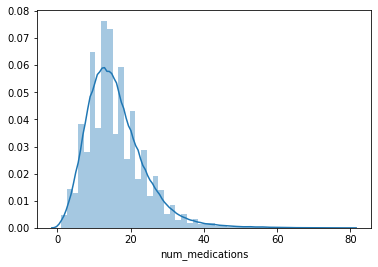

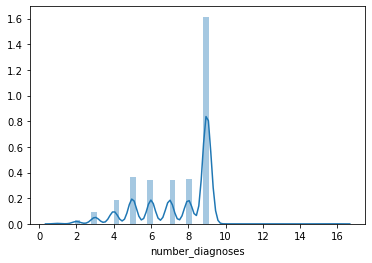

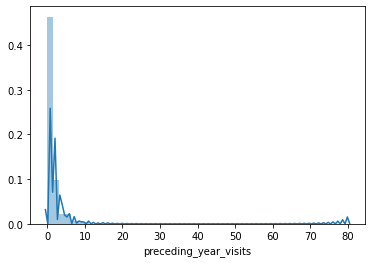

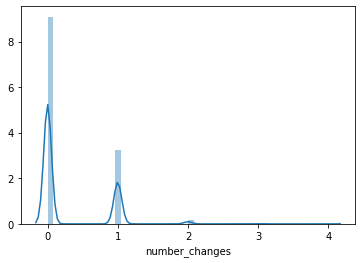

In [ ]:
for i in num_cols:
    sns.distplot(X_train[i])
    plt.show()

In [ ]:
num_cols = ['time_in_hospital', 'num_procedures', 'num_medications', 'preceding_year_visits', 'number_changes']

In [ ]:
X_train[num_cols] = np.sqrt(X_train[num_cols])

In [ ]:
X_train.loc[:, num_cols].isna().sum()

time_in_hospital         0
num_procedures           0
num_medications          0
preceding_year_visits    0
number_changes           0
dtype: int64

In [ ]:
X_train.loc[:, num_cols].skew()

time_in_hospital         0.479532
num_procedures           0.405080
num_medications          0.348020
preceding_year_visits    1.153480
number_changes           1.075283
dtype: float64

In [ ]:
X_test[num_cols] = np.sqrt(X_test[num_cols])

In [ ]:
X_test.loc[:, num_cols].isna().sum()

time_in_hospital         0
num_procedures           0
num_medications          0
preceding_year_visits    0
number_changes           0
dtype: int64

In [ ]:
X_test.loc[:, num_cols].skew()

time_in_hospital         0.470813
num_procedures           0.408212
num_medications          0.346887
preceding_year_visits    1.188993
number_changes           1.081575
dtype: float64

In [ ]:
mm = MinMaxScaler()
X_train = pd.DataFrame(mm.fit_transform(X_train), columns = X_train.columns)
X_test = pd.DataFrame(mm.transform(X_test), columns = X_test.columns)
X_train.head()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,nateglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,glyburide-metformin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
0,0.0,0.444444,0.528691,0.396947,0.408248,0.555915,0.466667,0.333333,0.0,0.0,0.666667,0.000000,0.0,0.0,0.0,0.333333,0.0,1.0,0.158114,0.707107,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.888889,0.151081,0.320611,0.000000,0.494280,0.400000,0.000000,0.0,0.0,0.000000,0.666667,0.0,0.0,0.0,0.666667,0.0,1.0,0.193649,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,1.0,0.666667,0.000000,0.000000,0.408248,0.395921,0.133333,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.111803,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,1.0,0.888889,0.450847,0.312977,0.000000,0.440169,0.533333,0.000000,0.0,0.0,0.000000,1.000000,0.0,0.0,0.0,0.666667,0.0,1.0,0.000000,0.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

### Different Paramaters Tuning

#### l1 penalty with different solvers

In [ ]:
for i in ['liblinear', 'saga']:
    print(i)
    lr = LogisticRegression(penalty = 'l1', solver = i)
    lr.fit(X_train, y_train)
    pred = lr.predict(X_test)
    proba = lr.predict_proba(X_test)[:, 1]
    print(confusion_matrix(y_test, pred))
    print(classification_report(y_test, pred))
    print(roc_auc_score(y_test, proba))
    print()

liblinear
[[25776     9]
 [ 3335     1]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.10      0.00      0.00      3336

    accuracy                           0.89     29121
   macro avg       0.49      0.50      0.47     29121
weighted avg       0.80      0.89      0.83     29121

0.6549708749579743

saga
[[25776     9]
 [ 3335     1]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.10      0.00      0.00      3336

    accuracy                           0.89     29121
   macro avg       0.49      0.50      0.47     29121
weighted avg       0.80      0.89      0.83     29121

0.6551199587159824



##### With class weight

In [ ]:
for i in ['liblinear', 'saga']:
    print(i)
    lr = LogisticRegression(penalty = 'l1', solver = i, class_weight = 'balanced')
    lr.fit(X_train, y_train)
    pred = lr.predict(X_test)
    proba = lr.predict_proba(X_test)[:, 1]
    print(confusion_matrix(y_test, pred))
    print(classification_report(y_test, pred))
    print(roc_auc_score(y_test, proba))
    print()

liblinear
[[16322  9463]
 [ 1349  1987]]
              precision    recall  f1-score   support

           0       0.92      0.63      0.75     25785
           1       0.17      0.60      0.27      3336

    accuracy                           0.63     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.84      0.63      0.70     29121

0.6565092254294296

saga
[[16313  9472]
 [ 1349  1987]]
              precision    recall  f1-score   support

           0       0.92      0.63      0.75     25785
           1       0.17      0.60      0.27      3336

    accuracy                           0.63     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.84      0.63      0.70     29121

0.6565317902745866



#### l2 penalty with different solvers with class weight

In [ ]:
for i in ['liblinear', 'saga', 'newton-cg', 'sag', 'lbfgs']:
    print(i)
    lr = LogisticRegression(penalty = 'l2', solver = i, class_weight = 'balanced')
    lr.fit(X_train, y_train)
    pred = lr.predict(X_test)
    proba = lr.predict_proba(X_test)[:, 1]
    print(confusion_matrix(y_test, pred))
    print(classification_report(y_test, pred))
    print(roc_auc_score(y_test, proba))
    print()

liblinear
[[16307  9478]
 [ 1352  1984]]
              precision    recall  f1-score   support

           0       0.92      0.63      0.75     25785
           1       0.17      0.59      0.27      3336

    accuracy                           0.63     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.84      0.63      0.70     29121

0.656454016542438

saga
[[16310  9475]
 [ 1353  1983]]
              precision    recall  f1-score   support

           0       0.92      0.63      0.75     25785
           1       0.17      0.59      0.27      3336

    accuracy                           0.63     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.84      0.63      0.70     29121

0.6564659092969952

newton-cg
[[16310  9475]
 [ 1353  1983]]
              precision    recall  f1-score   support

           0       0.92      0.63      0.75     25785
           1       0.17      0.59      0.27      3336

    accuracy             

L1 penalty with Saga is best yet

#### Tuning C value

In [ ]:
# This code was deleted accidentally afterwards from that file :(

## Decision Tree

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve, precision_recall_curve, classification_report, confusion_matrix
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, roc_auc_score
import time
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, stratify = y, random_state = 0)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((67949, 95), (29121, 95), (67949,), (29121,))

### Default Decision Tree with class weight

In [ ]:
model = DecisionTreeClassifier(random_state = 0, class_weight = 'balanced')
model.fit(X_train, y_train)
sorted(zip(model.feature_importances_, X_train.columns), reverse = True)

[(0.12365442164036872, 'num_lab_procedures'),
 (0.11372636536368964, 'num_medications'),
 (0.06390367863223807, 'time_in_hospital'),
 (0.05042546073138741, 'preceding_year_visits'),
 (0.04697597986166735, 'age'),
 (0.04083221673070613, 'num_procedures'),
 (0.04053462174770501, 'number_diagnoses'),
 (0.019795677948474092, 'insulin'),
 (0.019714341130940054,
  'discharge_disposition_id_Transferred to another medical facility'),
 (0.015839912478576138, 'race_Caucasian'),
 (0.014140805503156769, 'diag_3_Circulatory'),
 (0.013267240400954844, 'admission_source_id_Referral'),
 (0.013253323481257273, 'diag_1_Circulatory'),
 (0.012905064547135187, 'diag_2_Circulatory'),
 (0.012632933443806543, 'gender'),
 (0.012450851695309047, 'number_changes'),
 (0.01171835396610171, 'glyburide'),
 (0.011100828594193526, 'diag_3_Endocrine, Nutritional, Metabolic, Immunity'),
 (0.010623295164622026, 'diag_3_Diabetes'),
 (0.010368378921011468, 'diag_1_Respiratory'),
 (0.010047383644997531, 'metformin'),
 (0.00

In [ ]:
fi_df = pd.DataFrame({"Feature" : X_train.columns, "Importance" : model.feature_importances_})
imp = fi_df[fi_df['Importance'] >= 0]['Feature']
len(imp)

95

In [ ]:
model = DecisionTreeClassifier(random_state = 0, class_weight = 'balanced')
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 1.3760809898376465
Prediction Time: 0.02542257308959961
Train Accuracy Score: 0.999985283079957
Train Confusion Matrix:
 [[60164     1]
 [    0  7784]] 

Train F1 Score: 0.9999357697989595
Train Precision Score: 0.9998715478484265
Train Recall Score: 1.0
Train ROC_AUC Score: 0.9999999989323639

Test Accuracy Score: 0.797980838570104
Test Confusion Matrix:
 [[22649  3136]
 [ 2747   589]] 

Test F1 Score: 0.1668318934995043
Test Precision Score: 0.1581208053691275
Test Recall Score: 0.17655875299760193
Test ROC_AUC Score: 0.5274688277301371


## Random Forest

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import roc_curve, precision_recall_curve, classification_report, confusion_matrix
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.over_sampling import SMOTE, SMOTENC, RandomOverSampler
from imblearn.combine import SMOTETomek
from scipy.stats import randint, uniform
import matplotlib.pyplot as plt
import seaborn as sns
import time
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, random_state = 0, stratify = y)

In [ ]:
model = RandomForestClassifier(random_state = 0, n_jobs = -1)
model.fit(X_train, y_train)
sorted(zip(model.feature_importances_, X_train.columns), reverse = True)

[(0.09878159999880749, 'num_lab_procedures'),
 (0.08720190393977335, 'num_medications'),
 (0.06318743211903118, 'time_in_hospital'),
 (0.05554712572719704, 'preceding_year_visits'),
 (0.05145485596828784, 'age'),
 (0.04438641347711193, 'num_procedures'),
 (0.03973634017483778, 'number_diagnoses'),
 (0.022522569138021604, 'gender'),
 (0.02090317188290997, 'insulin'),
 (0.017551457662588057, 'admission_source_id_Referral'),
 (0.01702549936800917, 'race_Caucasian'),
 (0.016753609539938923, 'diag_2_Circulatory'),
 (0.016741771574289275, 'diag_3_Circulatory'),
 (0.015543278385913326, 'diag_1_Circulatory'),
 (0.012561560461283984, 'diag_3_Diabetes'),
 (0.012350080565701596, 'number_changes'),
 (0.012299510396421817, 'metformin'),
 (0.012045603077577184,
  'discharge_disposition_id_Transferred to another medical facility'),
 (0.011635478446431223, 'glipizide'),
 (0.010516778044156827, 'glyburide'),
 (0.010163062655697398, 'diag_2_Diabetes'),
 (0.01010559628942244, 'diag_2_Respiratory'),
 (0.0

In [ ]:
model_cw1 = RandomForestClassifier(random_state = 0, n_jobs = -1, class_weight = 'balanced')
model_cw1.fit(X_train, y_train)
sorted(zip(model_cw1.feature_importances_, X_train.columns), reverse = True)

[(0.09722876488991944, 'num_lab_procedures'),
 (0.08517285276620576, 'num_medications'),
 (0.062411255902758415, 'time_in_hospital'),
 (0.06111154118857542, 'preceding_year_visits'),
 (0.05103688212488469, 'age'),
 (0.04399676244160737, 'num_procedures'),
 (0.042068541788467646, 'number_diagnoses'),
 (0.02081980606729452, 'gender'),
 (0.020719372659299306, 'insulin'),
 (0.017292437898349142,
  'discharge_disposition_id_Transferred to another medical facility'),
 (0.017149048558068244, 'admission_source_id_Referral'),
 (0.016908302300800246, 'diag_3_Circulatory'),
 (0.016702707688939996, 'race_Caucasian'),
 (0.016596775493678294, 'diag_2_Circulatory'),
 (0.015091184322786404, 'diag_1_Circulatory'),
 (0.01272820745092543, 'diag_3_Diabetes'),
 (0.012615762984400113, 'metformin'),
 (0.012368744244885727, 'number_changes'),
 (0.011584394380125533, 'glipizide'),
 (0.010820693664102368,
  'discharge_disposition_id_Discharged to home with home health service'),
 (0.010622844091598032, 'diag_2_

In [ ]:
model_cw2 = RandomForestClassifier(random_state = 0, n_jobs = -1, class_weight = 'balanced_subsample')
model_cw2.fit(X_train, y_train)
sorted(zip(model_cw2.feature_importances_, X_train.columns), reverse = True)

[(0.09671993472854003, 'num_lab_procedures'),
 (0.08548228657373078, 'num_medications'),
 (0.062446399779969713, 'time_in_hospital'),
 (0.06042540819753317, 'preceding_year_visits'),
 (0.05120547544362624, 'age'),
 (0.04415096538210633, 'num_procedures'),
 (0.041227826263442145, 'number_diagnoses'),
 (0.020495090825902097, 'gender'),
 (0.0201503462093601, 'insulin'),
 (0.017333868624548127,
  'discharge_disposition_id_Transferred to another medical facility'),
 (0.016921752064277085, 'diag_3_Circulatory'),
 (0.01687463532578772, 'admission_source_id_Referral'),
 (0.01661287811728064, 'diag_2_Circulatory'),
 (0.016412853715092886, 'race_Caucasian'),
 (0.015584348159338826, 'diag_1_Circulatory'),
 (0.012845175947945077, 'diag_3_Diabetes'),
 (0.012753774968281301, 'metformin'),
 (0.012294583089840683, 'number_changes'),
 (0.0117224876851911, 'glipizide'),
 (0.010831088323488567, 'diag_1_Respiratory'),
 (0.010619770473868244, 'diag_2_Respiratory'),
 (0.010508531378868785, 'diag_2_Diabetes'

In [ ]:
fi_df = pd.DataFrame({'Features' : X_train.columns, 'No_Class_Weight' : model.feature_importances_,
                          'Balanced' : model_cw1.feature_importances_, 'Balanced_Subsample' : model_cw2.feature_importances_})
fi_df

,Features,No_Class_Weight,Balanced,Balanced_Subsample
0,gender,0.022523,0.020820,0.020495
1,age,0.051455,0.051037,0.051205
2,time_in_hospital,0.063187,0.062411,0.062446
3,num_lab_procedures,0.098782,0.097229,0.096720
4,num_procedures,0.044386,0.043997,0.044151
5,num_medications,0.087202,0.085173,0.085482
6,number_diagnoses,0.039736,0.042069,0.041228
7,metformin,0.012300,0.012616,0.012754
8,repaglinide,0.003620,0.002939,0.003152
9,glimepiride,0.006575,0.006472,0.006629


### Without Class Weight

In [ ]:
imp = fi_df[fi_df['No_Class_Weight'] >= 0]['Features']
print("Number of features:", len(imp))
model = RandomForestClassifier(n_jobs = -1, random_state = 0)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 95
Training Time: 13.621416091918945
Prediction Time: 1.024709701538086
Train Accuracy Score: 0.9999411323198281
Train Confusion Matrix:
 [[60165     0]
 [    4  7780]] 

Train F1 Score: 0.9997429966589566
Train Precision Score: 1.0
Train Recall Score: 0.9994861253854059
Train ROC_AUC Score: 0.999999998932364

Test Accuracy Score: 0.8855465128257958
Test Confusion Matrix:
 [[25778     7]
 [ 3326    10]] 

Test F1 Score: 0.005964807634953773
Test Precision Score: 0.5882352941176471
Test Recall Score: 0.002997601918465228
Test ROC_AUC Score: 0.6344802982512187


In [ ]:
imp = fi_df[fi_df['No_Class_Weight'] >= 0.009]['Features']
print("Number of features:", len(imp))
model = RandomForestClassifier(n_jobs = -1, random_state = 0)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 30
Training Time: 7.889331102371216
Prediction Time: 0.7116963863372803
Train Accuracy Score: 0.9999411323198281
Train Confusion Matrix:
 [[60165     0]
 [    4  7780]] 

Train F1 Score: 0.9997429966589566
Train Precision Score: 1.0
Train Recall Score: 0.9994861253854059
Train ROC_AUC Score: 0.9999999989323639

Test Accuracy Score: 0.8855808523058961
Test Confusion Matrix:
 [[25782     3]
 [ 3329     7]] 

Test F1 Score: 0.0041841004184100415
Test Precision Score: 0.7
Test Recall Score: 0.0020983213429256594
Test ROC_AUC Score: 0.6317506785729065


### With Class Weight

#### Balanced

In [ ]:
imp = fi_df[fi_df['Balanced'] >= 0]['Features']
print("Number of features:", len(imp))
model = RandomForestClassifier(n_jobs = -1, random_state = 0, class_weight = 'balanced')
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 95
Training Time: 12.926573753356934
Prediction Time: 0.922868013381958
Train Accuracy Score: 0.9999411323198281
Train Confusion Matrix:
 [[60164     1]
 [    3  7781]] 

Train F1 Score: 0.999743029680072
Train Precision Score: 0.9998714983294783
Train Recall Score: 0.9996145940390545
Train ROC_AUC Score: 0.9999996615593517

Test Accuracy Score: 0.8856838707461969
Test Confusion Matrix:
 [[25779     6]
 [ 3323    13]] 

Test F1 Score: 0.00774962742175857
Test Precision Score: 0.6842105263157895
Test Recall Score: 0.0038968824940047962
Test ROC_AUC Score: 0.6365730277906819


In [ ]:
imp = fi_df[fi_df['Balanced'] >= 0.009]['Features']
print("Number of features:", len(imp))
model = RandomForestClassifier(n_jobs = -1, random_state = 0, class_weight = 'balanced')
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 30
Training Time: 8.294874429702759
Prediction Time: 0.8141505718231201
Train Accuracy Score: 0.9999558492398711
Train Confusion Matrix:
 [[60164     1]
 [    2  7782]] 

Train F1 Score: 0.9998072846405859
Train Precision Score: 0.999871514840036
Train Recall Score: 0.999743062692703
Train ROC_AUC Score: 0.9999997533760575

Test Accuracy Score: 0.8854778338655953
Test Confusion Matrix:
 [[25781     4]
 [ 3331     5]] 

Test F1 Score: 0.0029895366218236174
Test Precision Score: 0.5555555555555556
Test Recall Score: 0.001498800959232614
Test ROC_AUC Score: 0.6252348673707921


#### Balanced Subsample

In [ ]:
imp = fi_df[fi_df['Balanced_Subsample'] >= 0]['Features']
print("Number of features:", len(imp))
model = RandomForestClassifier(n_jobs = -1, random_state = 0, class_weight = 'balanced_subsample')
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 95
Training Time: 14.563291072845459
Prediction Time: 0.9247901439666748
Train Accuracy Score: 0.9999411323198281
Train Confusion Matrix:
 [[60164     1]
 [    3  7781]] 

Train F1 Score: 0.999743029680072
Train Precision Score: 0.9998714983294783
Train Recall Score: 0.9996145940390545
Train ROC_AUC Score: 0.9999996594240794

Test Accuracy Score: 0.885443494385495
Test Confusion Matrix:
 [[25777     8]
 [ 3328     8]] 

Test F1 Score: 0.00477326968973747
Test Precision Score: 0.5
Test Recall Score: 0.002398081534772182
Test ROC_AUC Score: 0.6343718277268819


In [ ]:
imp = fi_df[fi_df['Balanced_Subsample'] >= 0.009]['Features']
print("Number of features:", len(imp))
model = RandomForestClassifier(n_jobs = -1, random_state = 0, class_weight = 'balanced_subsample')
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 30
Training Time: 9.56050419807434
Prediction Time: 0.7116415500640869
Train Accuracy Score: 0.9999411323198281
Train Confusion Matrix:
 [[60164     1]
 [    3  7781]] 

Train F1 Score: 0.999743029680072
Train Precision Score: 0.9998714983294783
Train Recall Score: 0.9996145940390545
Train ROC_AUC Score: 0.9999998644102134

Test Accuracy Score: 0.8853404759451942
Test Confusion Matrix:
 [[25778     7]
 [ 3332     4]] 

Test F1 Score: 0.0023902001792650133
Test Precision Score: 0.36363636363636365
Test Recall Score: 0.001199040767386091
Test ROC_AUC Score: 0.6283022215153997


### Sampling Techniques

#### Under Sampling

In [ ]:
rus = RandomUnderSampler(random_state = 0)
X_rus, y_rus = rus.fit_resample(X_train[imp], y_train)
model = RandomForestClassifier(random_state = 0, n_jobs = -1)
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[15582 10203]
 [ 1377  1959]]
              precision    recall  f1-score   support

           0       0.92      0.60      0.73     25785
           1       0.16      0.59      0.25      3336

    accuracy                           0.60     29121
   macro avg       0.54      0.60      0.49     29121
weighted avg       0.83      0.60      0.67     29121

ROC_AUC: 0.6322889216259336


In [ ]:
rus = RandomUnderSampler(random_state = 0)
X_rus, y_rus = rus.fit_resample(X_train[imp], y_train)
model = RandomForestClassifier(random_state = 0, n_jobs = -1, class_weight = 'balanced_subsample')
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[15623 10162]
 [ 1387  1949]]
              precision    recall  f1-score   support

           0       0.92      0.61      0.73     25785
           1       0.16      0.58      0.25      3336

    accuracy                           0.60     29121
   macro avg       0.54      0.60      0.49     29121
weighted avg       0.83      0.60      0.68     29121

ROC_AUC: 0.6346809754058301


#### Over Sampling

In [ ]:
ros = RandomOverSampler(random_state = 0)
X_ros, y_ros = ros.fit_resample(X_train[imp], y_train)
model = RandomForestClassifier(random_state = 0, n_jobs = -1)
model.fit(X_ros, y_ros)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[25689    96]
 [ 3278    58]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.38      0.02      0.03      3336

    accuracy                           0.88     29121
   macro avg       0.63      0.51      0.49     29121
weighted avg       0.83      0.88      0.83     29121

ROC_AUC: 0.6280131392268384


In [ ]:
ros = RandomOverSampler(random_state = 0)
X_ros, y_ros = ros.fit_resample(X_train[imp], y_train)
model = RandomForestClassifier(random_state = 0, n_jobs = -1, class_weight = 'balanced_subsample')
model.fit(X_ros, y_ros)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[25692    93]
 [ 3284    52]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.36      0.02      0.03      3336

    accuracy                           0.88     29121
   macro avg       0.62      0.51      0.48     29121
weighted avg       0.83      0.88      0.83     29121

ROC_AUC: 0.6252679589894111


#### SMOTE

In [ ]:
sm = SMOTE(random_state = 0, n_jobs = -1)
X_sm, y_sm = sm.fit_resample(X_train[imp], y_train)
model = RandomForestClassifier(random_state = 0, n_jobs = -1)
model.fit(X_sm, y_sm)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[23574  2211]
 [ 2998   338]]
              precision    recall  f1-score   support

           0       0.89      0.91      0.90     25785
           1       0.13      0.10      0.11      3336

    accuracy                           0.82     29121
   macro avg       0.51      0.51      0.51     29121
weighted avg       0.80      0.82      0.81     29121

ROC_AUC: 0.5673032719839253


In [ ]:
sm = SMOTE(random_state = 0, n_jobs = -1)
X_sm, y_sm = sm.fit_resample(X_train[imp], y_train)
model = RandomForestClassifier(random_state = 0, n_jobs = -1, class_weight = 'balanced_subsample')
model.fit(X_sm, y_sm)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[23575  2210]
 [ 2995   341]]
              precision    recall  f1-score   support

           0       0.89      0.91      0.90     25785
           1       0.13      0.10      0.12      3336

    accuracy                           0.82     29121
   macro avg       0.51      0.51      0.51     29121
weighted avg       0.80      0.82      0.81     29121

ROC_AUC: 0.5661021793385536


#### SmoteTomek

In [ ]:
smtmk = SMOTETomek(random_state = 0)
X_smtmk, y_smtmk = sm.fit_resample(X_train[imp], y_train)
model = RandomForestClassifier(random_state = 0, n_jobs = -1)
model.fit(X_smtmk, y_smtmk)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[23574  2211]
 [ 2998   338]]
              precision    recall  f1-score   support

           0       0.89      0.91      0.90     25785
           1       0.13      0.10      0.11      3336

    accuracy                           0.82     29121
   macro avg       0.51      0.51      0.51     29121
weighted avg       0.80      0.82      0.81     29121

ROC_AUC: 0.5673032719839253


In [ ]:
smtmk = SMOTETomek(random_state = 0)
X_smtmk, y_smtmk = sm.fit_resample(X_train[imp], y_train)
model = RandomForestClassifier(random_state = 0, n_jobs = -1, class_weight = 'balanced_subsample')
model.fit(X_smtmk, y_smtmk)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[23575  2210]
 [ 2995   341]]
              precision    recall  f1-score   support

           0       0.89      0.91      0.90     25785
           1       0.13      0.10      0.12      3336

    accuracy                           0.82     29121
   macro avg       0.51      0.51      0.51     29121
weighted avg       0.80      0.82      0.81     29121

ROC_AUC: 0.5661021793385536


### Hyper-Parameter Tuning using undersampled data because only with that RF is giving good results

In [ ]:
X_rus.shape, y_rus.sum()

((15568, 25), 7784)

In [ ]:
model = RandomForestClassifier(random_state = 0, n_jobs = -1)
params = {'n_estimators' : randint(100, 1000),
          'criterion' : ['gini', 'entropy'],
          'max_depth' : randint(1, 50),
          'min_samples_split' : randint(2, 25),
          'min_samples_leaf' : randint(1, 25),
          'max_features' : randint(1, 25),
          'bootstrap' : ['True', 'False']}
rsearch = RandomizedSearchCV(model, params, n_iter = 10, scoring = 'recall', n_jobs = -1,
                             cv = 5, verbose = 2, random_state = 0)
rsearch.fit(X_rus, y_rus)

In [ ]:
rsearch.best_score_, rsearch.best_params_

(0.622302546093354,
 {'bootstrap': 'False',
  'criterion': 'gini',
  'max_depth': 12,
  'max_features': 19,
  'min_samples_leaf': 24,
  'min_samples_split': 4,
  'n_estimators': 228})

In [ ]:
model = RandomForestClassifier(random_state = 0, n_jobs = -1)
params = {'n_estimators' : randint(200, 300),
          'criterion' : ['gini', 'entropy'],
          'max_depth' : randint(5, 20),
          'min_samples_split' : randint(2, 10),
          'min_samples_leaf' : randint(20, 50),
          'max_features' : randint(10, 25),
          'bootstrap' : ['True', 'False']}
rsearch = RandomizedSearchCV(model, params, n_iter = 50, scoring = 'recall', n_jobs = -1,
                             cv = 5, verbose = 1, random_state = 0)
rsearch.fit(X_rus, y_rus)
rsearch.best_score_, rsearch.best_params_

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 15.6min finished


(0.6248720844416046,
 {'bootstrap': 'True',
  'criterion': 'gini',
  'max_depth': 16,
  'max_features': 10,
  'min_samples_leaf': 34,
  'min_samples_split': 5,
  'n_estimators': 253})

In [ ]:
model = rsearch.best_estimator_
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

[[15400 10385]
 [ 1246  2090]]
              precision    recall  f1-score   support

           0       0.93      0.60      0.73     25785
           1       0.17      0.63      0.26      3336

    accuracy                           0.60     29121
   macro avg       0.55      0.61      0.50     29121
weighted avg       0.84      0.60      0.67     29121

ROC_AUC: 0.6543836774675664


## LightGBM

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from lightgbm import LGBMClassifier
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.over_sampling import SMOTE, SMOTENC, RandomOverSampler
from imblearn.combine import SMOTETomek
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt
import seaborn as sns
import time
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop(['readmitted'], 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, random_state = 0, stratify = y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((67949, 95), (29121, 95), (67949,), (29121,))

In [ ]:
y_train.sum()

7784

In [ ]:
67949-7784

60165

In [ ]:
weight = 60165/7784
weight

7.72931654676259

In [ ]:
lgb = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
lgb.fit(X_train, y_train)
sorted(zip(lgb.feature_importances_, X_train.columns), reverse = True)

[(395, 'num_lab_procedures'),
 (341, 'num_medications'),
 (204, 'time_in_hospital'),
 (182, 'age'),
 (165, 'preceding_year_visits'),
 (143, 'number_diagnoses'),
 (139, 'num_procedures'),
 (69, 'insulin'),
 (54, 'discharge_disposition_id_Transferred to another medical facility'),
 (52, 'gender'),
 (49, 'admission_source_id_Referral'),
 (43, 'insulin_treatment_insulin_only'),
 (42, 'diag_1_Circulatory'),
 (40, 'metformin'),
 (35, 'discharge_disposition_id_Discharged to home with home health service'),
 (34, 'race_Caucasian'),
 (34, 'glipizide'),
 (34, 'A1Cresult_None'),
 (33, 'number_changes'),
 (30, 'diag_2_Neoplasms'),
 (27, 'discharge_disposition_id_Not Available'),
 (27, 'diag_3_Diabetes'),
 (27, 'diag_2_Diabetes'),
 (26, 'diag_3_Circulatory'),
 (26, 'diag_1_Respiratory'),
 (26, 'diag_1_External causes of injury'),
 (25, 'glyburide'),
 (23, 'diabetesMed'),
 (22, 'max_glu_serum_None'),
 (22, 'diag_2_Endocrine, Nutritional, Metabolic, Immunity'),
 (22, 'diag_1_Genitourinary'),
 (20, 'd

In [ ]:
lgb_cw1 = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, class_weight = 'balanced')
lgb_cw1.fit(X_train, y_train)
sorted(zip(lgb_cw1.feature_importances_, X_train.columns), reverse = True)

[(387, 'num_lab_procedures'),
 (317, 'num_medications'),
 (200, 'time_in_hospital'),
 (172, 'age'),
 (150, 'preceding_year_visits'),
 (128, 'number_diagnoses'),
 (111, 'num_procedures'),
 (69, 'insulin'),
 (54, 'discharge_disposition_id_Transferred to another medical facility'),
 (50, 'metformin'),
 (43, 'discharge_disposition_id_Discharged to home with home health service'),
 (41, 'admission_source_id_Referral'),
 (38, 'race_Caucasian'),
 (38, 'insulin_treatment_insulin_only'),
 (38, 'gender'),
 (36, 'diabetesMed'),
 (35, 'number_changes'),
 (35, 'diag_1_Circulatory'),
 (32, 'glipizide'),
 (32, 'diag_3_Circulatory'),
 (32, 'diag_1_Genitourinary'),
 (29, 'diag_1_Respiratory'),
 (28, 'diag_1_External causes of injury'),
 (26, 'diag_2_Diabetes'),
 (26, 'diag_1_Musculoskeletal System and Connective Tissue'),
 (25, 'diag_2_Circulatory'),
 (24, 'discharge_disposition_id_Not Available'),
 (24, 'diag_3_Diabetes'),
 (24, 'diag_2_Neoplasms'),
 (24, 'A1Cresult_>8'),
 (23, 'glyburide'),
 (22, 'di

In [ ]:
lgb_cw2 = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
lgb_cw2.fit(X_train, y_train)
sorted(zip(lgb_cw2.feature_importances_, X_train.columns), reverse = True)

[(382, 'num_lab_procedures'),
 (323, 'num_medications'),
 (195, 'time_in_hospital'),
 (155, 'preceding_year_visits'),
 (151, 'age'),
 (139, 'num_procedures'),
 (136, 'number_diagnoses'),
 (66, 'insulin'),
 (52, 'discharge_disposition_id_Transferred to another medical facility'),
 (48, 'admission_source_id_Referral'),
 (44, 'discharge_disposition_id_Discharged to home with home health service'),
 (42, 'gender'),
 (40, 'metformin'),
 (40, 'diag_1_Respiratory'),
 (38, 'diag_3_Circulatory'),
 (37, 'race_Caucasian'),
 (36, 'glipizide'),
 (35, 'diag_1_Circulatory'),
 (33, 'diabetesMed'),
 (31, 'insulin_treatment_insulin_only'),
 (31, 'discharge_disposition_id_Not Available'),
 (30, 'number_changes'),
 (26, 'diag_2_Diabetes'),
 (26, 'A1Cresult_None'),
 (25, 'diag_1_External causes of injury'),
 (24, 'diag_3_Diabetes'),
 (23, 'diag_2_Neoplasms'),
 (23, 'diag_2_Endocrine, Nutritional, Metabolic, Immunity'),
 (23, 'diag_1_Genitourinary'),
 (22, 'diag_3_Endocrine, Nutritional, Metabolic, Immunity

In [ ]:
X_t = X_train.copy()
X_t['random'] = np.random.randint(0, 2, X_t.shape[0])
lgb_random = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
lgb_random.fit(X_t, y_train)
sorted(zip(lgb_random.feature_importances_, X_t.columns), reverse = True)

[(407, 'num_lab_procedures'),
 (322, 'num_medications'),
 (198, 'time_in_hospital'),
 (154, 'preceding_year_visits'),
 (150, 'age'),
 (141, 'number_diagnoses'),
 (114, 'num_procedures'),
 (59, 'insulin'),
 (50, 'discharge_disposition_id_Transferred to another medical facility'),
 (44, 'insulin_treatment_insulin_only'),
 (43, 'race_Caucasian'),
 (40, 'metformin'),
 (38, 'gender'),
 (38, 'diag_1_Respiratory'),
 (38, 'diag_1_Circulatory'),
 (38, 'diabetesMed'),
 (37, 'discharge_disposition_id_Discharged to home with home health service'),
 (37, 'diag_3_Circulatory'),
 (37, 'admission_source_id_Referral'),
 (36, 'glipizide'),
 (29, 'number_changes'),
 (29, 'glyburide'),
 (28, 'diag_1_Genitourinary'),
 (27, 'A1Cresult_None'),
 (26, 'diag_1_External causes of injury'),
 (25, 'discharge_disposition_id_Not Available'),
 (24, 'random'),
 (24, 'diag_2_Neoplasms'),
 (24, 'diag_1_Diabetes'),
 (23, 'diag_2_Circulatory'),
 (22, 'diag_3_External causes of injury'),
 (22, 'diag_1_Musculoskeletal Syste

In [ ]:
lgb_cw3 = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, scale_pos_weight = weight)
lgb_cw3.fit(X_train, y_train)
sorted(zip(lgb_cw3.feature_importances_, X_train.columns), reverse = True)

[(382, 'num_lab_procedures'),
 (323, 'num_medications'),
 (195, 'time_in_hospital'),
 (155, 'preceding_year_visits'),
 (151, 'age'),
 (139, 'num_procedures'),
 (136, 'number_diagnoses'),
 (66, 'insulin'),
 (52, 'discharge_disposition_id_Transferred to another medical facility'),
 (48, 'admission_source_id_Referral'),
 (44, 'discharge_disposition_id_Discharged to home with home health service'),
 (42, 'gender'),
 (40, 'metformin'),
 (40, 'diag_1_Respiratory'),
 (38, 'diag_3_Circulatory'),
 (37, 'race_Caucasian'),
 (36, 'glipizide'),
 (35, 'diag_1_Circulatory'),
 (33, 'diabetesMed'),
 (31, 'insulin_treatment_insulin_only'),
 (31, 'discharge_disposition_id_Not Available'),
 (30, 'number_changes'),
 (26, 'diag_2_Diabetes'),
 (26, 'A1Cresult_None'),
 (25, 'diag_1_External causes of injury'),
 (24, 'diag_3_Diabetes'),
 (23, 'diag_2_Neoplasms'),
 (23, 'diag_2_Endocrine, Nutritional, Metabolic, Immunity'),
 (23, 'diag_1_Genitourinary'),
 (22, 'diag_3_Endocrine, Nutritional, Metabolic, Immunity

In [ ]:
lgb_fi_df = pd.DataFrame({'Features' : X_train.columns, 'Importances without CW' : lgb.feature_importances_,
                          'class_weight' : lgb_cw1.feature_importances_, 'is_unbalance' : lgb_cw2.feature_importances_,
                          'scale_pos_weight' : lgb_cw3.feature_importances_})
lgb_fi_df

,Features,Importances without CW,class_weight,is_unbalance,scale_pos_weight
0,gender,52,38,42,42
1,age,182,172,151,151
2,time_in_hospital,204,200,195,195
3,num_lab_procedures,395,387,382,382
4,num_procedures,139,111,139,139
5,num_medications,341,317,323,323
6,number_diagnoses,143,128,136,136
7,metformin,40,50,40,40
8,repaglinide,10,8,8,8
9,glimepiride,8,16,12,12


### Without Class Weight

In [ ]:
imp = lgb_fi_df[lgb_fi_df['Importances without CW'] >= 0]['Features']
print("Number of features:", len(imp))
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 95
Training Time: 1.3223750591278076
Prediction Time: 0.12155461311340332
Train Accuracy Score: 0.8864442449484172
Train Confusion Matrix:
 [[60161     4]
 [ 7712    72]] 

Train F1 Score: 0.0183206106870229
Train Precision Score: 0.9473684210526315
Train Recall Score: 0.009249743062692703
Train ROC_AUC Score: 0.7560493917079181

Test Accuracy Score: 0.8859585865869991
Test Confusion Matrix:
 [[25774    11]
 [ 3310    26]] 

Test F1 Score: 0.015416543136673585
Test Precision Score: 0.7027027027027027
Test Recall Score: 0.0077937649880095924
Test ROC_AUC Score: 0.6626610462647915


In [ ]:
imp = lgb_fi_df[lgb_fi_df['Importances without CW'] >= 20]['Features']
print("Number of features:", len(imp))
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 33
Training Time: 1.1233057975769043
Prediction Time: 0.11018991470336914
Train Accuracy Score: 0.8861646234676007
Train Confusion Matrix:
 [[60160     5]
 [ 7730    54]] 

Train F1 Score: 0.013770240979217136
Train Precision Score: 0.9152542372881356
Train Recall Score: 0.006937307297019527
Train ROC_AUC Score: 0.7487148618534385

Test Accuracy Score: 0.8857868891864977
Test Confusion Matrix:
 [[25780     5]
 [ 3321    15]] 

Test F1 Score: 0.008939213349225268
Test Precision Score: 0.75
Test Recall Score: 0.0044964028776978415
Test ROC_AUC Score: 0.659551765219587


(29035,) (29035,) (29034,)


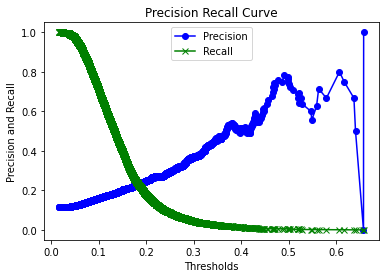

In [ ]:
prec, rec, thresh = precision_recall_curve(y_test, y_test_prob)
print(prec.shape, rec.shape, thresh.shape)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'best')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Curve')
plt.show()

(5770,) (5770,) (5770,)


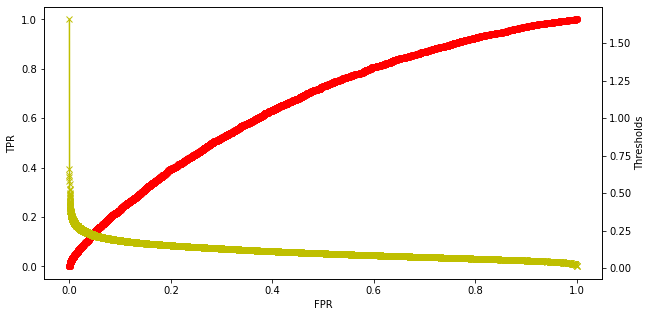

In [ ]:
fpr, tpr, thresh = roc_curve(y_test, y_test_prob)
print(fpr.shape, tpr.shape, thresh.shape)
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(fpr, tpr, marker = 'o', c = 'r')
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax1 = ax.twinx()
ax1.plot(fpr, thresh, marker = 'x', c = 'y')
ax1.set_ylabel('Thresholds')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.540400,0.262020,0.160541,0.712230
1,0.15,0.750043,0.267780,0.201514,0.398981
2,0.20,0.843515,0.207892,0.247414,0.179257
3,0.25,0.871433,0.134535,0.293939,0.087230
4,0.30,0.881838,0.079700,0.369727,0.044664
5,0.35,0.884928,0.046657,0.458101,0.024580
6,0.40,0.885512,0.025716,0.511628,0.013189
7,0.45,0.885718,0.012463,0.617647,0.006295
8,0.50,0.885787,0.008939,0.750000,0.004496
9,0.55,0.885478,0.002990,0.555556,0.001499


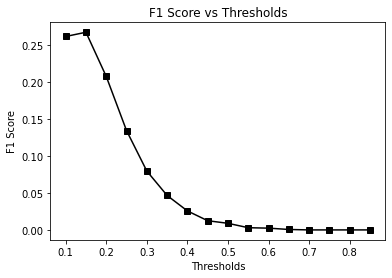

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'k')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Thresholds')
plt.show()

### With Class Weight

#### class_weight = 'balanced'

In [ ]:
imp = lgb_fi_df[lgb_fi_df['class_weight'] >= 0]['Features']
print("Number of features:", len(imp))
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, class_weight = 'balanced')
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 95
Training Time: 1.3030591011047363
Prediction Time: 0.16198325157165527
Train Accuracy Score: 0.6663379887857069
Train Confusion Matrix:
 [[39748 20417]
 [ 2255  5529]] 

Train F1 Score: 0.3278387192410317
Train Precision Score: 0.21309643104910198
Train Recall Score: 0.7103031860226104
Train ROC_AUC Score: 0.757719934747789

Test Accuracy Score: 0.6412554513924659
Test Confusion Matrix:
 [[16737  9048]
 [ 1399  1937]] 

Test F1 Score: 0.2705118357656588
Test Precision Score: 0.17633136094674556
Test Recall Score: 0.5806354916067147
Test ROC_AUC Score: 0.6614694864236592


In [ ]:
imp = lgb_fi_df[lgb_fi_df['class_weight'] >= 20]['Features']
print("Number of features:", len(imp))
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, class_weight = 'balanced')
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 38
Training Time: 1.0980761051177979
Prediction Time: 0.10887861251831055
Train Accuracy Score: 0.6625998910947917
Train Confusion Matrix:
 [[39545 20620]
 [ 2306  5478]] 

Train F1 Score: 0.3233575349743226
Train Precision Score: 0.20990114184995018
Train Recall Score: 0.7037512846865365
Train ROC_AUC Score: 0.7514819130911746

Test Accuracy Score: 0.6385082929844442
Test Confusion Matrix:
 [[16670  9115]
 [ 1412  1924]] 

Test F1 Score: 0.26768695652173913
Test Precision Score: 0.17429114956064862
Test Recall Score: 0.5767386091127098
Test ROC_AUC Score: 0.6586896451425248


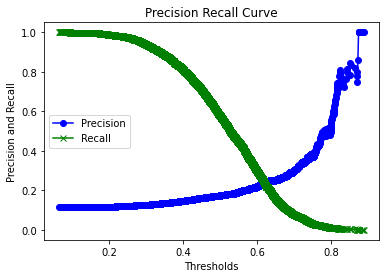

In [ ]:
prec, rec, thresh = precision_recall_curve(y_test, y_test_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'best')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Curve')
plt.show()

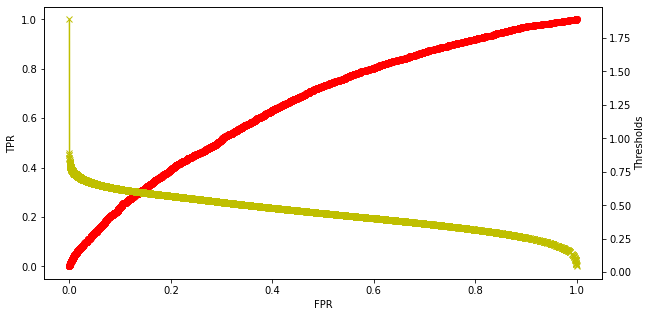

In [ ]:
fpr, tpr, thresh = roc_curve(y_test, y_test_prob)
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(fpr, tpr, marker = 'o', c = 'r')
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax1 = ax.twinx()
ax1.plot(fpr, thresh, marker = 'x', c = 'y')
ax1.set_ylabel('Thresholds')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.117201,0.205759,0.114701,0.998201
1,0.15,0.125545,0.206920,0.115455,0.995803
2,0.20,0.148827,0.209976,0.117479,0.987410
3,0.25,0.190103,0.215898,0.121415,0.973321
4,0.30,0.253048,0.222921,0.126541,0.935252
5,0.35,0.339377,0.234765,0.135342,0.884592
6,0.40,0.439477,0.248584,0.146843,0.809353
7,0.45,0.545208,0.263322,0.161658,0.709532
8,0.50,0.638508,0.267687,0.174291,0.576739
9,0.55,0.721198,0.267833,0.191539,0.445144


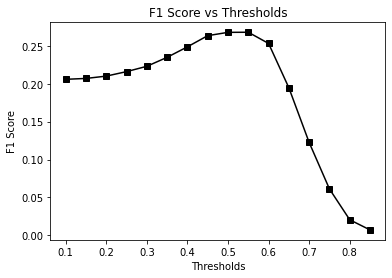

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'k')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Thresholds')
plt.show()

#### is_unbalance = True

In [ ]:
imp = lgb_fi_df[lgb_fi_df['is_unbalance'] >= 0]['Features']
print("Number of features:", len(imp))
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 95
Training Time: 1.243466854095459
Prediction Time: 0.11866331100463867
Train Accuracy Score: 0.6641451676993039
Train Confusion Matrix:
 [[39529 20636]
 [ 2185  5599]] 

Train F1 Score: 0.3291689937975837
Train Precision Score: 0.21341719077568133
Train Recall Score: 0.7192959917780062
Train ROC_AUC Score: 0.7617999349852312

Test Accuracy Score: 0.6385082929844442
Test Confusion Matrix:
 [[16644  9141]
 [ 1386  1950]] 

Test F1 Score: 0.27032647119983366
Test Precision Score: 0.17581823099810656
Test Recall Score: 0.5845323741007195
Test ROC_AUC Score: 0.6624339562672142


In [ ]:
imp = lgb_fi_df[lgb_fi_df['is_unbalance'] >= 20]['Features']
print("Number of features:", len(imp))
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 37
Training Time: 1.0110607147216797
Prediction Time: 0.11020183563232422
Train Accuracy Score: 0.6606866914892051
Train Confusion Matrix:
 [[39323 20842]
 [ 2214  5570]] 

Train F1 Score: 0.3257690958006784
Train Precision Score: 0.21088898985309706
Train Recall Score: 0.7155704008221994
Train ROC_AUC Score: 0.7558299593896844

Test Accuracy Score: 0.6345935922530133
Test Confusion Matrix:
 [[16518  9267]
 [ 1374  1962]] 

Test F1 Score: 0.2694129763130793
Test Precision Score: 0.17472615549024847
Test Recall Score: 0.5881294964028777
Test ROC_AUC Score: 0.6596931064804933


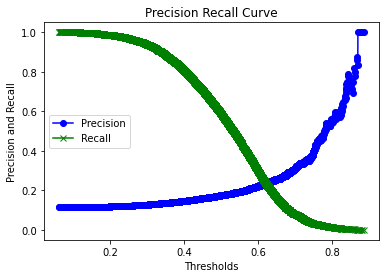

In [ ]:
prec, rec, thresh = precision_recall_curve(y_test, y_test_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'best')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Curve')
plt.show()

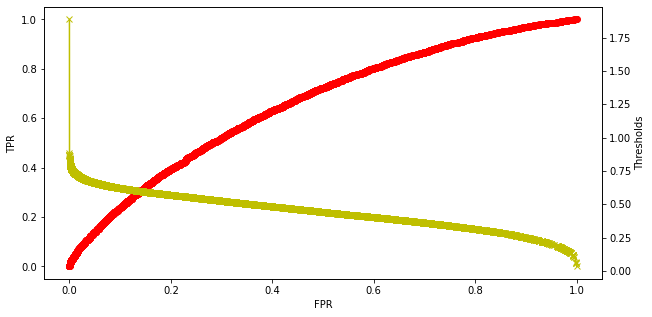

In [ ]:
fpr, tpr, thresh = roc_curve(y_test, y_test_prob)
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(fpr, tpr, marker = 'o', c = 'r')
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax1 = ax.twinx()
ax1.plot(fpr, thresh, marker = 'x', c = 'y')
ax1.set_ylabel('Thresholds')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.117681,0.206093,0.114889,0.999700
1,0.15,0.129803,0.207722,0.115955,0.995803
2,0.20,0.157996,0.211474,0.118444,0.985612
3,0.25,0.199787,0.217206,0.122309,0.969125
4,0.30,0.261014,0.225286,0.128017,0.937950
5,0.35,0.342742,0.235623,0.135920,0.884293
6,0.40,0.439957,0.248121,0.146609,0.806655
7,0.45,0.540332,0.260769,0.159829,0.707734
8,0.50,0.634594,0.269413,0.174726,0.588129
9,0.55,0.720236,0.270831,0.193059,0.453537


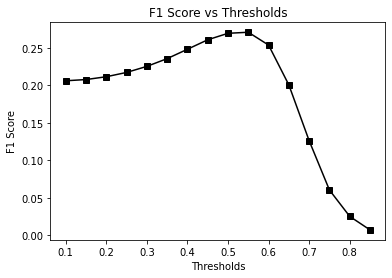

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'k')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Thresholds')
plt.show()

#### scale_pos_weight

In [ ]:
imp = lgb_fi_df[lgb_fi_df['scale_pos_weight'] >= 0]['Features']
print("Number of features:", len(imp))
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, scale_pos_weight = weight)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 95
Training Time: 1.235910177230835
Prediction Time: 0.1226506233215332
Train Accuracy Score: 0.6641451676993039
Train Confusion Matrix:
 [[39529 20636]
 [ 2185  5599]] 

Train F1 Score: 0.3291689937975837
Train Precision Score: 0.21341719077568133
Train Recall Score: 0.7192959917780062
Train ROC_AUC Score: 0.7617999349852312

Test Accuracy Score: 0.6385082929844442
Test Confusion Matrix:
 [[16644  9141]
 [ 1386  1950]] 

Test F1 Score: 0.27032647119983366
Test Precision Score: 0.17581823099810656
Test Recall Score: 0.5845323741007195
Test ROC_AUC Score: 0.6624339562672142


In [ ]:
imp = lgb_fi_df[lgb_fi_df['scale_pos_weight'] >= 20]['Features']
print("Number of features:", len(imp))
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, scale_pos_weight = weight)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 37
Training Time: 1.0172245502471924
Prediction Time: 0.10747838020324707
Train Accuracy Score: 0.6606866914892051
Train Confusion Matrix:
 [[39323 20842]
 [ 2214  5570]] 

Train F1 Score: 0.3257690958006784
Train Precision Score: 0.21088898985309706
Train Recall Score: 0.7155704008221994
Train ROC_AUC Score: 0.7558299593896844

Test Accuracy Score: 0.6345935922530133
Test Confusion Matrix:
 [[16518  9267]
 [ 1374  1962]] 

Test F1 Score: 0.2694129763130793
Test Precision Score: 0.17472615549024847
Test Recall Score: 0.5881294964028777
Test ROC_AUC Score: 0.6596931064804933


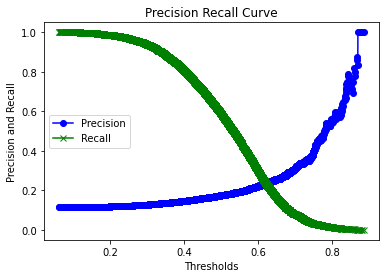

In [ ]:
prec, rec, thresh = precision_recall_curve(y_test, y_test_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'best')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Curve')
plt.show()

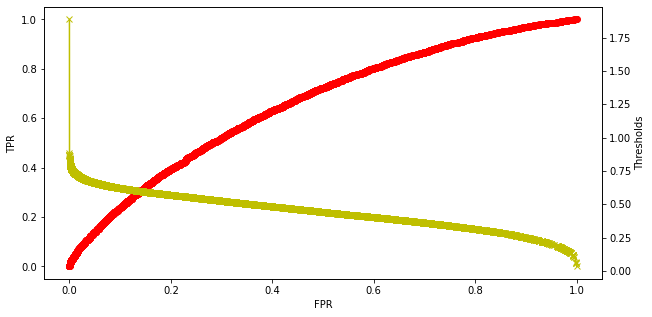

In [ ]:
fpr, tpr, thresh = roc_curve(y_test, y_test_prob)
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(fpr, tpr, marker = 'o', c = 'r')
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax1 = ax.twinx()
ax1.plot(fpr, thresh, marker = 'x', c = 'y')
ax1.set_ylabel('Thresholds')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.117681,0.206093,0.114889,0.999700
1,0.15,0.129803,0.207722,0.115955,0.995803
2,0.20,0.157996,0.211474,0.118444,0.985612
3,0.25,0.199787,0.217206,0.122309,0.969125
4,0.30,0.261014,0.225286,0.128017,0.937950
5,0.35,0.342742,0.235623,0.135920,0.884293
6,0.40,0.439957,0.248121,0.146609,0.806655
7,0.45,0.540332,0.260769,0.159829,0.707734
8,0.50,0.634594,0.269413,0.174726,0.588129
9,0.55,0.720236,0.270831,0.193059,0.453537


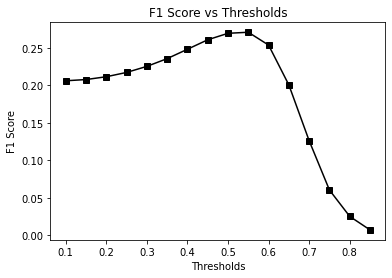

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'k')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Thresholds')
plt.show()

### Trying with reducing diag categories

In [ ]:
X.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,glyburide-metformin,diabetesMed,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,1,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,-2,0,-2,-2,-2,0,-2,1,0,0,insulin_combo


In [ ]:
X['diag_1'].value_counts(1)

Circulatory                                     0.298795
Respiratory                                     0.140352
Digestive                                       0.094303
Diabetes                                        0.087267
Injury and Poisoning                            0.069012
Genitourinary                                   0.050603
Musculoskeletal System and Connective Tissue    0.049459
Neoplasms                                       0.029803
Endocrine, Nutritional, Metabolic, Immunity     0.026301
Skin and Subcutaneous Tissue                    0.026125
Infectious and Parasitic                        0.025621
Other Symptoms                                  0.025487
Mental Disorders                                0.022396
External causes of injury                       0.016431
Blood and Blood-Forming Organs                  0.011105
Nervous                                         0.009292
Congenital Anomalies                            0.008149
Pregnancy, Childbirth          

In [ ]:
X_1 = X.copy()

In [ ]:
X_1['diag_1'] = X_1['diag_1'].map({'Circulatory' : 'Circulatory',
                                   'Respiratory' : 'Respiratory',
                                   'Digestive' : 'Digestive',
                                   'Diabetes' : 'Diabetes',
                                   'Injury and Poisoning' : 'Injury and Poisoning',
                                   'Genitourinary' : 'Genitourinary',
                                   'Musculoskeletal System and Connective Tissue' : 'Musculoskeletal System and Connective Tissue',
                                   'Neoplasms' : 'Others',
                                   'Endocrine, Nutritional, Metabolic, Immunity' : 'Others',
                                   'Skin and Subcutaneous Tissue' : 'Others',
                                   'Infectious and Parasitic' : 'Others',
                                   'Other Symptoms' : 'Others',
                                   'Mental Disorders' : 'Others',
                                   'External causes of injury' : 'Others',
                                   'Blood and Blood-Forming Organs' : 'Others',
                                   'Nervous' : 'Others',
                                   'Congenital Anomalies' : 'Others',
                                   'Pregnancy, Childbirth' : 'Others',
                                   'Sense Organs' : 'Others'})

In [ ]:
X_1['diag_1'].value_counts(1)

Circulatory                                     0.298795
Others                                          0.210209
Respiratory                                     0.140352
Digestive                                       0.094303
Diabetes                                        0.087267
Injury and Poisoning                            0.069012
Genitourinary                                   0.050603
Musculoskeletal System and Connective Tissue    0.049459
Name: diag_1, dtype: float64

In [ ]:
X_1['diag_2'] = X_1['diag_2'].map({'Circulatory' : 'Circulatory',
                                   'Respiratory' : 'Respiratory',
                                   'Digestive' : 'Digestive',
                                   'Diabetes' : 'Diabetes',
                                   'Injury and Poisoning' : 'Injury and Poisoning',
                                   'Genitourinary' : 'Genitourinary',
                                   'Musculoskeletal System and Connective Tissue' : 'Musculoskeletal System and Connective Tissue',
                                   'Neoplasms' : 'Others',
                                   'Endocrine, Nutritional, Metabolic, Immunity' : 'Others',
                                   'Skin and Subcutaneous Tissue' : 'Others',
                                   'Infectious and Parasitic' : 'Others',
                                   'Other Symptoms' : 'Others',
                                   'Mental Disorders' : 'Others',
                                   'External causes of injury' : 'Others',
                                   'Blood and Blood-Forming Organs' : 'Others',
                                   'Nervous' : 'Others',
                                   'Congenital Anomalies' : 'Others',
                                   'Pregnancy, Childbirth' : 'Others',
                                   'Sense Organs' : 'Others',
                                   'Not Required' : 'Not Required'})

In [ ]:
X_1['diag_3'] = X_1['diag_3'].map({'Circulatory' : 'Circulatory',
                                   'Respiratory' : 'Respiratory',
                                   'Digestive' : 'Digestive',
                                   'Diabetes' : 'Diabetes',
                                   'Injury and Poisoning' : 'Injury and Poisoning',
                                   'Genitourinary' : 'Genitourinary',
                                   'Musculoskeletal System and Connective Tissue' : 'Musculoskeletal System and Connective Tissue',
                                   'Neoplasms' : 'Others',
                                   'Endocrine, Nutritional, Metabolic, Immunity' : 'Others',
                                   'Skin and Subcutaneous Tissue' : 'Others',
                                   'Infectious and Parasitic' : 'Others',
                                   'Other Symptoms' : 'Others',
                                   'Mental Disorders' : 'Others',
                                   'External causes of injury' : 'Others',
                                   'Blood and Blood-Forming Organs' : 'Others',
                                   'Nervous' : 'Others',
                                   'Congenital Anomalies' : 'Others',
                                   'Pregnancy, Childbirth' : 'Others',
                                   'Sense Organs' : 'Others',
                                   'Not Required' : 'Not Required'})

In [ ]:
X_1.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,glyburide-metformin,diabetesMed,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,Others,Diabetes,Others,9,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,Others,Diabetes,Others,6,None,None,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,1,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Others,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,1,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Others,Others,Diabetes,5,None,None,-2,-2,-2,-2,0,-2,-2,-2,0,-2,1,0,0,insulin_combo


In [ ]:
X_1.isna().sum()

race                        0
gender                      0
age                         0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
num_lab_procedures          0
num_procedures              0
num_medications             0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
glimepiride                 0
glipizide                   0
glyburide                   0
pioglitazone                0
rosiglitazone               0
insulin                     0
glyburide-metformin         0
diabetesMed                 0
preceding_year_visits       0
number_changes              0
insulin_treatment           0
dtype: int64

In [ ]:
X_1_dum = pd.get_dummies(X_1, drop_first = True)

In [ ]:
X_1_dum.shape

(97070, 64)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_1_dum, y, test_size = 0.3, random_state = 0, stratify = y)
lgb = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
lgb.fit(X_train, y_train)
fi_df = pd.DataFrame({'Features' : X_train.columns, 'Importances' : lgb.feature_importances_})
sorted(zip(lgb.feature_importances_, X_train.columns), reverse = True)

[(453, 'num_lab_procedures'),
 (364, 'num_medications'),
 (217, 'time_in_hospital'),
 (180, 'age'),
 (167, 'preceding_year_visits'),
 (151, 'number_diagnoses'),
 (132, 'num_procedures'),
 (73, 'insulin'),
 (58, 'metformin'),
 (52, 'admission_source_id_Referral'),
 (51, 'discharge_disposition_id_Transferred to another medical facility'),
 (49, 'gender'),
 (49, 'diag_1_Respiratory'),
 (44, 'discharge_disposition_id_Discharged to home with home health service'),
 (44, 'diag_3_Others'),
 (41, 'glipizide'),
 (37, 'race_Caucasian'),
 (36, 'glyburide'),
 (35, 'diag_2_Respiratory'),
 (34, 'diag_3_Diabetes'),
 (33, 'diabetesMed'),
 (32, 'insulin_treatment_insulin_only'),
 (32, 'diag_2_Diabetes'),
 (31, 'diag_2_Others'),
 (31, 'diag_1_Others'),
 (31, 'A1Cresult_None'),
 (28, 'number_changes'),
 (27, 'admission_source_id_Transferred from another health care facility'),
 (26, 'discharge_disposition_id_Not Available'),
 (26, 'A1Cresult_>8'),
 (25, 'diag_3_Respiratory'),
 (24, 'diag_1_Diabetes'),
 (

In [ ]:
imp = fi_df[fi_df['Importances'] >= 25]['Features']
print("Number of features:", len(imp))
lgb1 = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
lgb1.fit(X_train[imp], y_train)
pred = lgb1.predict(X_test[imp])
prob = lgb1.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

Number of features: 31
[[16663  9122]
 [ 1407  1929]]
              precision    recall  f1-score   support

           0       0.92      0.65      0.76     25785
           1       0.17      0.58      0.27      3336

    accuracy                           0.64     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.84      0.64      0.70     29121

ROC_AUC: 0.65319621556972


### Sampling Techniques

#### Under Sampling

In [ ]:
rus = RandomUnderSampler(random_state = 0)
X_rus, y_rus = rus.fit_resample(X_train[imp], y_train)
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[15307 10478]
 [ 1241  2095]]
              precision    recall  f1-score   support

           0       0.93      0.59      0.72     25785
           1       0.17      0.63      0.26      3336

    accuracy                           0.60     29121
   macro avg       0.55      0.61      0.49     29121
weighted avg       0.84      0.60      0.67     29121

ROC_AUC: 0.6497984858186748


In [ ]:
rus = RandomUnderSampler(random_state = 0)
X_rus, y_rus = rus.fit_resample(X_train[imp], y_train)
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[15307 10478]
 [ 1241  2095]]
              precision    recall  f1-score   support

           0       0.93      0.59      0.72     25785
           1       0.17      0.63      0.26      3336

    accuracy                           0.60     29121
   macro avg       0.55      0.61      0.49     29121
weighted avg       0.84      0.60      0.67     29121

ROC_AUC: 0.6497984858186748


#### Over Sampling

In [ ]:
ros = RandomOverSampler(random_state = 0)
X_ros, y_ros = ros.fit_resample(X_train[imp], y_train)
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
model.fit(X_ros, y_ros)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[16666  9119]
 [ 1434  1902]]
              precision    recall  f1-score   support

           0       0.92      0.65      0.76     25785
           1       0.17      0.57      0.26      3336

    accuracy                           0.64     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.84      0.64      0.70     29121

ROC_AUC: 0.6543104492554881


In [ ]:
ros = RandomOverSampler(random_state = 0)
X_ros, y_ros = ros.fit_resample(X_train[imp], y_train)
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
model.fit(X_ros, y_ros)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[16666  9119]
 [ 1434  1902]]
              precision    recall  f1-score   support

           0       0.92      0.65      0.76     25785
           1       0.17      0.57      0.26      3336

    accuracy                           0.64     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.84      0.64      0.70     29121

ROC_AUC: 0.6543104492554881


#### SMOTE

In [ ]:
sm = SMOTE(random_state = 0, n_jobs = -1)
X_sm, y_sm = sm.fit_resample(X_train[imp], y_train)
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
model.fit(X_sm, y_sm)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[22907  2878]
 [ 2898   438]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89     25785
           1       0.13      0.13      0.13      3336

    accuracy                           0.80     29121
   macro avg       0.51      0.51      0.51     29121
weighted avg       0.80      0.80      0.80     29121

ROC_AUC: 0.5547568693154842


In [ ]:
sm = SMOTE(random_state = 0, n_jobs = -1)
X_sm, y_sm = sm.fit_resample(X_train[imp], y_train)
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
model.fit(X_sm, y_sm)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[22907  2878]
 [ 2898   438]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89     25785
           1       0.13      0.13      0.13      3336

    accuracy                           0.80     29121
   macro avg       0.51      0.51      0.51     29121
weighted avg       0.80      0.80      0.80     29121

ROC_AUC: 0.5547568693154842


#### SmoteTomek

In [ ]:
smtmk = SMOTETomek(random_state = 0)
X_smtmk, y_smtmk = sm.fit_resample(X_train[imp], y_train)
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
model.fit(X_smtmk, y_smtmk)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[22907  2878]
 [ 2898   438]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89     25785
           1       0.13      0.13      0.13      3336

    accuracy                           0.80     29121
   macro avg       0.51      0.51      0.51     29121
weighted avg       0.80      0.80      0.80     29121

ROC_AUC: 0.5547568693154842


In [ ]:
smtmk = SMOTETomek(random_state = 0)
X_smtmk, y_smtmk = sm.fit_resample(X_train[imp], y_train)
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
model.fit(X_smtmk, y_smtmk)
pred = model.predict(X_test[imp])
prob = model.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[22907  2878]
 [ 2898   438]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89     25785
           1       0.13      0.13      0.13      3336

    accuracy                           0.80     29121
   macro avg       0.51      0.51      0.51     29121
weighted avg       0.80      0.80      0.80     29121

ROC_AUC: 0.5547568693154842


### Hyper-Parameter Tuning

In [ ]:
X_train.shape, y_train.sum()

((67949, 97), 7784)

In [ ]:
np.logspace(-2, 0, 100)

array([0.01      , 0.01047616, 0.01097499, 0.01149757, 0.01204504,
       0.01261857, 0.01321941, 0.01384886, 0.01450829, 0.01519911,
       0.01592283, 0.01668101, 0.01747528, 0.01830738, 0.0191791 ,
       0.02009233, 0.02104904, 0.02205131, 0.0231013 , 0.02420128,
       0.02535364, 0.02656088, 0.02782559, 0.02915053, 0.03053856,
       0.03199267, 0.03351603, 0.03511192, 0.0367838 , 0.03853529,
       0.04037017, 0.04229243, 0.04430621, 0.04641589, 0.04862602,
       0.05094138, 0.05336699, 0.0559081 , 0.05857021, 0.06135907,
       0.06428073, 0.06734151, 0.07054802, 0.07390722, 0.07742637,
       0.08111308, 0.08497534, 0.08902151, 0.09326033, 0.097701  ,
       0.1023531 , 0.10722672, 0.1123324 , 0.1176812 , 0.12328467,
       0.12915497, 0.13530478, 0.14174742, 0.14849683, 0.15556761,
       0.16297508, 0.17073526, 0.17886495, 0.18738174, 0.19630407,
       0.20565123, 0.21544347, 0.22570197, 0.23644894, 0.24770764,
       0.25950242, 0.27185882, 0.28480359, 0.29836472, 0.31257

In [ ]:
np.linspace(0.01, 1, 100)

array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99,
       1.  ])

In [ ]:
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)

params = {'boosting_type' : ['gbdt', 'dart', 'goss', 'rf'],
          'num_leaves' : np.arange(15, 60),
          'max_depth' : np.arange(1, 100),
          'learning_rate' : np.linspace(0.01, 1, 100),
          'n_estimators' : np.arange(100, 1000),
          'min_child_samples' : np.arange(10, 40)}

rsearch = RandomizedSearchCV(model, params, n_iter = 25, scoring = 'roc_auc', n_jobs = -1,
                             cv = 3, verbose = 1, random_state = 0)
rsearch.fit(X_train, y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed: 17.7min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            is_unbalance=True,
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective='binary',
                                            random_state=0, reg_alpha=0.0,...
       971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983,
       984, 985, 986, 987, 988, 989, 990, 991, 992, 99

In [ ]:
print("Best ROC_AUC : ", rsearch.best_score_)
rsearch.best_params_

Best ROC_AUC :  0.6476433630090365


{'boosting_type': 'dart',
 'learning_rate': 0.14,
 'max_depth': 77,
 'min_child_samples': 26,
 'n_estimators': 104,
 'num_leaves': 49}

In [ ]:
model = rsearch.best_estimator_
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 4.32855486869812
Prediction Time: 0.17628049850463867
Train Accuracy Score: 0.6571104799187626
Train Confusion Matrix:
 [[38987 21178]
 [ 2121  5663]] 

Train F1 Score: 0.32710469314079427
Train Precision Score: 0.21098319734734175
Train Recall Score: 0.7275179856115108
Train ROC_AUC Score: 0.7575203476496504

Test Accuracy Score: 0.6334947288898046
Test Confusion Matrix:
 [[16449  9336]
 [ 1337  1999]] 

Test F1 Score: 0.2725103946561243
Test Precision Score: 0.17635641817379796
Test Recall Score: 0.5992206235011991
Test ROC_AUC Score: 0.6629010520495762


In [ ]:
np.linspace(0.014, 1.4, 50)

array([0.014     , 0.04228571, 0.07057143, 0.09885714, 0.12714286,
       0.15542857, 0.18371429, 0.212     , 0.24028571, 0.26857143,
       0.29685714, 0.32514286, 0.35342857, 0.38171429, 0.41      ,
       0.43828571, 0.46657143, 0.49485714, 0.52314286, 0.55142857,
       0.57971429, 0.608     , 0.63628571, 0.66457143, 0.69285714,
       0.72114286, 0.74942857, 0.77771429, 0.806     , 0.83428571,
       0.86257143, 0.89085714, 0.91914286, 0.94742857, 0.97571429,
       1.004     , 1.03228571, 1.06057143, 1.08885714, 1.11714286,
       1.14542857, 1.17371429, 1.202     , 1.23028571, 1.25857143,
       1.28685714, 1.31514286, 1.34342857, 1.37171429, 1.4       ])

In [ ]:
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)

params = {'boosting_type' : ['gbdt', 'dart', 'goss', 'rf'],
          'num_leaves' : np.arange(25, 100),
          'max_depth' : np.arange(40, 160),
          'learning_rate' : np.linspace(0.01, 1, 50),
          'n_estimators' : np.arange(52, 208),
          'min_child_samples' : np.arange(13, 52)}

rsearch = RandomizedSearchCV(model, params, n_iter = 50, scoring = 'roc_auc', n_jobs = -1,
                             cv = 5, verbose = 1, random_state = 0)
rsearch.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   55.7s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  7.1min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            is_unbalance=True,
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective='binary',
                                            random_state=0, reg_alpha=0.0,...
                                        'num_leaves': array([25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 4

In [ ]:
print("Best ROC_AUC : ", rsearch.best_score_)
rsearch.best_params_

Best ROC_AUC :  0.6533633714674332


{'boosting_type': 'goss',
 'learning_rate': 0.07061224489795918,
 'max_depth': 152,
 'min_child_samples': 18,
 'n_estimators': 84,
 'num_leaves': 33}

In [ ]:
model = rsearch.best_estimator_
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 1.3424479961395264
Prediction Time: 0.13700151443481445
Train Accuracy Score: 0.6421875229951876
Train Confusion Matrix:
 [[38169 21996]
 [ 2317  5467]] 

Train F1 Score: 0.3102107980821062
Train Precision Score: 0.1990678367257765
Train Recall Score: 0.7023381294964028
Train ROC_AUC Score: 0.7324876534289183

Test Accuracy Score: 0.6265238144294495
Test Confusion Matrix:
 [[16225  9560]
 [ 1316  2020]] 

Test F1 Score: 0.27085009385894343
Test Precision Score: 0.17443868739205526
Test Recall Score: 0.605515587529976
Test ROC_AUC Score: 0.6641936247395337


In [ ]:
np.linspace(0.007, 0.7, 25)

array([0.007   , 0.035875, 0.06475 , 0.093625, 0.1225  , 0.151375,
       0.18025 , 0.209125, 0.238   , 0.266875, 0.29575 , 0.324625,
       0.3535  , 0.382375, 0.41125 , 0.440125, 0.469   , 0.497875,
       0.52675 , 0.555625, 0.5845  , 0.613375, 0.64225 , 0.671125,
       0.7     ])

In [ ]:
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)

params = {'boosting_type' : ['gbdt', 'dart', 'goss', 'rf'],
          'num_leaves' : np.arange(15, 60),
          'max_depth' : np.arange(75, 300),
          'learning_rate' : np.linspace(0.007, 0.7, 25),
          'n_estimators' : np.arange(40, 160),
          'min_child_samples' : np.arange(9, 36)}

rsearch = RandomizedSearchCV(model, params, n_iter = 100, scoring = 'roc_auc', n_jobs = -1,
                             cv = 10, verbose = 1, random_state = 0)
rsearch.fit(X_train, y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   30.6s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed: 18.5min finished


RandomizedSearchCV(cv=10, error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            is_unbalance=True,
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective='binary',
                                            random_state=0, reg_alpha=0.0...
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 15

In [ ]:
print("Best ROC_AUC : ", rsearch.best_score_)
rsearch.best_params_

Best ROC_AUC :  0.6538734388367365


{'boosting_type': 'gbdt',
 'learning_rate': 0.06475,
 'max_depth': 178,
 'min_child_samples': 22,
 'n_estimators': 128,
 'num_leaves': 23}

In [ ]:
model = rsearch.best_estimator_
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 1.5528984069824219
Prediction Time: 0.14951324462890625
Train Accuracy Score: 0.6409807355516638
Train Confusion Matrix:
 [[38185 21980]
 [ 2415  5369]] 

Train F1 Score: 0.3056385734210002
Train Precision Score: 0.19631430765293065
Train Recall Score: 0.689748201438849
Train ROC_AUC Score: 0.7271132127314497

Test Accuracy Score: 0.6275539988324577
Test Confusion Matrix:
 [[16249  9536]
 [ 1310  2026]] 

Test F1 Score: 0.2719828164854343
Test Precision Score: 0.17522919910050164
Test Recall Score: 0.6073141486810552
Test ROC_AUC Score: 0.6643060130139053


In [ ]:
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True,
                       boosting_type = 'gbdt', learning_rate = 0.06475, max_depth = 178,
                       min_child_samples = 22, n_estimators = 128, num_leaves = 23)
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 1.549548864364624
Prediction Time: 0.14243340492248535
Train Accuracy Score: 0.6409807355516638
Train Confusion Matrix:
 [[38185 21980]
 [ 2415  5369]] 

Train F1 Score: 0.3056385734210002
Train Precision Score: 0.19631430765293065
Train Recall Score: 0.689748201438849
Train ROC_AUC Score: 0.7271132127314497

Test Accuracy Score: 0.6275539988324577
Test Confusion Matrix:
 [[16249  9536]
 [ 1310  2026]] 

Test F1 Score: 0.2719828164854343
Test Precision Score: 0.17522919910050164
Test Recall Score: 0.6073141486810552
Test ROC_AUC Score: 0.6643060130139053


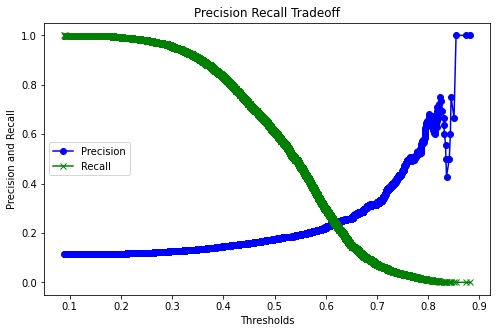

In [ ]:
plt.figure(figsize = (8, 5))
prec, rec, thresh = precision_recall_curve(y_test, y_test_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'center left')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Tradeoff')
plt.show()

Best Threshold=0.487070, G-Mean=0.621


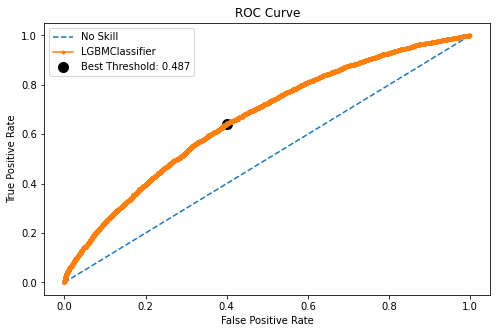

In [ ]:
plt.figure(figsize = (8, 5))
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans)
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))
# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='LGBMClassifier')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', alpha = 1, edgecolors = 'k', s = 100,
            label='Best Threshold: '+str(round(thresholds[ix], 3)))
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC Curve")
plt.legend(loc = 'best')
# show the plot
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.117029,0.205874,0.114761,0.999101
1,0.15,0.122043,0.206610,0.115234,0.997902
2,0.20,0.138113,0.208658,0.116592,0.991906
3,0.25,0.173929,0.213702,0.119928,0.979916
4,0.30,0.234333,0.222315,0.125794,0.955336
5,0.35,0.315820,0.233220,0.133787,0.908273
6,0.40,0.421792,0.247766,0.145580,0.831235
7,0.45,0.528897,0.260072,0.158566,0.722722
8,0.50,0.627554,0.271983,0.175229,0.607314
9,0.55,0.714193,0.273925,0.193183,0.470624


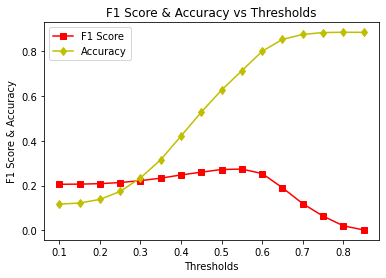

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'r', label = 'F1 Score')
plt.plot(thresh, acc, marker = 'd', c = 'y', label = 'Accuracy')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score & Accuracy')
plt.title('F1 Score & Accuracy vs Thresholds')
plt.legend(loc = 'best')
plt.show()

In [ ]:
y_train_pred = (y_train_prob >= 0.487).astype(bool)
y_test_pred = (y_test_prob >= 0.487).astype(bool)
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Train Accuracy Score: 0.6173453619626484
Train Confusion Matrix:
 [[36343 23822]
 [ 2179  5605]] 

Train F1 Score: 0.3012550052403859
Train Precision Score: 0.19047133584803072
Train Recall Score: 0.7200668036998972
Train ROC_AUC Score: 0.7271132127314497

Test Accuracy Score: 0.6047525840458775
Test Confusion Matrix:
 [[15466 10319]
 [ 1191  2145]] 

Test F1 Score: 0.27151898734177216
Test Precision Score: 0.1720956354300385
Test Recall Score: 0.6429856115107914
Test ROC_AUC Score: 0.6643060130139053


In [ ]:
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True, silent = False)
cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 0)
params = {'num_leaves' : np.arange(10, 40),
          'max_depth' : np.arange(90, 360),
          'learning_rate' : np.linspace(0.006, 0.6, 25),
          'n_estimators' : np.arange(64, 256),
          'min_child_samples' : np.arange(11, 44),
          'subsample' : np.linspace(0.5, 1, 11),
          'colsample_bytree' : np.linspace(0.5, 1, 11),
          'reg_alpha' : [0, 1e-5, 5e-5, 1e-4, 5e-4, 0.001, 0.005,
                         0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100],
          'reg_lambda' : [0, 1e-5, 5e-5, 1e-4, 5e-4, 0.001, 0.005,
                         0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100],
          'subsample_freq' : [0, 1, 2, 3, 4, 5]}

rsearch = RandomizedSearchCV(model, params, n_iter = 50, scoring = 'roc_auc', n_jobs = -1,
                             cv = cv, verbose = 2, random_state = 0)
rsearch.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   58.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  5.9min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=0, shuffle=True),
                   error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            is_unbalance=True,
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leav...
                                        'reg_alpha': [0, 1e-05, 5e-05, 0.0001,
                                                      0.0005, 0.001, 0.00

In [ ]:
print("Best ROC_AUC : ", rsearch.best_score_)
rsearch.best_params_

Best ROC_AUC :  0.6540053616458693


{'colsample_bytree': 0.7,
 'learning_rate': 0.055499999999999994,
 'max_depth': 309,
 'min_child_samples': 28,
 'n_estimators': 180,
 'num_leaves': 31,
 'reg_alpha': 50,
 'reg_lambda': 5,
 'subsample': 0.7,
 'subsample_freq': 2}

In [ ]:
model = rsearch.best_estimator_
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 2.602647304534912
Prediction Time: 0.34842872619628906
Train Accuracy Score: 0.6254838187464128
Train Confusion Matrix:
 [[37360 22805]
 [ 2643  5141]] 

Train F1 Score: 0.28776938147215225
Train Precision Score: 0.18396192657267588
Train Recall Score: 0.6604573484069887
Train ROC_AUC Score: 0.6970697072003686

Test Accuracy Score: 0.6207891212527042
Test Confusion Matrix:
 [[16016  9769]
 [ 1274  2062]] 

Test F1 Score: 0.27190611195358344
Test Precision Score: 0.17428788775251458
Test Recall Score: 0.61810551558753
Test ROC_AUC Score: 0.6658753916006229


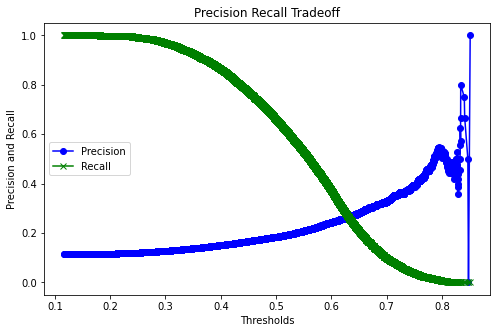

In [ ]:
plt.figure(figsize = (8, 5))
prec, rec, thresh = precision_recall_curve(y_train, y_train_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'center left')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Tradeoff')
plt.show()

Best Threshold=0.495109, G-Mean=0.641


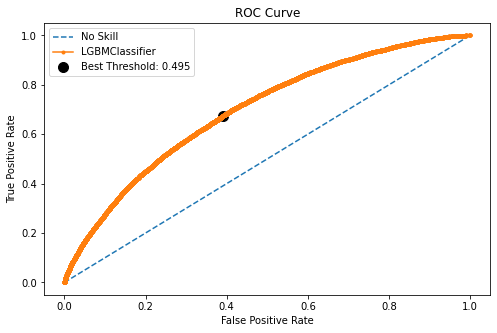

In [ ]:
plt.figure(figsize = (8, 5))
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_train, y_train_prob)
# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans)
best_thresh = thresholds[ix]
print('Best Threshold=%f, G-Mean=%.3f' % (best_thresh, gmeans[ix]))
# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='LGBMClassifier')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', alpha = 1, edgecolors = 'k', s = 100,
            label='Best Threshold: '+str(round(best_thresh, 3)))
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC Curve")
plt.legend(loc = 'best')
# show the plot
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.114591,0.205571,0.114560,1.000000
1,0.15,0.116686,0.205909,0.114774,0.999700
2,0.20,0.130765,0.208004,0.116122,0.996403
3,0.25,0.168538,0.213072,0.119491,0.982614
4,0.30,0.235191,0.222564,0.125948,0.955635
5,0.35,0.319872,0.233751,0.134195,0.905576
6,0.40,0.422444,0.248850,0.146208,0.835132
7,0.45,0.523780,0.260452,0.158407,0.732014
8,0.50,0.620789,0.271906,0.174288,0.618106
9,0.55,0.710106,0.274119,0.192187,0.477818


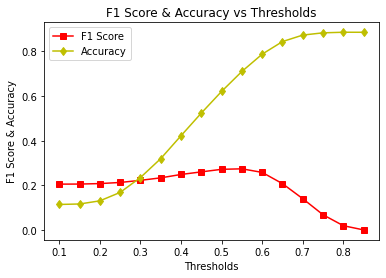

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'r', label = 'F1 Score')
plt.plot(thresh, acc, marker = 'd', c = 'y', label = 'Accuracy')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score & Accuracy')
plt.title('F1 Score & Accuracy vs Thresholds')
plt.legend(loc = 'best')
plt.show()

In [ ]:
y_train_pred = (y_train_prob >= best_thresh).astype(bool)
y_test_pred = (y_test_prob >= best_thresh).astype(bool)
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Train Accuracy Score: 0.6168744205212733
Train Confusion Matrix:
 [[36668 23497]
 [ 2536  5248]] 

Train F1 Score: 0.28733335158367324
Train Precision Score: 0.18257088189250303
Train Recall Score: 0.6742034943473793
Train ROC_AUC Score: 0.6970697072003686

Test Accuracy Score: 0.6115861405858315
Test Confusion Matrix:
 [[15694 10091]
 [ 1220  2116]] 

Test F1 Score: 0.27227690921958436
Test Precision Score: 0.17334316375849923
Test Recall Score: 0.6342925659472423
Test ROC_AUC Score: 0.6658753916006229


In [ ]:
np.linspace(10, 100, 100)

array([ 10.        ,  10.90909091,  11.81818182,  12.72727273,
        13.63636364,  14.54545455,  15.45454545,  16.36363636,
        17.27272727,  18.18181818,  19.09090909,  20.        ,
        20.90909091,  21.81818182,  22.72727273,  23.63636364,
        24.54545455,  25.45454545,  26.36363636,  27.27272727,
        28.18181818,  29.09090909,  30.        ,  30.90909091,
        31.81818182,  32.72727273,  33.63636364,  34.54545455,
        35.45454545,  36.36363636,  37.27272727,  38.18181818,
        39.09090909,  40.        ,  40.90909091,  41.81818182,
        42.72727273,  43.63636364,  44.54545455,  45.45454545,
        46.36363636,  47.27272727,  48.18181818,  49.09090909,
        50.        ,  50.90909091,  51.81818182,  52.72727273,
        53.63636364,  54.54545455,  55.45454545,  56.36363636,
        57.27272727,  58.18181818,  59.09090909,  60.        ,
        60.90909091,  61.81818182,  62.72727273,  63.63636364,
        64.54545455,  65.45454545,  66.36363636,  67.27

In [ ]:
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
cv = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 0)
params = {'colsample_bytree' : np.linspace(0.55, 0.95, 9),
          'learning_rate' : np.linspace(0.005, 0.5, 100),
          'max_depth' : np.arange(150, 600),
          'min_child_samples' : np.arange(14, 56),
          'n_estimators' : np.arange(90, 360),
          'num_leaves' : np.arange(15, 60),
          'reg_alpha' : np.linspace(10, 100, 100),
          'reg_lambda' : np.linspace(1, 10, 100),          
          'subsample' : np.linspace(0.55, 0.95, 9),
          'subsample_freq' : [0, 1, 2, 3, 4]}

rsearch = RandomizedSearchCV(model, params, n_iter = 100, scoring = 'roc_auc', n_jobs = -1,
                             cv = cv, verbose = 3, random_state = 0)
rsearch.fit(X_train, y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 284 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 508 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed: 29.3min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed: 36.6min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=0, shuffle=True),
                   error_score=nan,
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            is_unbalance=True,
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_lea...
        8.27272727,  8.36363636,  8.45454545,  8.54545455,  8.63636364,
        8.72727273,  8.81818182,  8.90909091,  9.        ,  9.09090909,
        

In [ ]:
print("Best ROC_AUC : ", rsearch.best_score_)
rsearch.best_params_

Best ROC_AUC :  0.6565358372077781


{'colsample_bytree': 0.65,
 'learning_rate': 0.025,
 'max_depth': 569,
 'min_child_samples': 47,
 'n_estimators': 304,
 'num_leaves': 51,
 'reg_alpha': 20.909090909090907,
 'reg_lambda': 6.7272727272727275,
 'subsample': 0.75,
 'subsample_freq': 1}

In [ ]:
model = rsearch.best_estimator_
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 3.9801135063171387
Prediction Time: 0.5820717811584473
Train Accuracy Score: 0.641348658552738
Train Confusion Matrix:
 [[38247 21918]
 [ 2452  5332]] 

Train F1 Score: 0.3043900211223383
Train Precision Score: 0.1956697247706422
Train Recall Score: 0.6849948612538541
Train ROC_AUC Score: 0.7226472406859212

Test Accuracy Score: 0.6274509803921569
Test Confusion Matrix:
 [[16243  9542]
 [ 1307  2029]] 

Test F1 Score: 0.27222110417924467
Test Precision Score: 0.17535217353729152
Test Recall Score: 0.6082134292565947
Test ROC_AUC Score: 0.6672355251342846


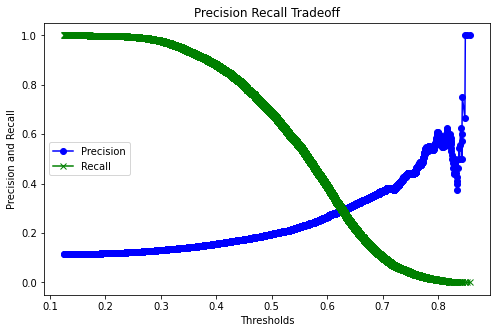

In [ ]:
plt.figure(figsize = (8, 5))
prec, rec, thresh = precision_recall_curve(y_train, y_train_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'center left')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Tradeoff')
plt.show()

Best Threshold=0.505370, G-Mean=0.661


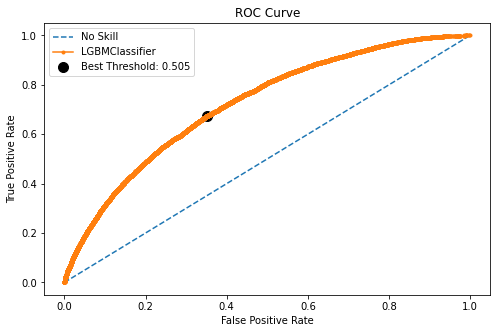

In [ ]:
plt.figure(figsize = (8, 5))
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_train, y_train_prob)
# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans)
best_thresh = thresholds[ix]
print('Best Threshold=%f, G-Mean=%.3f' % (best_thresh, gmeans[ix]))
# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='LGBMClassifier')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', alpha = 1, edgecolors = 'k', s = 100,
            label='Best Threshold: '+str(round(best_thresh, 3)))
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC Curve")
plt.legend(loc = 'best')
# show the plot
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_train_prob >= i).astype(bool)
    f1.append(f1_score(y_train, pred))
    acc.append(accuracy_score(y_train, pred))
    prec.append(precision_score(y_train, pred))
    rec.append(recall_score(y_train, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.114704,0.205591,0.114573,1.000000
1,0.15,0.120752,0.206692,0.115259,0.999872
2,0.20,0.142033,0.210482,0.117643,0.998330
3,0.25,0.185963,0.218445,0.122720,0.993063
4,0.30,0.255559,0.231176,0.131098,0.977004
5,0.35,0.342595,0.246025,0.141619,0.936280
6,0.40,0.442435,0.265861,0.156542,0.881295
7,0.45,0.544408,0.285800,0.174180,0.795735
8,0.50,0.641349,0.304390,0.195670,0.684995
9,0.55,0.730033,0.319534,0.224627,0.553314


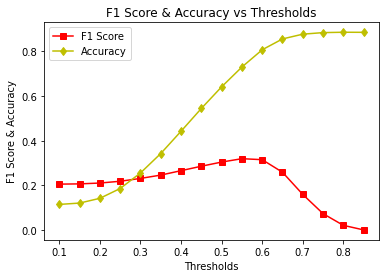

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'r', label = 'F1 Score')
plt.plot(thresh, acc, marker = 'd', c = 'y', label = 'Accuracy')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score & Accuracy')
plt.title('F1 Score & Accuracy vs Thresholds')
plt.legend(loc = 'best')
plt.show()

In [ ]:
y_train_pred = (y_train_prob >= best_thresh).astype(bool)
y_test_pred = (y_test_prob >= best_thresh).astype(bool)
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Train Accuracy Score: 0.6518859733035071
Train Confusion Matrix:
 [[39051 21114]
 [ 2540  5244]] 

Train F1 Score: 0.30718762814129225
Train Precision Score: 0.19895287958115182
Train Recall Score: 0.6736896197327852
Train ROC_AUC Score: 0.7226472406859212

Test Accuracy Score: 0.6383709350640431
Test Confusion Matrix:
 [[16596  9189]
 [ 1342  1994]] 

Test F1 Score: 0.27467456436393695
Test Precision Score: 0.17830635786461593
Test Recall Score: 0.5977218225419664
Test ROC_AUC Score: 0.6672355251342846


### Different Data

In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed.csv')
df.head()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,preceding_year_visits,number_diab_meds,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Not Available,Referral,1,41,0,1,0,0,0,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,0,0,no_med
1,Caucasian,0,15,Emergency,Discharged to home,Emergency,3,59,0,18,0,0,0,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,-2,-2,-2,-2,1,1,0,0,1,1,insulin_only
2,AfricanAmerican,0,25,Emergency,Discharged to home,Emergency,2,11,5,13,2,0,1,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,0,1,0,3,1,0,other_meds
3,Caucasian,1,35,Emergency,Discharged to home,Emergency,2,44,1,16,0,0,0,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,-2,-2,-2,-2,1,1,0,0,1,1,insulin_only
4,Caucasian,1,45,Emergency,Discharged to home,Emergency,1,51,0,8,0,0,0,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,1,1,0,0,2,0,insulin_combo


In [ ]:
df.shape

(97070, 47)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97070 entries, 0 to 97069
Data columns (total 47 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   race                      97070 non-null  object
 1   gender                    97070 non-null  int64 
 2   age                       97070 non-null  int64 
 3   admission_type_id         97070 non-null  object
 4   discharge_disposition_id  97070 non-null  object
 5   admission_source_id       97070 non-null  object
 6   time_in_hospital          97070 non-null  int64 
 7   num_lab_procedures        97070 non-null  int64 
 8   num_procedures            97070 non-null  int64 
 9   num_medications           97070 non-null  int64 
 10  number_outpatient         97070 non-null  int64 
 11  number_emergency          97070 non-null  int64 
 12  number_inpatient          97070 non-null  int64 
 13  diag_1                    97070 non-null  object
 14  diag_2                

In [ ]:
for i in df.columns:
    print(i, df[i].unique(), '\n')

race ['Caucasian' 'AfricanAmerican' 'Other' 'Asian' 'Hispanic'] 

gender [0 1] 

age [ 5 15 25 35 45 55 65 75 85 95] 

admission_type_id ['Not Available' 'Emergency' 'Elective'] 

discharge_disposition_id ['Not Available' 'Discharged to home'
 'Transferred to another medical facility'
 'Discharged to home with home health service' 'Left AMA'
 'Still patient/referred to this institution'] 

admission_source_id ['Referral' 'Emergency' 'Transferred from another health care facility'
 'Not Available'] 

time_in_hospital [ 1  3  2  4  5 13 12  9  7 10 11  6  8 14] 

num_lab_procedures [ 41  59  11  44  51  31  70  73  68  33  47  62  60  55  49  75  45  29
  35  42  19  64  25  53  52  87  27  37  28  36  48  10   2  65  67  40
  58  57  32  83  34  39  69  38  22  96  46  72  78  56  61  88  66  43
  50   1  18  82  54   9  63  24  71  77  81  76  90  93   3 103  13  80
  85  16  15  12  30  23  17  21  79  26  95  97  84  14  74 105  86  98
  20   5   6  94   8 102   7  89  91  92   4 101

In [ ]:
df = df.drop(['metformin-rosiglitazone', 'admission_type_id', 'discharge_disposition_id', 'admission_source_id'], 1)

In [ ]:
X = df.drop(['readmitted'], 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, random_state = 0, stratify = y)

In [ ]:
lgb = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
lgb.fit(X_train, y_train)
sorted(zip(lgb.feature_importances_, X_train.columns), reverse = True)

[(393, 'num_lab_procedures'),
 (366, 'num_medications'),
 (220, 'time_in_hospital'),
 (174, 'age'),
 (141, 'num_procedures'),
 (115, 'number_diagnoses'),
 (103, 'number_inpatient'),
 (99, 'preceding_year_visits'),
 (68, 'insulin'),
 (60, 'number_emergency'),
 (57, 'number_outpatient'),
 (45, 'metformin'),
 (45, 'diag_1_Circulatory'),
 (44, 'gender'),
 (41, 'glipizide'),
 (37, 'diag_1_Respiratory'),
 (36, 'number_changes'),
 (35, 'race_Caucasian'),
 (34, 'diag_3_Circulatory'),
 (32, 'number_diab_meds'),
 (30, 'diabetesMed'),
 (28, 'A1Cresult_None'),
 (27, 'insulin_treatment_insulin_only'),
 (27, 'diag_2_Circulatory'),
 (25, 'diag_2_Diabetes'),
 (24, 'diag_2_Neoplasms'),
 (24, 'diag_1_Diabetes'),
 (24, 'change'),
 (21, 'diag_2_Respiratory'),
 (20, 'diag_3_Genitourinary'),
 (19, 'diag_3_Diabetes'),
 (18, 'max_glu_serum_None'),
 (18, 'diag_1_Pregnancy, Childbirth'),
 (18, 'diag_1_Injury and Poisoning'),
 (17, 'insulin_treatment_other_meds'),
 (17, 'glyburide'),
 (17, 'diag_3_Nervous'),
 (1

In [ ]:
lgb_cw = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
lgb_cw.fit(X_train, y_train)
sorted(zip(lgb_cw.feature_importances_, X_train.columns), reverse = True)

[(410, 'num_lab_procedures'),
 (350, 'num_medications'),
 (212, 'time_in_hospital'),
 (165, 'age'),
 (135, 'num_procedures'),
 (109, 'number_diagnoses'),
 (106, 'number_inpatient'),
 (83, 'preceding_year_visits'),
 (65, 'insulin'),
 (64, 'number_outpatient'),
 (58, 'number_diab_meds'),
 (45, 'number_emergency'),
 (42, 'metformin'),
 (39, 'diag_1_Circulatory'),
 (37, 'number_changes'),
 (37, 'glipizide'),
 (36, 'gender'),
 (36, 'diag_1_Respiratory'),
 (35, 'race_Caucasian'),
 (31, 'diag_3_Circulatory'),
 (29, 'insulin_treatment_insulin_only'),
 (28, 'diag_1_Genitourinary'),
 (28, 'diabetesMed'),
 (25, 'A1Cresult_None'),
 (24, 'diag_2_Respiratory'),
 (23, 'diag_2_Diabetes'),
 (23, 'diag_1_Diabetes'),
 (22, 'diag_2_Neoplasms'),
 (22, 'change'),
 (22, 'A1Cresult_Norm'),
 (22, 'A1Cresult_>8'),
 (21, 'glyburide'),
 (20, 'diag_2_Skin and Subcutaneous Tissue'),
 (20, 'diag_1_Injury and Poisoning'),
 (19, 'diag_3_Endocrine, Nutritional, Metabolic, Immunity'),
 (19, 'diag_1_External causes of in

In [ ]:
lgb_fi_df = pd.DataFrame({'Features' : X_train.columns, 'Importances without CW' : lgb.feature_importances_,
                          'Importances with CW' : lgb_cw.feature_importances_})
lgb_fi_df

,Features,Importances without CW,Importances with CW
0,gender,44,36
1,age,174,165
2,time_in_hospital,220,212
3,num_lab_procedures,393,410
4,num_procedures,141,135
...,...,...,...
99,A1Cresult_None,28,25
100,A1Cresult_Norm,16,22
101,insulin_treatment_insulin_only,27,29
102,insulin_treatment_no_med,6,1


In [ ]:
imp = lgb_fi_df[lgb_fi_df['Importances without CW'] >= 0]['Features']
print("Number of features:", len(imp))
lgb1 = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
lgb1.fit(X_train[imp], y_train)
pred = lgb1.predict(X_test[imp])
prob = lgb1.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

Number of features: 104
[[25757    28]
 [ 3285    51]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.65      0.02      0.03      3336

    accuracy                           0.89     29121
   macro avg       0.77      0.51      0.48     29121
weighted avg       0.86      0.89      0.84     29121

ROC_AUC: 0.6539475226101841


In [ ]:
imp = lgb_fi_df[lgb_fi_df['Importances without CW'] >= 19]['Features']
print("Number of features:", len(imp))
lgb1 = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1)
lgb1.fit(X_train[imp], y_train)
pred = lgb1.predict(X_test[imp])
prob = lgb1.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

Number of features: 31
[[25738    47]
 [ 3292    44]]
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     25785
           1       0.48      0.01      0.03      3336

    accuracy                           0.89     29121
   macro avg       0.69      0.51      0.48     29121
weighted avg       0.84      0.89      0.83     29121

ROC_AUC: 0.6522861582752414


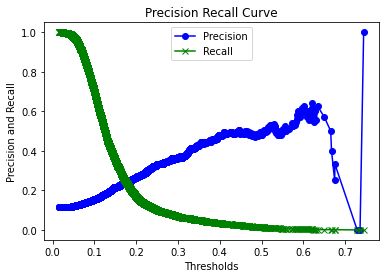

In [ ]:
prec, rec, thresh = precision_recall_curve(y_test, prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'best')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Curve')
plt.show()

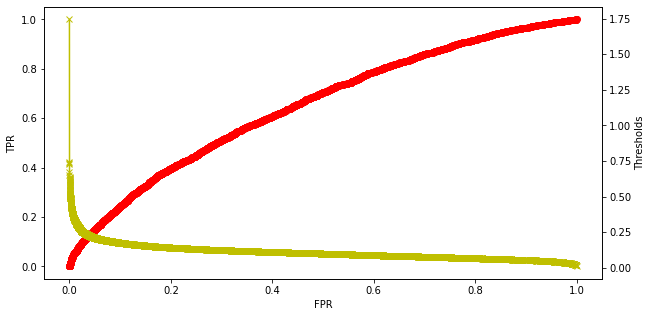

In [ ]:
fpr, tpr, thresh = roc_curve(y_test, prob)
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(fpr, tpr, marker = 'o', c = 'r')
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax1 = ax.twinx()
ax1.plot(fpr, thresh, marker = 'x', c = 'y')
ax1.set_ylabel('Thresholds')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.525360,0.252784,0.154201,0.700839
1,0.15,0.778339,0.267725,0.215368,0.353717
2,0.20,0.850692,0.205990,0.263551,0.169065
3,0.25,0.873390,0.154164,0.328446,0.100719
4,0.30,0.879640,0.115569,0.365231,0.068645
5,0.35,0.883555,0.088196,0.428198,0.049161
6,0.40,0.885134,0.065381,0.481481,0.035072
7,0.45,0.885340,0.044088,0.490446,0.023082
8,0.50,0.885340,0.025678,0.483516,0.013189
9,0.55,0.885443,0.013601,0.500000,0.006894


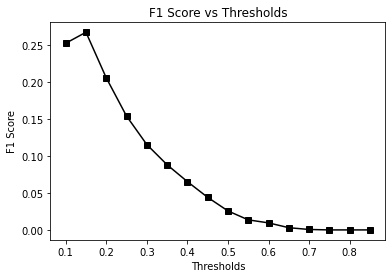

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'k')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Thresholds')
plt.show()

In [ ]:
imp = lgb_fi_df[lgb_fi_df['Importances with CW'] >= 0]['Features']
print("Number of features:", len(imp))
lgb1 = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
lgb1.fit(X_train[imp], y_train)
pred = lgb1.predict(X_test[imp])
prob = lgb1.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

Number of features: 104
[[17085  8700]
 [ 1492  1844]]
              precision    recall  f1-score   support

           0       0.92      0.66      0.77     25785
           1       0.17      0.55      0.27      3336

    accuracy                           0.65     29121
   macro avg       0.55      0.61      0.52     29121
weighted avg       0.83      0.65      0.71     29121

ROC_AUC: 0.6497606801121057


In [ ]:
imp = lgb_fi_df[lgb_fi_df['Importances with CW'] >= 22]['Features']
print("Number of features:", len(imp))
lgb1 = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True)
lgb1.fit(X_train[imp], y_train)
pred = lgb1.predict(X_test[imp])
prob = lgb1.predict_proba(X_test[imp])[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

Number of features: 31
[[16912  8873]
 [ 1485  1851]]
              precision    recall  f1-score   support

           0       0.92      0.66      0.77     25785
           1       0.17      0.55      0.26      3336

    accuracy                           0.64     29121
   macro avg       0.55      0.61      0.51     29121
weighted avg       0.83      0.64      0.71     29121

ROC_AUC: 0.6465425972194903


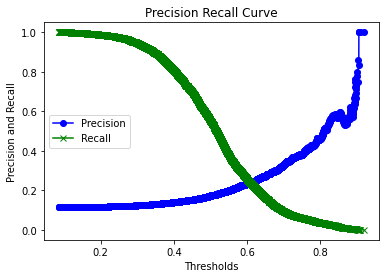

In [ ]:
prec, rec, thresh = precision_recall_curve(y_test, prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'best')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Curve')
plt.show()

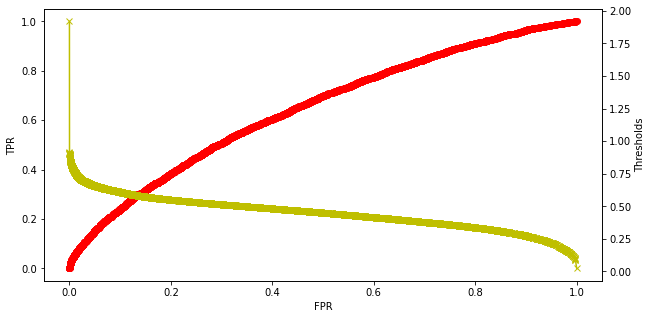

In [ ]:
fpr, tpr, thresh = roc_curve(y_test, prob)
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(fpr, tpr, marker = 'o', c = 'r')
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax1 = ax.twinx()
ax1.plot(fpr, thresh, marker = 'x', c = 'y')
ax1.set_ylabel('Thresholds')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.117956,0.206095,0.114894,0.999400
1,0.15,0.129288,0.207575,0.115868,0.995504
2,0.20,0.148244,0.209963,0.117463,0.988010
3,0.25,0.179183,0.213743,0.120044,0.973921
4,0.30,0.228598,0.219349,0.124057,0.946043
5,0.35,0.304763,0.227606,0.130399,0.894185
6,0.40,0.410185,0.238787,0.140108,0.807554
7,0.45,0.522235,0.250821,0.152872,0.698141
8,0.50,0.644312,0.263300,0.172604,0.554856
9,0.55,0.752962,0.261548,0.198876,0.381894


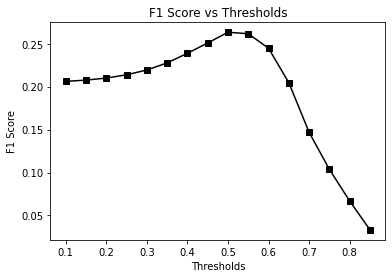

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'k')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Thresholds')
plt.show()

## XGBoost

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from xgboost import XGBClassifier
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.over_sampling import SMOTE, SMOTENC, RandomOverSampler
from imblearn.combine import SMOTETomek
import time
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, random_state = 0, stratify = y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((67949, 95), (29121, 95), (67949,), (29121,))

In [ ]:
y_train.sum()

7784

In [ ]:
67949-7784

60165

In [ ]:
weight = 60165/7784
weight

7.72931654676259

In [ ]:
model = XGBClassifier(random_state = 0, n_jobs = -1)
model.fit(X_train, y_train)
sorted(zip(model.feature_importances_, X_train.columns), reverse = True)

[(0.09763332, 'preceding_year_visits'),
 (0.074054845,
  'discharge_disposition_id_Transferred to another medical facility'),
 (0.025621982, 'insulin_treatment_insulin_only'),
 (0.02344511, 'diag_1_External causes of injury'),
 (0.022201315,
  'discharge_disposition_id_Still patient/referred to this institution'),
 (0.022033826, 'time_in_hospital'),
 (0.021746315, 'number_diagnoses'),
 (0.020897107, 'diag_1_Pregnancy, Childbirth'),
 (0.019829785, 'age'),
 (0.019209553, 'diag_1_Musculoskeletal System and Connective Tissue'),
 (0.018719388, 'diag_1_Diabetes'),
 (0.018365977, 'A1Cresult_Norm'),
 (0.01803824, 'diag_2_Neoplasms'),
 (0.017823787, 'diag_3_Neoplasms'),
 (0.016225567, 'diabetesMed'),
 (0.01615074, 'diag_3_Diabetes'),
 (0.016127516, 'race_Hispanic'),
 (0.01517793, 'diag_1_Respiratory'),
 (0.014898698, 'diag_1_Mental Disorders'),
 (0.014670946, 'diag_3_Infectious and Parasitic'),
 (0.014349018, 'admission_source_id_Referral'),
 (0.014208642,
  'discharge_disposition_id_Discharged

In [ ]:
model_cw = XGBClassifier(random_state = 0, n_jobs = -1, scale_pos_weight = weight)
model_cw.fit(X_train, y_train)
sorted(zip(model_cw.feature_importances_, X_train.columns), reverse = True)

[(0.11015245, 'preceding_year_visits'),
 (0.09855306,
  'discharge_disposition_id_Transferred to another medical facility'),
 (0.026058724, 'number_diagnoses'),
 (0.024185466, 'diag_1_Musculoskeletal System and Connective Tissue'),
 (0.023388777, 'time_in_hospital'),
 (0.022898253, 'insulin_treatment_insulin_only'),
 (0.019844865, 'diag_1_Pregnancy, Childbirth'),
 (0.01943115, 'age'),
 (0.018074457, 'A1Cresult_Norm'),
 (0.016618093, 'race_Hispanic'),
 (0.016178304, 'diag_1_Respiratory'),
 (0.015416241, 'diabetesMed'),
 (0.015129163, 'diag_1_External causes of injury'),
 (0.014708788, 'diag_1_Circulatory'),
 (0.014585239, 'diag_2_Neoplasms'),
 (0.014162342, 'num_medications'),
 (0.01405839,
  'discharge_disposition_id_Still patient/referred to this institution'),
 (0.013878585, 'diag_2_Diabetes'),
 (0.013676609, 'number_changes'),
 (0.0134020215, 'diag_3_Diabetes'),
 (0.012482481, 'diag_1_Endocrine, Nutritional, Metabolic, Immunity'),
 (0.012310358, 'diag_1_Infectious and Parasitic'),
 

In [ ]:
X_t = X_train.copy()
X_t['random'] = np.random.randint(0, 2, X_t.shape[0])
model_random = XGBClassifier(random_state = 0, n_jobs = -1, scale_pos_weight = weight)
model_random.fit(X_t, y_train)
sorted(zip(model_random.feature_importances_, X_t.columns), reverse = True)

[(0.11620799, 'preceding_year_visits'),
 (0.092827514,
  'discharge_disposition_id_Transferred to another medical facility'),
 (0.023756016, 'number_diagnoses'),
 (0.02261892, 'time_in_hospital'),
 (0.022391671, 'insulin_treatment_insulin_only'),
 (0.022148535, 'diag_1_Musculoskeletal System and Connective Tissue'),
 (0.022076087, 'diag_1_Pregnancy, Childbirth'),
 (0.02002753, 'age'),
 (0.016875958, 'diabetesMed'),
 (0.016655672, 'diag_1_Respiratory'),
 (0.016304092, 'diag_1_Circulatory'),
 (0.01617546, 'race_Hispanic'),
 (0.015510787, 'diag_2_Neoplasms'),
 (0.015405022, 'A1Cresult_Norm'),
 (0.015367101, 'diag_1_External causes of injury'),
 (0.0153036965, 'diag_1_Injury and Poisoning'),
 (0.014554674, 'number_changes'),
 (0.014272934,
  'discharge_disposition_id_Still patient/referred to this institution'),
 (0.0142473085, 'diag_2_Diabetes'),
 (0.014218858, 'num_medications'),
 (0.013849449, 'diag_3_Diabetes'),
 (0.013229456, 'diag_2_Pregnancy, Childbirth'),
 (0.012764656, 'diag_3_Gen

In [ ]:
fi_df = pd.DataFrame({'Features' : X_train.columns, 'Importances without CW' : model.feature_importances_,
                          'Importances with CW' : model_cw.feature_importances_})
fi_df

,Features,Importances without CW,Importances with CW
0,gender,0.012161,0.009078
1,age,0.019830,0.019431
2,time_in_hospital,0.022034,0.023389
3,num_lab_procedures,0.010906,0.009294
4,num_procedures,0.013072,0.009495
5,num_medications,0.013552,0.014162
6,number_diagnoses,0.021746,0.026059
7,metformin,0.012740,0.011863
8,repaglinide,0.012726,0.006477
9,glimepiride,0.000000,0.006581


### Without Class Weight

In [ ]:
imp = fi_df[fi_df['Importances without CW'] >= 0]['Features']
print("Number of features:", len(imp))
model = XGBClassifier(n_jobs = -1, random_state = 0)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 95
Training Time: 11.279470682144165
Prediction Time: 0.09786105155944824
Train Accuracy Score: 0.8855612297458388
Train Confusion Matrix:
 [[60164     1]
 [ 7775     9]] 

Train F1 Score: 0.0023094688221709007
Train Precision Score: 0.9
Train Recall Score: 0.0011562178828365879
Train ROC_AUC Score: 0.6704319427244826

Test Accuracy Score: 0.8856495312660966
Test Confusion Matrix:
 [[25784     1]
 [ 3329     7]] 

Test F1 Score: 0.004186602870813397
Test Precision Score: 0.875
Test Recall Score: 0.0020983213429256594
Test ROC_AUC Score: 0.6630259724739116


In [ ]:
imp = fi_df[fi_df['Importances without CW'] >= 0.01]['Features']
print("Number of features:", len(imp))
model = XGBClassifier(n_jobs = -1, random_state = 0)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 50
Training Time: 6.718195676803589
Prediction Time: 0.08240747451782227
Train Accuracy Score: 0.8855465128257958
Train Confusion Matrix:
 [[60163     2]
 [ 7775     9]] 

Train F1 Score: 0.002309172546504169
Train Precision Score: 0.8181818181818182
Train Recall Score: 0.0011562178828365879
Train ROC_AUC Score: 0.6699911873044571

Test Accuracy Score: 0.8856495312660966
Test Confusion Matrix:
 [[25783     2]
 [ 3328     8]] 

Test F1 Score: 0.004781829049611476
Test Precision Score: 0.8
Test Recall Score: 0.002398081534772182
Test ROC_AUC Score: 0.6629238959036376


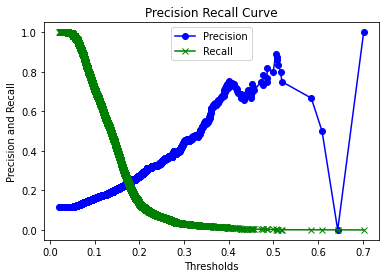

In [ ]:
prec, rec, thresh = precision_recall_curve(y_test, y_test_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'best')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Curve')
plt.show()

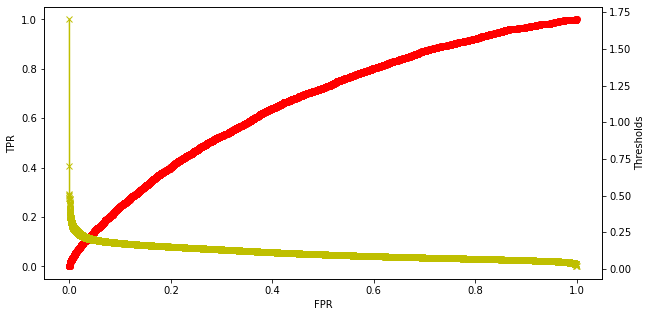

In [ ]:
fpr, tpr, thresh = roc_curve(y_test, y_test_prob)
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(fpr, tpr, marker = 'o', c = 'r')
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax1 = ax.twinx()
ax1.plot(fpr, thresh, marker = 'x', c = 'y')
ax1.set_ylabel('Thresholds')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.536589,0.260102,0.159163,0.711031
1,0.15,0.751417,0.273703,0.205700,0.408873
2,0.20,0.859345,0.179816,0.270808,0.134592
3,0.25,0.878610,0.109347,0.342812,0.065048
4,0.30,0.884585,0.059334,0.447257,0.031775
5,0.35,0.885787,0.037058,0.542373,0.019185
6,0.40,0.886233,0.021848,0.725490,0.011091
7,0.45,0.885684,0.008341,0.666667,0.004197
8,0.50,0.885650,0.004782,0.800000,0.002398
9,0.55,0.885512,0.001796,0.750000,0.000899


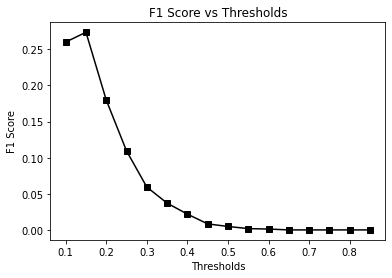

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'k')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Thresholds')
plt.show()

### With Class Weight

In [ ]:
imp = fi_df[fi_df['Importances with CW'] >= 0]['Features']
print("Number of features:", len(imp))
model = XGBClassifier(random_state = 0, n_jobs = -1, scale_pos_weight = weight)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 95
Training Time: 11.273347616195679
Prediction Time: 0.10129594802856445
Train Accuracy Score: 0.6127242490691548
Train Confusion Matrix:
 [[36685 23480]
 [ 2835  4949]] 

Train F1 Score: 0.2733272581669566
Train Precision Score: 0.1740828027718175
Train Recall Score: 0.6357913669064749
Train ROC_AUC Score: 0.6733091366419632

Test Accuracy Score: 0.6143676384739535
Test Confusion Matrix:
 [[15812  9973]
 [ 1257  2079]] 

Test F1 Score: 0.27021055367819075
Test Precision Score: 0.17250248921340855
Test Recall Score: 0.6232014388489209
Test ROC_AUC Score: 0.6640637112183436


In [ ]:
imp = fi_df[fi_df['Importances with CW'] >= 0.01]['Features']
print("Number of features:", len(imp))
model = XGBClassifier(random_state = 0, n_jobs = -1, scale_pos_weight = weight)
start_time = time.time()
model.fit(X_train[imp], y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train[imp])
y_train_prob = model.predict_proba(X_train[imp])[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test[imp])
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test[imp])[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Number of features: 37
Training Time: 5.4562413692474365
Prediction Time: 0.07878589630126953
Train Accuracy Score: 0.6141370733932803
Train Confusion Matrix:
 [[36865 23300]
 [ 2919  4865]] 

Train F1 Score: 0.27066121449831704
Train Precision Score: 0.17273211432629149
Train Recall Score: 0.625
Train ROC_AUC Score: 0.6678911502702956

Test Accuracy Score: 0.6163593283197693
Test Confusion Matrix:
 [[15891  9894]
 [ 1278  2058]] 

Test F1 Score: 0.2692307692307692
Test Precision Score: 0.17218875502008033
Test Recall Score: 0.6169064748201439
Test ROC_AUC Score: 0.6620772259446659


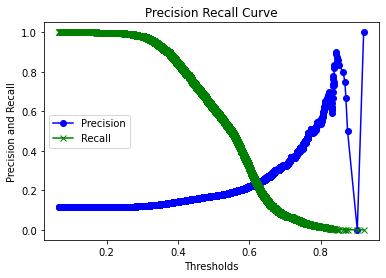

In [ ]:
prec, rec, thresh = precision_recall_curve(y_test, y_test_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'best')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Curve')
plt.show()

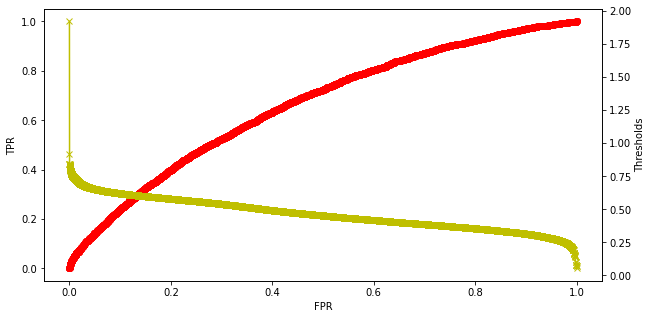

In [ ]:
fpr, tpr, thresh = roc_curve(y_test, y_test_prob)
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(fpr, tpr, marker = 'o', c = 'r')
ax.set_xlabel('FPR')
ax.set_ylabel('TPR')
ax1 = ax.twinx()
ax1.plot(fpr, thresh, marker = 'x', c = 'y')
ax1.set_ylabel('Thresholds')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.116376,0.205802,0.114712,0.999400
1,0.15,0.117819,0.205971,0.114825,0.998801
2,0.20,0.121184,0.206499,0.115161,0.998201
3,0.25,0.135332,0.208425,0.116422,0.993705
4,0.30,0.179080,0.214703,0.120564,0.979616
5,0.35,0.270698,0.226077,0.128682,0.929856
6,0.40,0.401772,0.244175,0.142748,0.843525
7,0.45,0.520449,0.258482,0.157063,0.729616
8,0.50,0.616359,0.269231,0.172189,0.616906
9,0.55,0.697881,0.274691,0.189447,0.499400


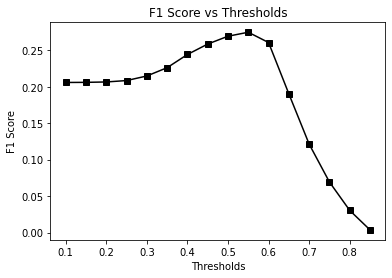

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'k')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score')
plt.title('F1 Score vs Thresholds')
plt.show()

### Sampling Techniques

#### Under Sampling

In [ ]:
X_train.head()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
73921,0,45,6,53,1,29,8,-1,-2,0,-2,-2,-2,-2,-1,1,2,2,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0
96919,0,85,2,43,0,24,7,-2,-2,-2,0,-2,-2,-2,0,1,3,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
25853,1,65,1,1,1,17,3,-2,-2,-2,-2,-2,-2,-2,-2,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
31598,1,85,5,42,0,20,9,-2,-2,-2,1,-2,-2,-2,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
24086,1,65,3,45,2,17,8,-2,-2,-2,-2,-2,-2,-2,-2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0


In [ ]:
X_test.head()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
30282,0,75,7,44,2,15,5,-2,-2,-2,-2,-2,0,-2,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
26995,0,45,2,42,0,14,5,-2,-2,-2,-2,-2,-2,-2,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0
31897,0,45,2,38,1,14,8,-2,-2,-2,-2,-2,-2,-2,-2,0,3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
45041,1,65,5,32,6,50,9,-2,-2,-2,-2,-2,-2,0,1,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
67906,1,95,7,66,1,27,9,-2,-2,-2,-2,0,-2,-2,-2,1,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1


In [ ]:
rus = RandomUnderSampler(random_state = 0)
X_rus, y_rus = rus.fit_resample(X_train[imp], y_train)
model = XGBClassifier(random_state = 0, n_jobs = -1)
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp].values)
prob = model.predict_proba(X_test[imp].values)[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

In [ ]:
rus = RandomUnderSampler(random_state = 0)
X_rus, y_rus = rus.fit_resample(X_train[imp], y_train)
model = XGBClassifier(random_state = 0, n_jobs = -1, scale_pos_weight = 8)
model.fit(X_rus, y_rus)
pred = model.predict(X_test[imp].values)
prob = model.predict_proba(X_test[imp].values)[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

#### Over Sampling

In [ ]:
ros = RandomOverSampler(random_state = 0)
X_ros, y_ros = ros.fit_resample(X_train[imp], y_train)
model = XGBClassifier(random_state = 0, n_jobs = -1)
model.fit(X_ros, y_ros)
pred = model.predict(X_test[imp].values)
prob = model.predict_proba(X_test[imp].values)[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

In [ ]:
ros = RandomOverSampler(random_state = 0)
X_ros, y_ros = ros.fit_resample(X_train[imp], y_train)
model = XGBClassifier(random_state = 0, n_jobs = -1, scale_pos_weight = 8)
model.fit(X_ros, y_ros)
pred = model.predict(X_test[imp].values)
prob = model.predict_proba(X_test[imp].values)[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

#### SMOTE

In [ ]:
sm = SMOTE(random_state = 0, n_jobs = -1)
X_sm, y_sm = sm.fit_resample(X_train[imp], y_train)
model = XGBClassifier(random_state = 0, n_jobs = -1)
model.fit(X_sm, y_sm)
pred = model.predict(X_test[imp].values)
prob = model.predict_proba(X_test[imp].values)[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[19302  6483]
 [ 2380   956]]
              precision    recall  f1-score   support

           0       0.89      0.75      0.81     25785
           1       0.13      0.29      0.18      3336

    accuracy                           0.70     29121
   macro avg       0.51      0.52      0.50     29121
weighted avg       0.80      0.70      0.74     29121

ROC_AUC: 0.5373380643943251


In [ ]:
sm = SMOTE(random_state = 0, n_jobs = -1)
X_sm, y_sm = sm.fit_resample(X_train[imp], y_train)
model = XGBClassifier(random_state = 0, n_jobs = -1, scale_pos_weight = 8)
model.fit(X_sm, y_sm)
pred = model.predict(X_test[imp].values)
prob = model.predict_proba(X_test[imp].values)[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[ 3077 22708]
 [  260  3076]]
              precision    recall  f1-score   support

           0       0.92      0.12      0.21     25785
           1       0.12      0.92      0.21      3336

    accuracy                           0.21     29121
   macro avg       0.52      0.52      0.21     29121
weighted avg       0.83      0.21      0.21     29121

ROC_AUC: 0.5432671547462437


#### SmoteTomek

In [ ]:
smtmk = SMOTETomek(random_state = 0)
X_smtmk, y_smtmk = sm.fit_resample(X_train[imp], y_train)
model = XGBClassifier(random_state = 0, n_jobs = -1)
model.fit(X_smtmk, y_smtmk)
pred = model.predict(X_test[imp].values)
prob = model.predict_proba(X_test[imp].values)[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[19302  6483]
 [ 2380   956]]
              precision    recall  f1-score   support

           0       0.89      0.75      0.81     25785
           1       0.13      0.29      0.18      3336

    accuracy                           0.70     29121
   macro avg       0.51      0.52      0.50     29121
weighted avg       0.80      0.70      0.74     29121

ROC_AUC: 0.5373380643943251


In [ ]:
smtmk = SMOTETomek(random_state = 0)
X_smtmk, y_smtmk = sm.fit_resample(X_train[imp], y_train)
model = XGBClassifier(random_state = 0, n_jobs = -1, scale_pos_weight = 8)
model.fit(X_smtmk, y_smtmk)
pred = model.predict(X_test[imp].values)
prob = model.predict_proba(X_test[imp].values)[:, 1]
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
print("ROC_AUC:", roc_auc_score(y_test, prob))

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


[[ 3077 22708]
 [  260  3076]]
              precision    recall  f1-score   support

           0       0.92      0.12      0.21     25785
           1       0.12      0.92      0.21      3336

    accuracy                           0.21     29121
   macro avg       0.52      0.52      0.21     29121
weighted avg       0.83      0.21      0.21     29121

ROC_AUC: 0.5432671547462437


### Hyper-Parameter Tuning

In [ ]:
model = XGBClassifier(random_state = 0, silent = 0, scale_pos_weight = weight,
                      objective = 'binary:logistic', eval_metric = 'auc')

params = {'max_depth' : np.arange(3, 11),
          'learning_rate' : np.linspace(0.01, 0.3, 30),
          'subsample' : np.linspace(0.5, 1, 11),
          'colsample_bytree' : np.linspace(0.5, 1, 11),
          'gamma' : np.arange(0, 0.6, 0.1),
          'n_estimators' : np.arange(100, 5001),
          'min_child_weight' : np.arange(1, 13),
          'reg_alpha' : [0, 1e-5, 5e-5, 1e-4, 5e-4, 0.001, 0.005,
                         0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100]}

rsearch = RandomizedSearchCV(model, params, n_iter = 25, scoring = 'roc_auc', n_jobs = -1,
                             cv = 3, verbose = 1, random_state = 0)
rsearch.fit(X_train, y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 281.4min
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed: 527.2min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1,
                                           eval_metric='auc', gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=1, nthread=None,
                                           objective='binary:logistic',
                                           random_state=0, reg_alpha...
                                        'min_child_weight': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
                                        'n_estimators': array

In [ ]:
print("Best ROC_AUC : ", rsearch.best_score_)
rsearch.best_params_

Best ROC_AUC :  0.6543882375086074


{'colsample_bytree': 0.95,
 'gamma': 0.5,
 'learning_rate': 0.01,
 'max_depth': 6,
 'min_child_weight': 12,
 'n_estimators': 1183,
 'reg_alpha': 0.05,
 'subsample': 0.9}

In [ ]:
model = rsearch.best_estimator_
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 334.9746413230896
Prediction Time: 2.2470784187316895
Train Accuracy Score: 0.6833213145152982
Train Confusion Matrix:
 [[40918 19247]
 [ 2271  5513]] 

Train F1 Score: 0.3388028515240905
Train Precision Score: 0.22265751211631665
Train Recall Score: 0.7082476875642343
Train ROC_AUC Score: 0.768007815139063

Test Accuracy Score: 0.6537550221489646
Test Confusion Matrix:
 [[17159  8626]
 [ 1457  1879]] 

Test F1 Score: 0.2715121739758688
Test Precision Score: 0.17886720609233697
Test Recall Score: 0.5632494004796164
Test ROC_AUC Score: 0.6636966633790118
Training Time: 333.17999482154846
Prediction Time: 2.20017409324646
Train Accuracy Score: 0.6833213145152982
Train Confusion Matrix:
 [[40918 19247]
 [ 2271  5513]] 

Train F1 Score: 0.3388028515240905
Train Precision Score: 0.22265751211631665
Train Recall Score: 0.7082476875642343
Train ROC_AUC Score: 0.768007815139063

Test Accuracy Score: 0.6537550221489646
Test Confusion Matrix:
 [[17159  8626]
 [ 1457  1879]] 

Test

In [ ]:
np.linspace(0.6, 1, 9)

array([0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ])

In [ ]:
np.arange(0.001, 0.05, 0.01)

array([0.001, 0.011, 0.021, 0.031, 0.041])

In [ ]:
model = XGBClassifier(random_state = 0, scale_pos_weight = weight, objective = 'binary:logistic', eval_metric = 'auc', n_jobs = 4)
cv = StratifiedKFold(n_splits = 3, shuffle = True, random_state = 0)
params = {'colsample_bytree' : np.linspace(0.6, 1, 9),
          'gamma' : np.arange(0.1, 1, 0.1),
          'learning_rate' : np.linspace(0.005, 0.015, 11),
          'max_depth' : np.arange(4, 10),
          'min_child_weight' : np.arange(10, 15),
          'n_estimators' : np.arange(1100, 1200),
          'reg_alpha' : np.linspace(0.01, 0.1, 10),
          'reg_lambda' : [0, 1e-5, 5e-5, 1e-4, 5e-4, 0.001, 0.005,
                         0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100],
          'subsample' : np.linspace(0.6, 1, 9),      
          }

rsearch = RandomizedSearchCV(model, params, n_iter = 25, scoring = 'roc_auc', n_jobs = -1,
                             cv = cv, verbose = 4, random_state = 0)
rsearch.fit(X_train, y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed: 62.8min
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed: 217.2min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=0, shuffle=True),
                   error_score=nan,
                   estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                           colsample_bylevel=1,
                                           colsample_bynode=1,
                                           colsample_bytree=1,
                                           eval_metric='auc', gamma=0,
                                           learning_rate=0.1, max_delta_step=0,
                                           max_depth=3, min_child_weight=1,
                                           missing=None, n_estimators=100,
                                           n_jobs=4, nthread=Non...
       1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198,
       1199]),
                                        'reg_alpha': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ]),
                                    

In [ ]:
print("Best ROC_AUC : ", rsearch.best_score_)
rsearch.best_params_

Best ROC_AUC :  0.6564794882660389


{'colsample_bytree': 0.7,
 'gamma': 0.7000000000000001,
 'learning_rate': 0.011999999999999999,
 'max_depth': 4,
 'min_child_weight': 12,
 'n_estimators': 1129,
 'reg_alpha': 0.01,
 'reg_lambda': 5,
 'subsample': 0.6}

In [ ]:
model = rsearch.best_estimator_
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 163.74219346046448
Prediction Time: 0.7788183689117432
Train Accuracy Score: 0.6368894317797171
Train Confusion Matrix:
 [[38178 21987]
 [ 2686  5098]] 

Train F1 Score: 0.29240872981731625
Train Precision Score: 0.18822226324533875
Train Recall Score: 0.6549331963001028
Train ROC_AUC Score: 0.7028877549739245

Test Accuracy Score: 0.6287902201160674
Test Confusion Matrix:
 [[16259  9526]
 [ 1284  2052]] 

Test F1 Score: 0.27517768539627196
Test Precision Score: 0.17723268267403697
Test Recall Score: 0.6151079136690647
Test ROC_AUC Score: 0.6679589719730906


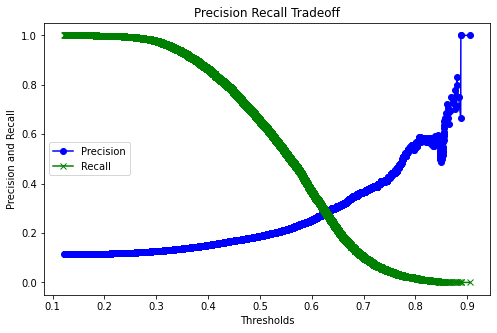

In [ ]:
plt.figure(figsize = (8, 5))
prec, rec, thresh = precision_recall_curve(y_train, y_train_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'center left')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Tradeoff')
plt.show()

Best Threshold=0.498993, G-Mean=0.645


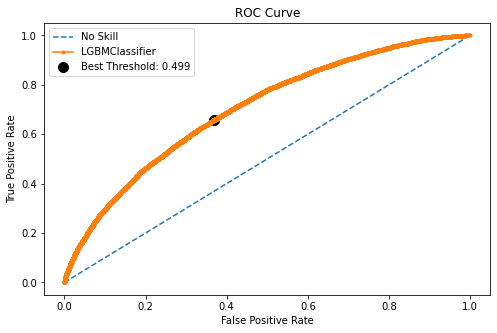

In [ ]:
plt.figure(figsize = (8, 5))
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_train, y_train_prob)
# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans)
best_thresh = thresholds[ix]
print('Best Threshold=%f, G-Mean=%.3f' % (best_thresh, gmeans[ix]))
# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='LGBMClassifier')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', alpha = 1, edgecolors = 'k', s = 100,
            label='Best Threshold: '+str(round(best_thresh, 3)))
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC Curve")
plt.legend(loc = 'best')
# show the plot
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_train_prob >= i).astype(bool)
    f1.append(f1_score(y_train, pred))
    acc.append(accuracy_score(y_train, pred))
    prec.append(precision_score(y_train, pred))
    rec.append(recall_score(y_train, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.115425,0.205725,0.114656,1.000000
1,0.15,0.119060,0.206356,0.115052,0.999743
2,0.20,0.132290,0.208739,0.116544,0.999101
3,0.25,0.164874,0.214218,0.120049,0.993705
4,0.30,0.226935,0.224538,0.126845,0.977004
5,0.35,0.318872,0.238783,0.136921,0.932554
6,0.40,0.428895,0.257188,0.151109,0.863052
7,0.45,0.539993,0.277144,0.168993,0.769784
8,0.50,0.636889,0.292409,0.188222,0.654933
9,0.55,0.723278,0.301964,0.212343,0.522482


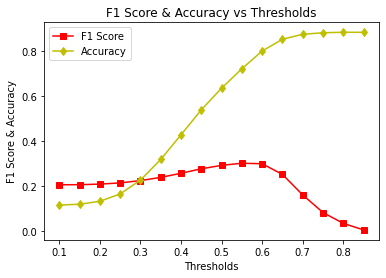

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'r', label = 'F1 Score')
plt.plot(thresh, acc, marker = 'd', c = 'y', label = 'Accuracy')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score & Accuracy')
plt.title('F1 Score & Accuracy vs Thresholds')
plt.legend(loc = 'best')
plt.show()

In [ ]:
y_train_pred = (y_train_prob >= best_thresh).astype(bool)
y_test_pred = (y_test_prob >= best_thresh).astype(bool)
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Train Accuracy Score: 0.6348879306538727
Train Confusion Matrix:
 [[38020 22145]
 [ 2664  5120]] 

Train F1 Score: 0.29216240120973497
Train Precision Score: 0.18778653951953053
Train Recall Score: 0.65775950668037
Train ROC_AUC Score: 0.7028877549739245

Test Accuracy Score: 0.6270732461110539
Test Confusion Matrix:
 [[16199  9586]
 [ 1274  2062]] 

Test F1 Score: 0.2752269087026162
Test Precision Score: 0.1770260989010989
Test Recall Score: 0.61810551558753
Test ROC_AUC Score: 0.6679589719730906


### Different Data

In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed.csv')
df.head()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,rosiglitazone,acarbose,miglitol,troglitazone,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,preceding_year_visits,number_diab_meds,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Not Available,Referral,1,41,0,1,0,0,0,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,0,0,no_med
1,Caucasian,0,15,Emergency,Discharged to home,Emergency,3,59,0,18,0,0,0,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,-2,-2,-2,-2,1,1,0,0,1,1,insulin_only
2,AfricanAmerican,0,25,Emergency,Discharged to home,Emergency,2,11,5,13,2,0,1,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,0,1,0,3,1,0,other_meds
3,Caucasian,1,35,Emergency,Discharged to home,Emergency,2,44,1,16,0,0,0,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,-2,1,-2,-2,-2,-2,-2,1,1,0,0,1,1,insulin_only
4,Caucasian,1,45,Emergency,Discharged to home,Emergency,1,51,0,8,0,0,0,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,-2,-2,-2,0,-2,-2,-2,-2,-2,1,1,0,0,2,0,insulin_combo


In [ ]:
df = df.drop('metformin-rosiglitazone', 1)

In [ ]:
X = df.drop(['readmitted'], 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, random_state = 0, stratify = y)

In [ ]:
model_cw = XGBClassifier(random_state = 0, n_jobs = -1, scale_pos_weight = 8)
model_cw.fit(X_train, y_train)
sorted(zip(model_cw.feature_importances_, X_train.columns), reverse = True)

[(0.14150496, 'number_inpatient'),
 (0.10246261,
  'discharge_disposition_id_Transferred to another medical facility'),
 (0.034265712, 'preceding_year_visits'),
 (0.026708933, 'number_diagnoses'),
 (0.020559106, 'insulin_treatment_insulin_only'),
 (0.018846521, 'diabetesMed'),
 (0.018422516,
  'discharge_disposition_id_Discharged to home with home health service'),
 (0.018187363, 'age'),
 (0.017495427, 'diag_1_Musculoskeletal System and Connective Tissue'),
 (0.016784102, 'diag_1_Pregnancy, Childbirth'),
 (0.015890999, 'time_in_hospital'),
 (0.015789263, 'number_changes'),
 (0.013984866, 'diag_1_Circulatory'),
 (0.013562798, 'diag_1_Respiratory'),
 (0.013523234, 'diag_2_Neoplasms'),
 (0.012888318, 'diag_2_Diabetes'),
 (0.01276401, 'diag_1_External causes of injury'),
 (0.011814551,
  'discharge_disposition_id_Still patient/referred to this institution'),
 (0.011761614, 'metformin'),
 (0.011599503, 'num_medications'),
 (0.011372775, 'rosiglitazone'),
 (0.011290764, 'diag_3_Infectious an

## SVM

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import PowerTransformer, MinMaxScaler, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn import svm
from sklearn.metrics import roc_curve, precision_recall_curve, classification_report, confusion_matrix
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, roc_auc_score
import time
from sklearn.utils.class_weight import compute_class_weight
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop('readmitted', 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, stratify = y, random_state = 0)

In [ ]:
num_cols = ['age', 'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
            'number_diagnoses', 'preceding_year_visits', 'number_changes']

In [ ]:
X_train.loc[:, num_cols].skew()

age                     -0.621101
time_in_hospital         1.145219
num_lab_procedures      -0.242766
num_procedures           1.316956
num_medications          1.336549
number_diagnoses        -0.890263
preceding_year_visits    5.562799
number_changes           1.428450
dtype: float64

In [ ]:
X_train.loc[:, num_cols].isna().sum()

age                      0
time_in_hospital         0
num_lab_procedures       0
num_procedures           0
num_medications          0
number_diagnoses         0
preceding_year_visits    0
number_changes           0
dtype: int64

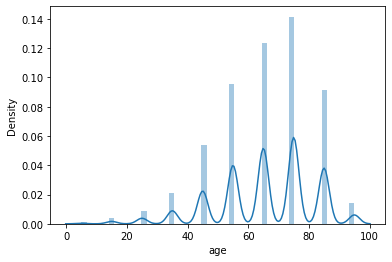

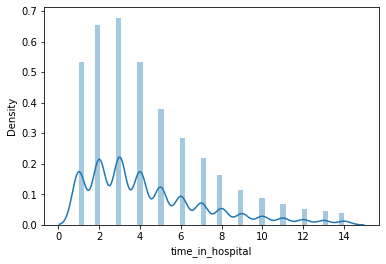

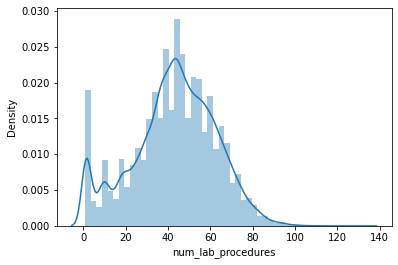

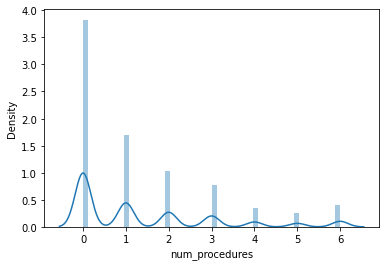

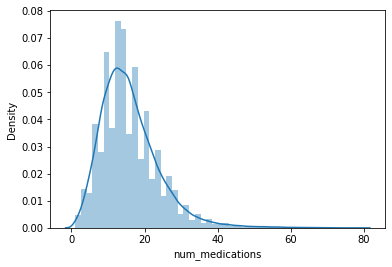

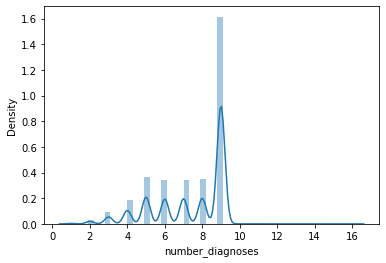

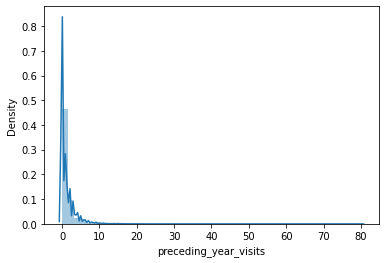

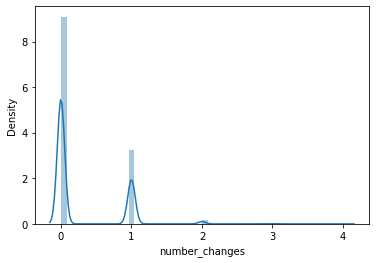

In [ ]:
for i in num_cols:
    sns.distplot(X_train[i])
    plt.show()

In [ ]:
num_cols = ['time_in_hospital', 'num_procedures', 'num_medications', 'preceding_year_visits', 'number_changes']

In [ ]:
skew_df = pd.DataFrame({"Skew Before" : df[num_cols].skew(), "Skew After" : np.sqrt(df[num_cols]).skew()})
skew_df

,Skew Before,Skew After
time_in_hospital,1.141139,0.476940
num_procedures,1.320396,0.406015
num_medications,1.331329,0.347681
preceding_year_visits,5.327782,1.164042
number_changes,1.425972,1.077153


In [ ]:
X_train[num_cols] = np.sqrt(X_train[num_cols])

In [ ]:
X_train.loc[:, num_cols].isna().sum()

time_in_hospital         0
num_procedures           0
num_medications          0
preceding_year_visits    0
number_changes           0
dtype: int64

In [ ]:
X_train.loc[:, num_cols].skew()

time_in_hospital         0.479532
num_procedures           0.405080
num_medications          0.348020
preceding_year_visits    1.153480
number_changes           1.075283
dtype: float64

In [ ]:
X_test[num_cols] = np.sqrt(X_test[num_cols])

In [ ]:
X_test.loc[:, num_cols].isna().sum()

time_in_hospital         0
num_procedures           0
num_medications          0
preceding_year_visits    0
number_changes           0
dtype: int64

In [ ]:
X_test.loc[:, num_cols].skew()

time_in_hospital         0.470813
num_procedures           0.408212
num_medications          0.346887
preceding_year_visits    1.188993
number_changes           1.081575
dtype: float64

In [ ]:
mm = MinMaxScaler()
X_train = pd.DataFrame(mm.fit_transform(X_train), columns = X_train.columns)
X_test = pd.DataFrame(mm.transform(X_test), columns = X_test.columns)
X_train.head()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
0,0.0,0.444444,0.528691,0.396947,0.408248,0.555915,0.466667,0.333333,0.0,0.666667,0.000000,0.0,0.0,0.0,0.333333,1.0,0.158114,0.707107,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.888889,0.151081,0.320611,0.000000,0.494280,0.400000,0.000000,0.0,0.000000,0.666667,0.0,0.0,0.0,0.666667,1.0,0.193649,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,1.0,0.666667,0.000000,0.000000,0.408248,0.395921,0.133333,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.111803,0.000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,1.0,0.888889,0.450847,0.312977,0.000000,0.440169,0.533333,0.000000,0.0,0.000000,1.000000,0.0,0.0,0.0,0.666667,1.0,0.000000,0.500000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

### Linear Kernel

In [ ]:
model = svm.SVC(kernel = 'linear', C = 0.01)
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)

Training Time: 172.17170214653015


AttributeError: ignored

In [ ]:
y_train_prob = model.decision_function(X_train)
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.decision_function(X_test)
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Prediction Time: 59.36860013008118
Train Accuracy Score: 0.885443494385495
Train Confusion Matrix:
 [[60165     0]
 [ 7784     0]] 

Train F1 Score: 0.0
Train Precision Score: 0.0
Train Recall Score: 0.0
Train ROC_AUC Score: 0.5086095532164929

Test Accuracy Score: 0.885443494385495
Test Confusion Matrix:
 [[25785     0]
 [ 3336     0]] 

Test F1 Score: 0.0
Test Precision Score: 0.0
Test Recall Score: 0.0
Test ROC_AUC Score: 0.5100932924399283


#### With Class Weight

In [ ]:
model = svm.SVC(kernel = 'linear', C = 0.01, class_weight = 'balanced', probability = True, random_state = 0)
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 7658.7549550533295
Prediction Time: 242.23250699043274
Train Accuracy Score: 0.6488101370145256
Train Confusion Matrix:
 [[39791 20374]
 [ 3489  4295]] 

Train F1 Score: 0.26469047545681446
Train Precision Score: 0.174105152215331
Train Recall Score: 0.5517728674203495
Train ROC_AUC Score: 0.6465820131585724

Test Accuracy Score: 0.6496686240170324
Test Confusion Matrix:
 [[17072  8713]
 [ 1489  1847]] 

Test F1 Score: 0.26583189407023605
Test Precision Score: 0.17490530303030302
Test Recall Score: 0.5536570743405276
Test ROC_AUC Score: 0.6512498378260742


# Final Model Tuned LGBM Interpretations

## Importing Libraries and Dataset

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold, cross_val_score, permutation_test_score
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from lightgbm import LGBMClassifier
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.over_sampling import SMOTE, SMOTENC, RandomOverSampler
from imblearn.combine import SMOTETomek
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.utils import resample
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [ ]:
!pip install skater

In [ ]:
!pip install shap

     |████████████████████████████████| 327kB 2.8MB/s 
  Created wheel for shap: filename=shap-0.36.0-cp36-cp36m-linux_x86_64.whl size=456467 sha256=14df80bc1fdbe4d49ca5c800e0ab960437ddfc7ac7a59db85e827f717019f038
  Stored in directory: /root/.cache/pip/wheels/fb/15/e1/8f61106790da27e0765aaa6e664550ca2c50ea339099e799f4
Successfully built shap


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop(['readmitted'], 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, random_state = 0, stratify = y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((67949, 95), (29121, 95), (67949,), (29121,))

In [ ]:
X_train.head()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
73921,0,45,6,53,1,29,8,-1,-2,0,-2,-2,-2,-2,-1,1,2,2,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0
96919,0,85,2,43,0,24,7,-2,-2,-2,0,-2,-2,-2,0,1,3,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
25853,1,65,1,1,1,17,3,-2,-2,-2,-2,-2,-2,-2,-2,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
31598,1,85,5,42,0,20,9,-2,-2,-2,1,-2,-2,-2,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
24086,1,65,3,45,2,17,8,-2,-2,-2,-2,-2,-2,-2,-2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0


In [ ]:
X_train = X_train.reset_index(drop = True)
X_test = X_test.reset_index(drop = True)
y_train = y_train.reset_index(drop = True)
y_test = y_test.reset_index(drop = True)

## Building Model and Making Predictions

In [ ]:
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True, silent = False,
                       colsample_bytree= 0.7, learning_rate= 0.055499999999999994, max_depth= 309, min_child_samples= 28,
                       n_estimators= 180, num_leaves= 31, reg_alpha= 50, reg_lambda= 5, subsample= 0.7, subsample_freq= 2)

In [ ]:
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 2.5391366481781006
Prediction Time: 0.2857027053833008
Train Accuracy Score: 0.6254838187464128
Train Confusion Matrix:
 [[37360 22805]
 [ 2643  5141]] 

Train F1 Score: 0.28776938147215225
Train Precision Score: 0.18396192657267588
Train Recall Score: 0.6604573484069887
Train ROC_AUC Score: 0.6970697072003686

Test Accuracy Score: 0.6207891212527042
Test Confusion Matrix:
 [[16016  9769]
 [ 1274  2062]] 

Test F1 Score: 0.27190611195358344
Test Precision Score: 0.17428788775251458
Test Recall Score: 0.61810551558753
Test ROC_AUC Score: 0.6658753916006229


## ROC Curve

Best Threshold=0.495109, G-Mean=0.641


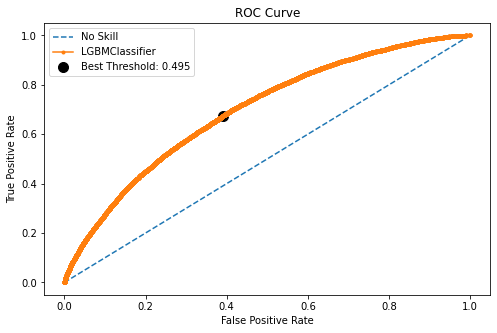

In [ ]:
plt.figure(figsize = (8, 5))
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_train, y_train_prob)
# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans)
best_thresh = thresholds[ix]
print('Best Threshold=%f, G-Mean=%.3f' % (best_thresh, gmeans[ix]))
# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='LGBMClassifier')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', alpha = 1, edgecolors = 'k', s = 100,
            label='Best Threshold: '+str(round(best_thresh, 3)))
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC Curve")
plt.legend(loc = 'best')
# show the plot
plt.show()

## Precision Recall Tradeoff

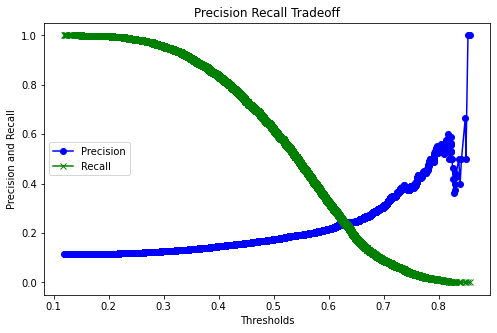

In [ ]:
plt.figure(figsize = (8, 5))
prec, rec, thresh = precision_recall_curve(y_test, y_test_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'center left')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Tradeoff')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.114591,0.205571,0.114560,1.000000
1,0.15,0.116686,0.205909,0.114774,0.999700
2,0.20,0.130765,0.208004,0.116122,0.996403
3,0.25,0.168538,0.213072,0.119491,0.982614
4,0.30,0.235191,0.222564,0.125948,0.955635
5,0.35,0.319872,0.233751,0.134195,0.905576
6,0.40,0.422444,0.248850,0.146208,0.835132
7,0.45,0.523780,0.260452,0.158407,0.732014
8,0.50,0.620789,0.271906,0.174288,0.618106
9,0.55,0.710106,0.274119,0.192187,0.477818


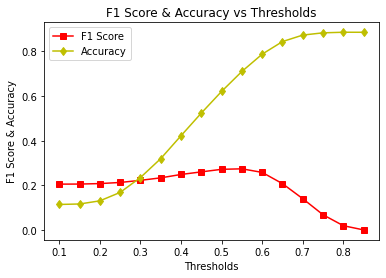

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'r', label = 'F1 Score')
plt.plot(thresh, acc, marker = 'd', c = 'y', label = 'Accuracy')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score & Accuracy')
plt.title('F1 Score & Accuracy vs Thresholds')
plt.legend(loc = 'best')
plt.show()

## Moving Threshold

In [ ]:
y_train_pred = (y_train_prob >= best_thresh).astype(bool)
y_test_pred = (y_test_prob >= best_thresh).astype(bool)
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Train Accuracy Score: 0.6168744205212733
Train Confusion Matrix:
 [[36668 23497]
 [ 2536  5248]] 

Train F1 Score: 0.28733335158367324
Train Precision Score: 0.18257088189250303
Train Recall Score: 0.6742034943473793
Train ROC_AUC Score: 0.6970697072003686

Test Accuracy Score: 0.6115861405858315
Test Confusion Matrix:
 [[15694 10091]
 [ 1220  2116]] 

Test F1 Score: 0.27227690921958436
Test Precision Score: 0.17334316375849923
Test Recall Score: 0.6342925659472423
Test ROC_AUC Score: 0.6658753916006229


## Feature Importance Plot

In [ ]:
fi_df = pd.DataFrame({'Features' : X_train.columns, 'Importances' : model.feature_importances_}).sort_values(by = 'Importances', ascending = False)
fi_df

,Features,Importances
5,num_medications,660
3,num_lab_procedures,626
2,time_in_hospital,454
1,age,403
16,preceding_year_visits,302
6,number_diagnoses,262
4,num_procedures,234
7,metformin,97
26,discharge_disposition_id_Transferred to anothe...,83
14,insulin,82


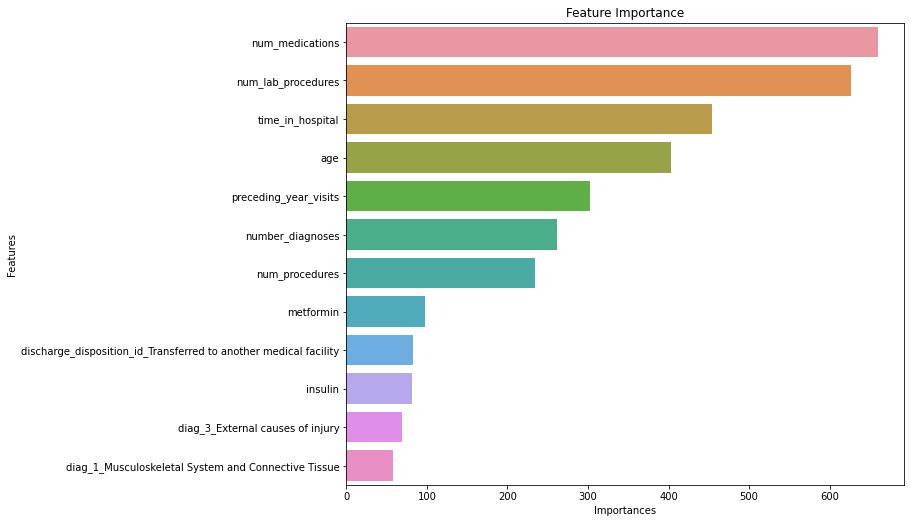

In [ ]:
fig = plt.figure(figsize = (10, 8.5))
sns.barplot(y=fi_df['Features'][:12], 
            x = fi_df['Importances'][:12],
            orient='h')
plt.title("Feature Importance")
plt.show()

## Model Agnostic Interpretation with Skater


In [ ]:
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel

interpreter = Interpretation(training_data=X_train, feature_names=list(X_train.columns))
im_model = InMemoryModel(model.predict_proba, examples=X_train, unique_values=[0, 1], target_names=['Not Readmitted', 'Readmitted < 30 Days'])

### Local Interpretations with Skater

Local Interpretation could be possibly be achieved in two ways. Firstly, one could possibly approximate the behavior of a complex predictive model in the vicinity of a single input using a simple interpretable auxiliary or surrogate model (e.g. Linear Regressor). Secondly, one could use the base estimator to understand the behavior of a single prediction using intuitive approximate functions based on inputs and outputs.

### Local Interpretable Model-Agnostic Explanations(LIME)
LIME is a novel algorithm designed by Riberio Marco, Singh Sameer, Guestrin Carlos to access the behavior of the any base estimator(model) using interpretable surrogate models (e.g. linear classifier/regressor). Such form of comprehensive evaluation helps in generating explanations which are locally faithful but may not align with the global behavior. Basically, LIME explanations are based on local surrogate models. These, surrogate models are interpretable models (like a linear model or decision tree) that are learned on the predictions of the original black box model. But instead of trying to fit a global surrogate model, LIME focuses on fitting local surrogate models to explain why single predictions were made.

The idea is very intuitive. To start with, just try and unlearn what you have done so far! Forget about the training data, forget about how your model works! Think that your model is a black box model with some magic happening inside, where you can input data points and get the models predicted outcomes. You can probe this magic black box as often as you want with inputs and get output predictions.

Now, you main objective is to understand why the machine learning model which you are treating as a magic black box, gave the outcome it produced. LIME tries to do this for you! It tests out what happens to you black box model's predictions when you feed variations or perturbations of your dataset into the black box model. Typically, LIME generates a new dataset consisting of perturbed samples and the associated black box model's predictions. On this dataset LIME then trains an interpretable model weighted by the proximity of the sampled instances to the instance of interest. Following is a standard high-level workflow for this.
 - Choose your instance of interest for which you want to have an explanation of the predictions of your black box model.
 - Perturb your dataset and get the black box predictions for these new points.
 - Weight the new samples by their proximity to the instance of interest.
 - Fit a weighted, interpretable (surrogate) model on the dataset with the variations.
 - Explain prediction by interpreting the local model.
 
We recommend you to read the [LIME chapter](https://christophm.github.io/interpretable-ml-book/lime.html) in Christoph Molnar's excellent book on Model Interpretation which talks about this in detail.

### Explaining Model Predictions with Skater using LIME

Skater can leverage LIME to explain model predictions. Typically, its __`LimeTabularExplainer`__ class helps in explaining predictions on tabular (i.e. matrix) data. For numerical features, it perturbs them by sampling from a Normal(0,1) and doing the inverse operation of mean-centering and scaling, according to the means and stds in the training data. For categorical features, it perturbs by sampling according to the training distribution, and making a binary feature that is 1 when the value is the same as the instance being explained. The __`explain_instance()`__ function generates explanations for a prediction. First, we generate neighborhood data by randomly perturbing features from the instance. We then learn locally weighted linear (surrogate) models on this neighborhood data to explain each of the classes in an interpretable way.

In [ ]:
from skater.core.local_interpretation.lime.lime_tabular import LimeTabularExplainer

model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True, silent = False,
                       colsample_bytree= 0.7, learning_rate= 0.055499999999999994, max_depth= 309, min_child_samples= 28,
                       n_estimators= 180, num_leaves= 31, reg_alpha= 50, reg_lambda= 5, subsample= 0.7, subsample_freq= 2)
model.fit(X_train.values, y_train)

exp = LimeTabularExplainer(X_test.values, feature_names=list(X_test.columns), 
                           discretize_continuous=True, 
                           class_names=['Not Readmitted', 'Readmitted < 30 Days'])

In [ ]:
y_test

0        0
1        0
2        0
3        0
4        1
        ..
29116    0
29117    0
29118    0
29119    0
29120    1
Name: readmitted, Length: 29121, dtype: int64

In [ ]:
X_test.head()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
0,0,75,7,44,2,15,5,-2,-2,-2,-2,-2,0,-2,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
1,0,45,2,42,0,14,5,-2,-2,-2,-2,-2,-2,-2,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0
2,0,45,2,38,1,14,8,-2,-2,-2,-2,-2,-2,-2,-2,0,3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
3,1,65,5,32,6,50,9,-2,-2,-2,-2,-2,-2,0,1,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
4,1,95,7,66,1,27,9,-2,-2,-2,-2,0,-2,-2,-2,1,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1


In [ ]:
doc_num = 0
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 0


In [ ]:
doc_num = 2
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 1


In [ ]:
doc_num = 4
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 1
Predicted Label: 1


In [ ]:
X_test.tail()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
29116,1,65,6,23,0,23,8,-2,-2,-2,1,-2,-2,-2,0,1,1,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
29117,0,35,3,21,1,6,9,-2,-2,-2,-2,-2,-2,-2,-2,0,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
29118,0,15,4,59,0,3,2,-2,-2,-2,-2,-2,-2,-2,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0
29119,0,75,11,58,1,13,7,0,-2,-2,-2,0,-2,-2,-2,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1
29120,1,85,3,53,0,14,9,-2,-2,-2,-2,-2,-2,-2,-1,1,4,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0


In [ ]:
doc_num = 29116
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 0


In [ ]:
doc_num = 29117
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 1


In [ ]:
doc_num = 29118
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 0


In [ ]:
doc_num = 29120
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 1
Predicted Label: 1


In [ ]:
doc_num = 5156
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 1


## Model Interpretation with SHAP

**SHAP (SHapley Additive exPlanations)** is a unified approach to explain the output of any machine learning model. SHAP connects game theory with local explanations, uniting several previous methods and representing the only possible consistent and locally accurate additive feature attribution method based on what they claim! (do check out the [SHAP NIPS paper](http://papers.nips.cc/paper/7062-a-unified-approach-to-interpreting-model-predictions) for details).



### Install

SHAP can be installed from [PyPI](https://pypi.org/project/shap)

```
pip install shap
```

or [conda-forge](https://anaconda.org/conda-forge/shap)

```
conda install -c conda-forge shap 
```

The really awesome aspect about this framework is while SHAP values can explain the output of any machine learning model, for really complex ensemble models it can be slow. But they have developed a high-speed exact algorithm for tree ensemble methods ([Tree SHAP arXiv paper](https://arxiv.org/abs/1802.03888)). Fast C++ implementations are supported for *XGBoost*, *LightGBM*, *CatBoost*, and *scikit-learn* tree models!

SHAP (SHapley Additive exPlanations) assigns each feature an importance value for a particular prediction. Its novel components include: the identification of a new class of additive feature importance measures, and theoretical results showing there is a unique solution in this class with a set of desirable properties. Typically, SHAP values try to explain the output of a model (function) as a sum of the effects of each feature being introduced into a conditional expectation. Importantly, for non-linear functions the order in which features are introduced matters. The SHAP values result from averaging over all possible orderings. Proofs from game theory show this is the only possible consistent approach. 

An intuitive way to understand the Shapley value is the following: The feature values enter a room in random order. All feature values in the room participate in the game (= contribute to the prediction). The Shapley value __$ϕ_{ij}$__ is the average marginal contribution of feature value __$x_{ij}$__ by joining whatever features already entered the room before, i.e.

$$\phi_{ij}=\sum_{\text{All.orderings}}val(\{\text{features.before.j}\}\cup{}x_{ij})-val(\{\text{features.before.j}\})$$

The following figure from the KDD 18 paper, [_Consistent Individualized Feature Attribution for Tree Ensembles_](https://arxiv.org/pdf/1802.03888.pdf) summarizes this in a nice way!

![](https://i.imgur.com/6Rc1dsa.png)

Let's now dive into SHAP and leverage it for interpreting our model!

In [ ]:
import shap
explainer = shap.TreeExplainer(model, data=X_train)
shap_values = explainer.shap_values(X_test)
pd.DataFrame(shap_values).head()

100%|===================| 29107/29121 [04:52<00:00]       

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94
0,-0.008196,0.071361,0.095909,0.016998,-0.007757,0.006599,-0.055117,0.020288,-0.000324,0.005020,-0.001747,-0.000698,-0.024503,0.002288,-0.013617,0.014191,-0.243218,-0.011665,0.000000,-0.006931,0.000263,0.000093,-0.006117,-0.000555,-0.025526,0.0,-0.195327,0.009524,0.002225,0.005193,-0.041125,0.000016,-0.011066,0.004762,-0.000353,-0.000900,0.003429,0.000655,0.000164,-0.000200,-0.169009,0.000000,0.000079,0.001152,0.000525,0.016814,0.0,0.000700,-0.004305,0.000000,-0.011799,-0.000354,0.000801,-0.000701,0.000552,0.000008,0.000034,0.002546,-0.015114,-0.007091,-0.000002,0.0,0.000510,0.0,0.013041,0.0,-0.000553,0.002813,-0.000105,-0.004193,-0.002183,0.004430,-0.129305,-0.001863,0.000000,0.0,0.000316,-0.000101,-0.002393,-0.000140,0.001415,0.000496,0.0,-0.002220,0.0,0.000053,0.0,-0.001200,0.001206,0.000700,0.013070,0.002034,-0.023129,0.002428,0.003798
1,-0.039878,-0.099945,-0.038248,0.027719,0.021069,-0.060385,-0.082134,0.038509,-0.000308,0.005805,-0.003611,-0.000211,0.005639,0.003267,-0.026947,0.018016,0.121617,-0.019115,0.000000,0.000082,0.000572,0.000057,-0.019997,-0.000639,-0.017047,0.0,-0.148774,0.008432,0.000644,-0.084257,-0.033783,0.000005,-0.012910,0.003066,-0.000492,-0.001392,0.006893,0.000620,-0.000069,-0.000255,0.010229,0.000000,0.000056,0.001663,0.000351,-0.225293,0.0,0.001269,-0.002033,0.000000,-0.009490,-0.000456,0.000544,-0.000114,0.002218,-0.000172,0.000076,0.002578,0.000000,-0.008102,0.000097,0.0,0.000785,0.0,0.013260,0.0,-0.000377,0.007100,-0.000086,-0.000211,-0.001715,0.003781,0.011450,-0.001930,0.000000,0.0,0.000262,0.000000,-0.002564,-0.000186,0.001024,0.001942,0.0,-0.003373,0.0,0.000109,0.0,-0.001700,0.000754,0.002243,0.018417,0.001595,0.068451,0.003077,0.004154
2,-0.022194,0.007460,-0.049225,-0.001956,0.043432,-0.042242,0.053523,0.036982,-0.000294,0.009645,-0.001054,0.000499,0.009017,0.003917,0.012096,-0.042591,0.499058,-0.005760,0.000000,0.011979,0.000772,0.000105,-0.014841,-0.000614,-0.015585,0.0,-0.107081,0.013848,-0.005358,0.004092,-0.022982,0.000000,0.127058,0.004972,-0.000509,-0.001222,0.009155,0.000548,0.000921,0.000039,0.011425,0.000000,0.000112,0.001321,0.000346,0.017534,0.0,0.002066,0.002650,0.000000,-0.011744,-0.000330,-0.008304,0.000104,0.001614,0.000164,0.000245,0.002807,0.000000,-0.005511,0.000123,0.0,0.001019,0.0,0.009369,0.0,-0.000269,0.009680,-0.000086,0.001408,0.026447,0.005014,0.012267,-0.000714,0.000000,0.0,0.000256,0.000032,-0.002168,-0.000141,0.000926,0.002420,0.0,-0.003739,0.0,0.000258,0.0,-0.001357,0.001660,0.001881,0.027355,0.002637,-0.029842,-0.010805,0.008132
3,0.015952,0.010219,0.005656,-0.053173,-0.082941,-0.184733,0.067930,0.022822,-0.000053,0.007160,-0.000137,-0.000168,0.004322,-0.043995,-0.028081,0.017162,0.004676,0.026744,0.000037,-0.006108,0.000315,0.000069,-0.014621,-0.000415,-0.017695,0.0,-0.110608,0.008708,-0.005149,0.003098,0.034232,0.000000,-0.010985,0.004193,-0.000361,-0.000940,0.002023,0.000481,-0.000352,-0.000105,0.007873,0.000000,0.000083,0.001084,0.000327,0.011855,0.0,0.000683,-0.001868,-0.000024,-0.011785,-0.000109,0.000520,0.000109,0.000564,0.000041,-0.000224,0.001873,0.000000,-0.002965,-0.000045,0.0,0.000775,0.0,0.009340,0.0,-0.000168,-0.045634,-0.000029,-0.002971,-0.001004,0.002873,0.008772,-0.002387,0.000000,0.0,0.000446,-0.000009,-0.001367,-0.000082,0.000690,0.001188,0.0,-0.001162,0.0,0.000080,0.0,-0.000580,0.001563,-0.000304,0.006975,0.002798,-0.025154,0.003656,0.000249
4,0.024382,-0.136918,0.057787,-0.019068,0.017490,0.031633,-0.010007,0.013469,0.000074,0.006436,-0.000952,0.000852,0.004166,0.003258,0.021967,0.027781,0.013800,-0.009365,0.000037,-0.004708,0.000546,0.000054,-0.005906,-0.000342,-0.015085,0.0,0.285647,0.009755,0.003060,0.005230,-0.009159,0.000016,-0.005911,0.005262,-0.000434,-0.0012

This returns a matrix of SHAP values (`# samples x # features`). Each row sums to the difference between the model output for that sample and the expected value of the model output (which is stored as `expected_value` attribute of the explainer). Typically this difference helps us in explaining why the model is inclined on predicting a specific class outcome.

In [ ]:
print('Expected Value:', explainer.expected_value)

Expected Value: -0.10902004129023407


### Feature Importances with SHAP

This basically takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

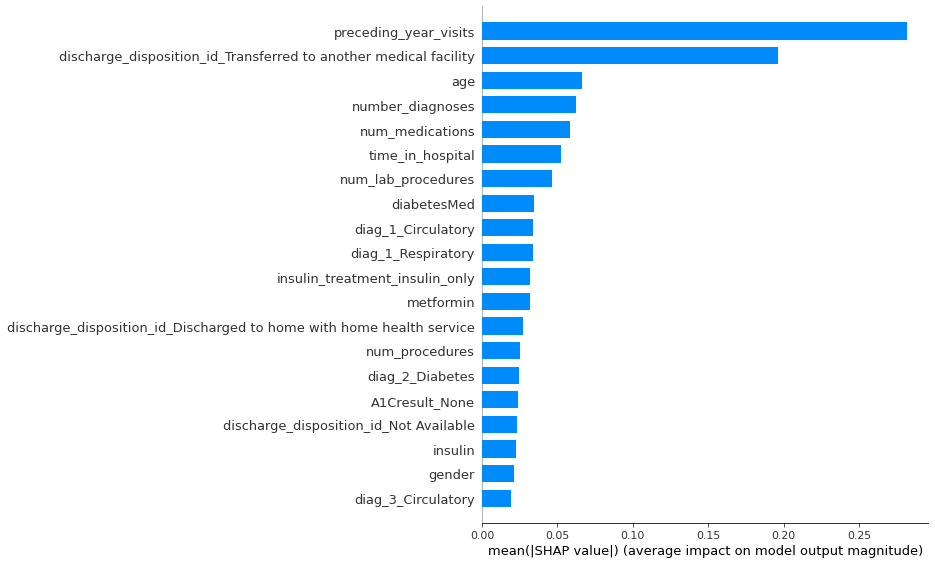

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

### SHAP Summary Plot

Besides a typical feature importance bar chart, SHAP also enables us to use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the age and marital status feature has more total model impact than the captial gain feature, but for those samples where capital gain matters it has more impact than age or marital status. In other words, capital gain effects a few predictions by a large amount, while age or marital status effects all predictions by a smaller amount.

Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

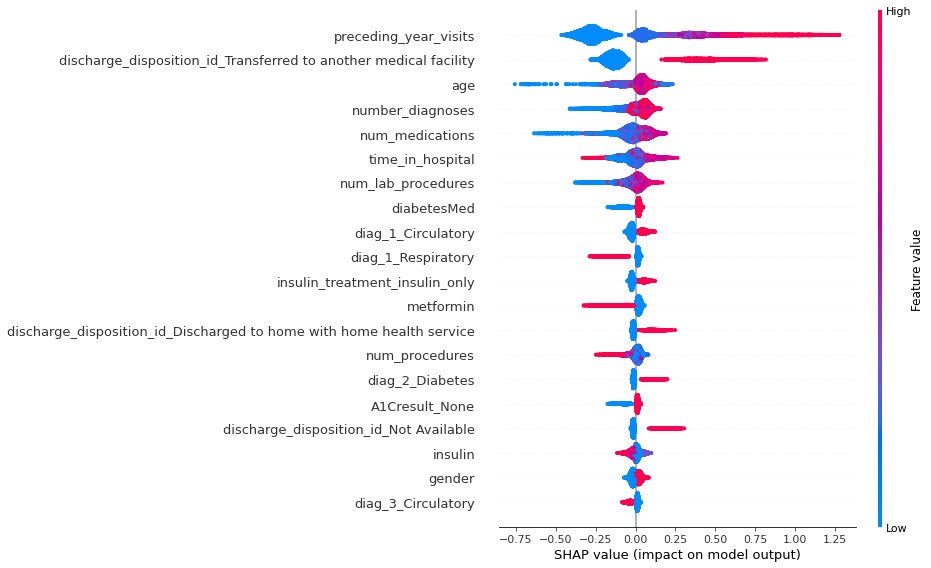

In [ ]:
shap.summary_plot(shap_values, X_test)

### SHAP Dependence Plots

SHAP dependence plots show the effect of a single (or two) feature across the whole dataset. They plot a feature's value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature can be chosen for coloring to highlight possible interactions.

You will also notice it's similarity with Skater's Partial Dependence Plots!

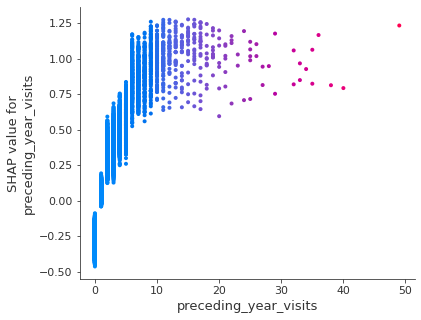

In [ ]:
shap.dependence_plot(ind='preceding_year_visits', interaction_index='preceding_year_visits',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

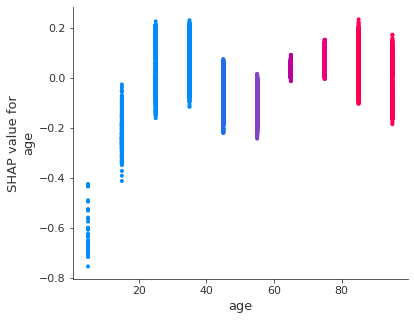

In [ ]:
shap.dependence_plot(ind='age', interaction_index='age',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

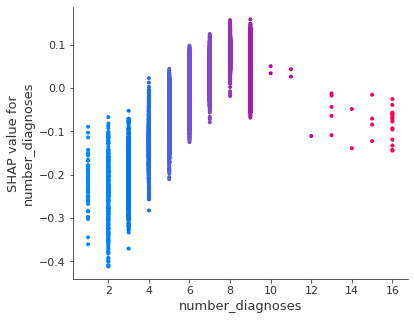

In [ ]:
shap.dependence_plot(ind='number_diagnoses', interaction_index='number_diagnoses',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

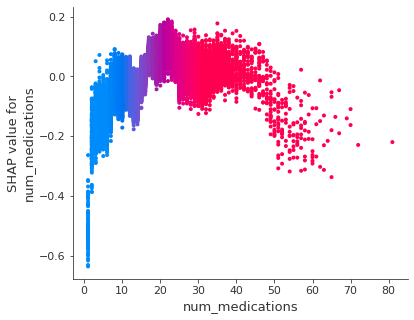

In [ ]:
shap.dependence_plot(ind='num_medications', interaction_index='num_medications',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

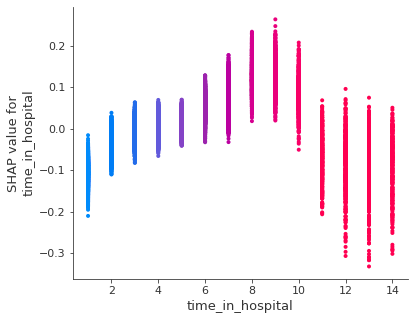

In [ ]:
shap.dependence_plot(ind='time_in_hospital', interaction_index='time_in_hospital',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

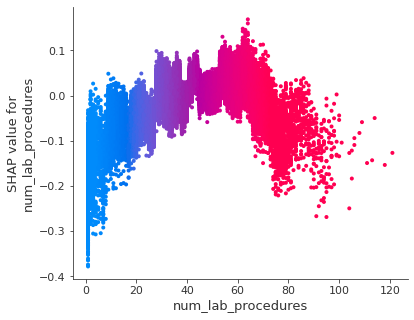

In [ ]:
shap.dependence_plot(ind='num_lab_procedures', interaction_index='num_lab_procedures',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

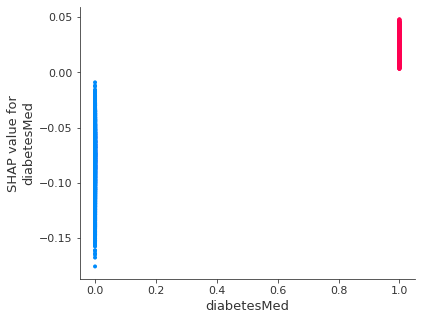

In [ ]:
shap.dependence_plot(ind='diabetesMed', interaction_index='diabetesMed',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

# Range Estimate Recall (Final LGBM)

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold, cross_val_score, permutation_test_score
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from lightgbm import LGBMClassifier
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.over_sampling import SMOTE, SMOTENC, RandomOverSampler
from imblearn.combine import SMOTETomek
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.utils import resample
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


Iteration 0 1601719863.2786472
0.6141231593038822
Iteration 1 1601719870.9209428
0.6080267558528428
Iteration 2 1601719873.6266053
0.6074517631403858
Iteration 3 1601719876.258448
0.6325100133511349
Iteration 4 1601719878.9172356
0.6253342245989305
Iteration 5 1601719881.6549594
0.6093178036605658
Iteration 6 1601719884.344955
0.6049218490189557
Iteration 7 1601719887.0356991
0.616406509465294
Iteration 8 1601719889.7146091
0.6091455273698264
Iteration 9 1601719892.4621835
0.6252498334443705
Iteration 10 1601719895.192363
0.6062416998671979
Iteration 11 1601719897.8669424
0.6152311273694713
Iteration 12 1601719900.6451783
0.6205980066445183
Iteration 13 1601719903.4335244
0.6205744822979292
Iteration 14 1601719906.084635
0.6209650582362729
Iteration 15 1601719908.7645319
0.6172057352450817
Iteration 16 1601719911.4208324
0.6169648774022531
Iteration 17 1601719914.1686776
0.609
Iteration 18 1601719916.8431559
0.6168939142001996
Iteration 19 1601719919.5522568
0.5964854111405835
Iteratio

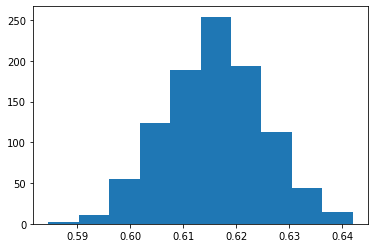

95.0 confidence interval 59.7% and 63.4%


In [ ]:
n_iterations = 1000
# run bootstrap
stats = list()
for i in range(n_iterations):
    print("Iteration", i, time.time())
    # prepare train and test sets
    df_sample = df.sample(frac = 0.9, random_state = i)
    X_sample = df_sample.drop(['readmitted'], 1)
    y_sample = df_sample['readmitted']
    X_dum_sample = pd.get_dummies(X_sample, drop_first = True)
    X_dum_sample.columns = ["".join (c if c.isalnum() else "_" for c in str(x)) for x in X_dum_sample.columns]
    X_train, X_test, y_train, y_test = train_test_split(X_dum_sample, y_sample, test_size = 0.3, random_state = i, stratify = y_sample)
    # fit model
    model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True, silent = False,
                       colsample_bytree= 0.7, learning_rate= 0.055499999999999994, max_depth= 309, min_child_samples= 28,
                       n_estimators= 180, num_leaves= 31, reg_alpha= 50, reg_lambda= 5, subsample= 0.7, subsample_freq= 2)
    model.fit(X_train, y_train)
    # evaluate model
    predictions = model.predict(X_test)
    score = recall_score(y_test, predictions)
    print(score)
    stats.append(score)
# plot scores
plt.hist(stats)
plt.show()
# confidence intervals
alpha = 0.95
p = ((1.0-alpha)/2.0) * 100
lower = max(0.0, np.percentile(stats, p))
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(stats, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))